# Section 0 - General setup
In this section we will import the necessary libraries needed in most of the document and download the files needed for this notebook.

## Importing the libraries

In [2]:
# install libraries
#!pip install pandas numpy matplotlib seaborn pyarrow fastparquet

In [3]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Downloading the dataset

In [4]:
# download dataset
#![ -f ssh_attacks.parquet ] && wget https://nextcloud.rand-server.duckdns.org/s/BTjsqebGQZkErkN/download/ssh_attacks.parquet]

In [5]:
dataset = pd.read_parquet('ssh_attacks.parquet')
dataset.head()

,session_id,full_session,first_timestamp,Set_Fingerprint
0,0,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:45:11.151186+00:00,"[Defense Evasion, Discovery]"
1,1,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:45:50.396610+00:00,"[Defense Evasion, Discovery]"
2,2,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:54:41.863315+00:00,"[Defense Evasion, Discovery]"
3,3,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 10:22:14.623875+00:00,"[Defense Evasion, Discovery]"
4,4,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 10:37:19.725874+00:00,"[Defense Evasion, Discovery]"


# Section 1 – Data exploration and pre-processing
## When are the attacks performed
First of all, some data manipulation is in order.
We expand the dataframe to allow more granular analisys.

In [6]:
# Adding columns to dataset for future use(?)
dataset['date'] = pd.to_datetime(dataset['first_timestamp']).dt.date
dataset['hour'] = pd.to_datetime(dataset['first_timestamp']).dt.hour
dataset.head()

,session_id,full_session,first_timestamp,Set_Fingerprint,date,hour
0,0,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:45:11.151186+00:00,"[Defense Evasion, Discovery]",2019-06-04,9
1,1,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:45:50.396610+00:00,"[Defense Evasion, Discovery]",2019-06-04,9
2,2,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 09:54:41.863315+00:00,"[Defense Evasion, Discovery]",2019-06-04,9
3,3,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 10:22:14.623875+00:00,"[Defense Evasion, Discovery]",2019-06-04,10
4,4,enable ; system ; shell ; sh ; cat /proc/mount...,2019-06-04 10:37:19.725874+00:00,"[Defense Evasion, Discovery]",2019-06-04,10


Text(0.5, 1.0, 'Distribution of attacks by date')

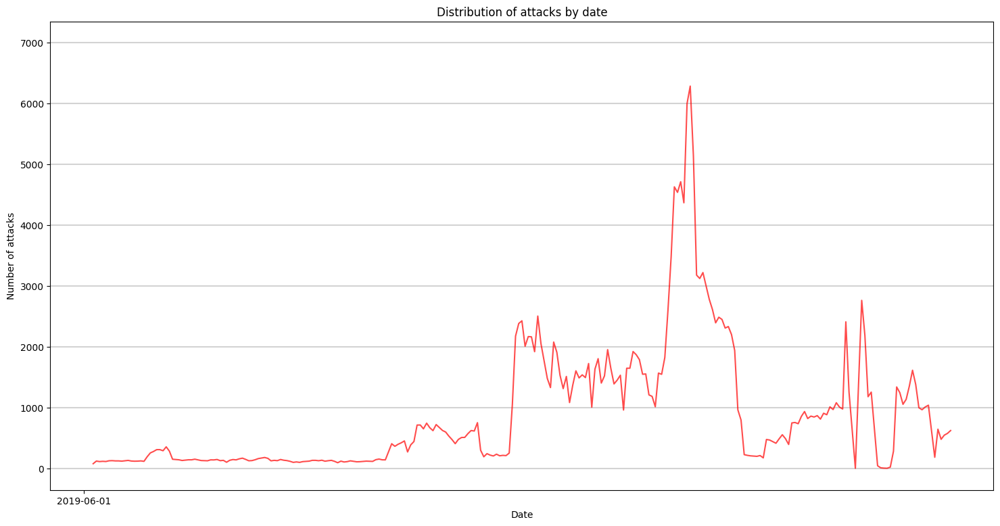

In [7]:
import pandas as pd

# Aggregate data by date
agg_data = dataset.groupby('date').size()

plt.figure(figsize=(18,9))
g = sns.lineplot(
	data=agg_data,
	color='red',
	alpha=0.7
)

# Setup ticks
g.set_xticks(g.get_xticks()[::30])
yticks = g.get_yticks()
for y in yticks:
	if y >= 0:  # Only add line if y is non-negative
		g.axhline(y, color='lightgrey', zorder=1 )

# Setup labels
plt.xlabel('Date')
plt.ylabel('Number of attacks')
plt.title('Distribution of attacks by date')

Using the lineplot that has been just presented, is it possible to note that, in the first period of time, from june 2019 to october of the same year, there hasnt been that much attack, which are concentrated in the period from around mid october until the end of december of the same year.

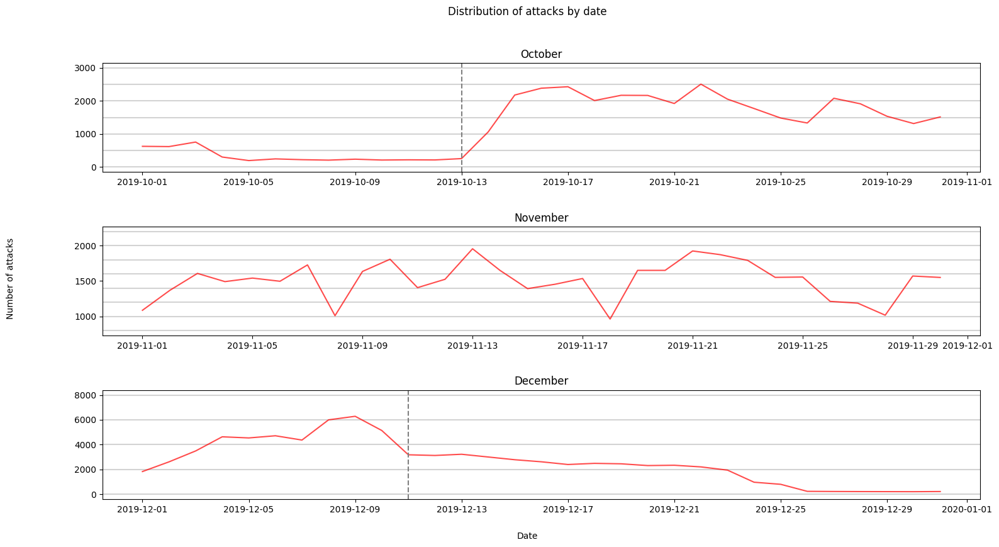

In [8]:
# Define the start and end dates for each month
months = [
	('October', '2019-10-01', '2019-11-01'),
	('November', '2019-11-01', '2019-12-01'),
	('December', '2019-12-01', '2020-01-01')
]

fig, axs = plt.subplots(3, figsize=(18,9))
plt.subplots_adjust(hspace=0.5) # Padding

# For each month
for i, (month, start_date, end_date) in enumerate(months):
	# Filter the data for the current month
	month_data = dataset[
		(dataset['date'] >= pd.to_datetime(start_date).date()) &
		(dataset['date'] < pd.to_datetime(end_date).date())
	]

	# Aggregate data by date
	agg_data = month_data.groupby('date').size()

	sns.lineplot(
		data=agg_data,
		color='red',
		alpha=0.7,
		ax=axs[i]
	)
	axs[i].set_title(month)
	axs[i].set(xlabel=None, ylabel=None)

	# Setup ticks and grid
	yticks = axs[i].get_yticks()
	for y in yticks:
		if y >= 0:  # Only add line if y is non-negative
			axs[i].axhline(y, color='lightgrey',zorder=1)

	# Vertical line on October 13th for the first subplot (October)
	if i == 0:
		axs[i].axvline(pd.to_datetime('2019-10-13').date(), color='grey', linestyle='--')

	# Vertical line on November 22nd for the second subplot (November)
	if i == 2:
		axs[i].axvline(pd.to_datetime('2019-12-11').date(), color='grey', linestyle='--')

# Setup labels
fig.text(0.5, 0.04, 'Date', ha='center')
fig.text(0.04, 0.5, 'Number of attacks', va='center', rotation='vertical')

# Setup title
fig.suptitle('Distribution of attacks by date')

plt.show()

Looking at the graphs above, it is possible to notice how the number of attacks has increased starting by october 14th and has really started decreasing by the 11th of december. 

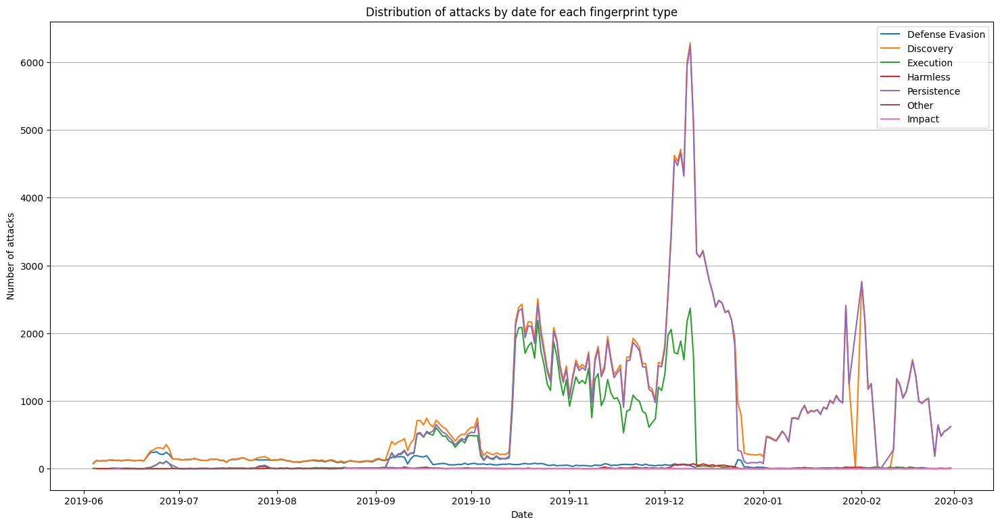

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(18,9))

# Unique labels
ll = dataset['Set_Fingerprint'].explode().unique()

# For each unique label
for value in ll:
	# Filter the data for the current value
	value_data = dataset[dataset['Set_Fingerprint'].apply(lambda x: value in x)]

	# Aggregate data by date
	agg_data = value_data.groupby('date').size()

	# Plot the data
	sns.lineplot(
		data=agg_data,
		label=value
	)

plt.xlabel('Date')
plt.ylabel('Number of attacks')
plt.title('Distribution of attacks by date for each fingerprint type')

plt.grid(axis='y')  # Horizontal grid lines

plt.legend()
plt.show()

After looking at the date of the attacks, lets now analyze the distribution of them during the day. Taking a look at the distribution of commands, it is possible to notice that most of them comes between 11pm and 12pm.(The image uses a 24 hour format).

Text(0.5, 1.0, 'Distribution of attacks by hour')

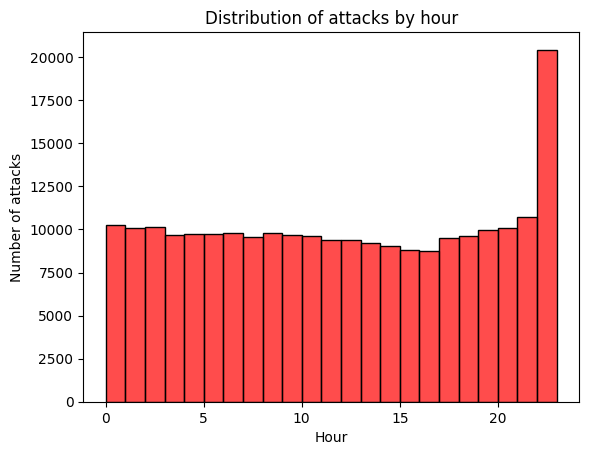

In [10]:
# print(dataset['hour'].unique())
g = sns.histplot(
    data=dataset,
    x="hour",
    color='red',
    alpha=0.7,
    edgecolor='black',
    kde=False,
    binwidth=1
)

# Setup labels
plt.xlabel('Hour')
plt.ylabel('Number of attacks')
plt.title('Distribution of attacks by hour')

Taking a closer look to the distribution of commands during the day for each month, it seems like it is also true for each month, while remaining constant during the whole day.

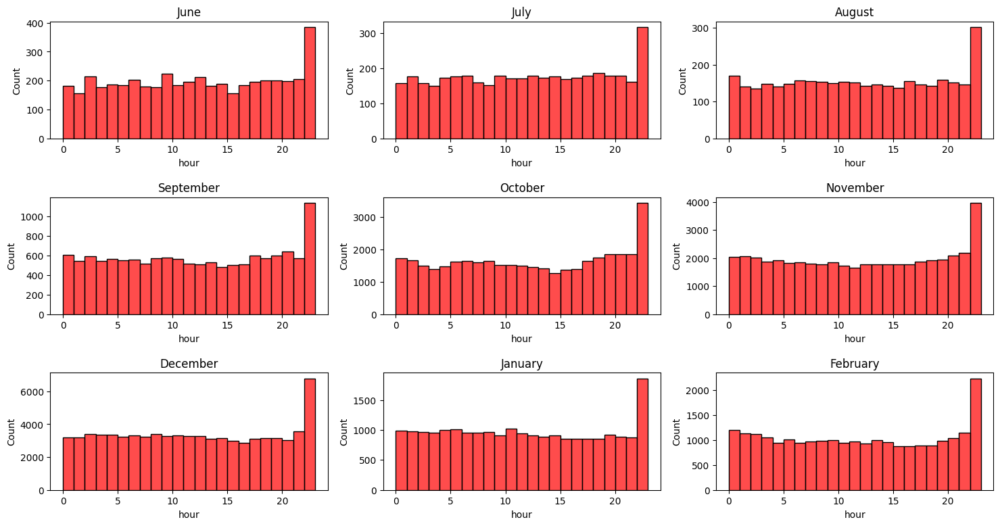

In [11]:
# Start and end dates for each month
months = [
    ('June', '2019-6-01', '2019-7-01'),
    ('July', '2019-7-01', '2019-8-01'),
    ('August', '2019-8-01', '2019-9-01'),
    ('September', '2019-9-01', '2019-10-01'),
    ('October', '2019-10-01', '2019-11-01'),
    ('November', '2019-11-01', '2019-12-01'),
    ('December', '2019-12-01', '2020-1-01'),
    ('January', '2020-1-01', '2020-2-01'),
    ('February', '2020-2-01', '2020-3-01')
]

fig, axs = plt.subplots(3, 3, figsize=(18, 9))
plt.subplots_adjust(hspace=0.5)

# For each month
for i, (month, start_date, end_date) in enumerate(months):
    # Calculate the row and column indices for the subplot
    row = i // 3
    col = i % 3

    # Filter the data for the current month
    month_data = dataset[
        (dataset['date'] >= pd.to_datetime(start_date).date()) &
        (dataset['date'] < pd.to_datetime(end_date).date())
    ]

    # Plot the data
    sns.histplot(
        data=month_data,
        bins=31,
        x="hour",
        color='red',
        alpha=0.7,
        edgecolor='black',
        binwidth=1,
        ax=axs[row, col]
    )
    axs[row, col].set_title(month)

plt.show()

### Emperical Distribution of the words


Taking a look ad the ECDF of the character count of each record, it is possible to notice that most of the records have a small character count(which is smaller than 1934 for 99% of the records, as it is possible to learn looking at the 99th percentile of the distribution). Only 1% of the records have a character count greater than 1934, by a lot.

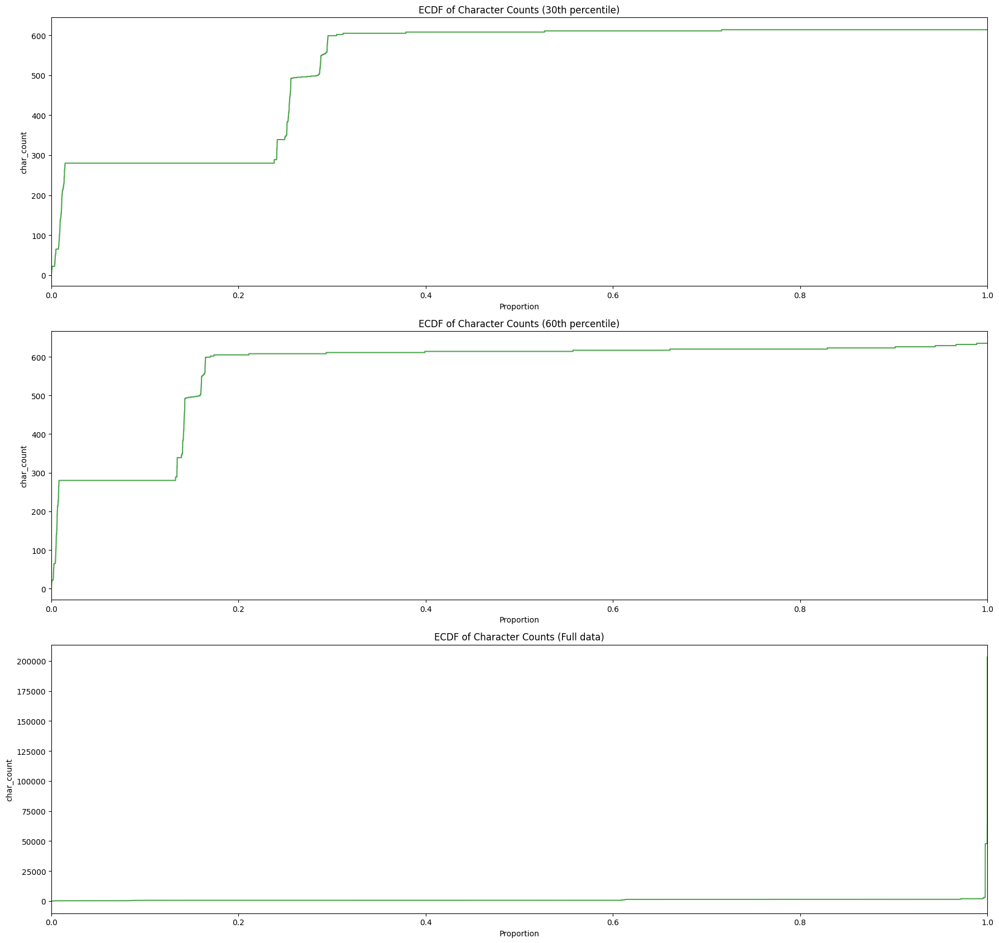

0th percentile: 3.0
10th percentile: 599.0
20th percentile: 611.0
30th percentile: 614.0
40th percentile: 620.0
50th percentile: 620.0
60th percentile: 635.0
70th percentile: 1414.0
80th percentile: 1416.0
90th percentile: 1418.0
99th percentile: 1934.0
99.9th percentile: 47807.0
100th percentile: 203442.0


In [12]:
fig, axs = plt.subplots(3, figsize=(18, 17))

dataset['char_count'] = dataset['full_session'].str.len()

# 30th percentile
dataset_30 = dataset[dataset['char_count'] <= dataset['char_count'].quantile(0.3)]
sns.ecdfplot(
    data=dataset_30,
    y="char_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[0]
)
axs[0].set_title('ECDF of Character Counts (30th percentile)')

# 60th percentile
dataset_60 = dataset[dataset['char_count'] <= dataset['char_count'].quantile(0.6)]
sns.ecdfplot(
    data=dataset_60,
    y="char_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[1]
)
axs[1].set_title('ECDF of Character Counts (60th percentile)')

# Full data
sns.ecdfplot(
    data=dataset,
    y="char_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[2]
)
axs[2].set_title('ECDF of Character Counts (Full data)')

plt.tight_layout()
plt.show()

# Print every 10th percentile and also 99th
for i in range(0, 100, 10):
	print(f'{i}th percentile: {np.percentile(dataset["char_count"], i)}')

print(f'99th percentile: {np.percentile(dataset["char_count"], 99)}')
print(f'99.9th percentile: {np.percentile(dataset["char_count"], 99.9)}')
print(f'100th percentile: {np.percentile(dataset["char_count"], 100)}')


The same thing is true for the number of words in each record, which is quite small for 99% of the records.

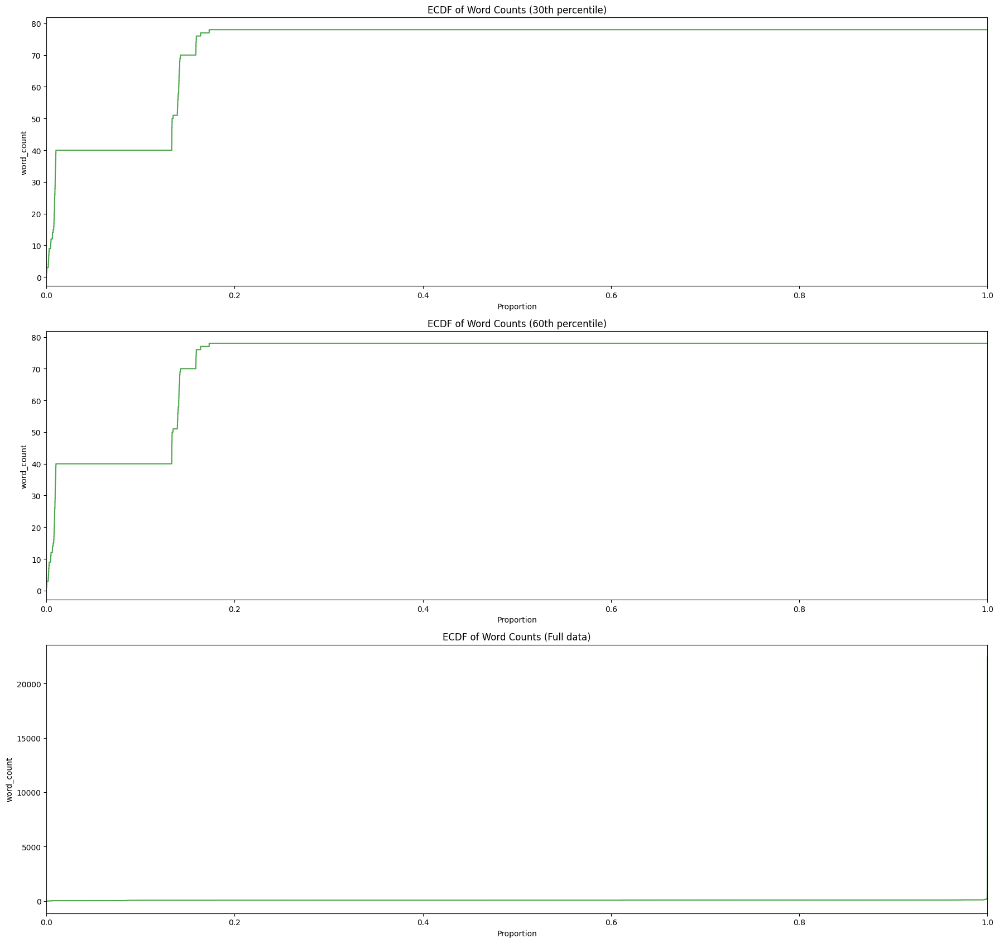

0th percentile: 1.0
10th percentile: 76.0
20th percentile: 78.0
30th percentile: 78.0
40th percentile: 78.0
50th percentile: 78.0
60th percentile: 78.0
70th percentile: 92.0
80th percentile: 92.0
90th percentile: 92.0
99th percentile: 107.0
99.9th percentile: 168.0
100th percentile: 22438.0


In [13]:
import re

# Words are defined as any sequence of characters that contains at least one letter or number
dataset['words'] = dataset['full_session'].apply(lambda x: [word for word in x.split() if re.search(r'\S*\w+\S*', word)])
dataset['word_count'] = dataset['words'].apply(len)

fig, axs = plt.subplots(3, figsize=(18, 17))

# 30th percentile
dataset_30 = dataset[dataset['word_count'] <= dataset['word_count'].quantile(0.3)]
sns.ecdfplot(
    data=dataset_30,
    y="word_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[0]
)
axs[0].set_title('ECDF of Word Counts (30th percentile)')

# 60th percentile
dataset_60 = dataset[dataset['word_count'] <= dataset['word_count'].quantile(0.6)]
sns.ecdfplot(
    data=dataset_60,
    y="word_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[1]
)
axs[1].set_title('ECDF of Word Counts (60th percentile)')

# Full data
sns.ecdfplot(
    data=dataset,
    y="word_count",
    stat="proportion",
    color='green',
    alpha=0.7,
    ax=axs[2]
)
axs[2].set_title('ECDF of Word Counts (Full data)')

plt.tight_layout() # Padding
plt.show()

# Print every 10th percentile and also 99th
for i in range(0, 100, 10):
	print(f'{i}th percentile: {np.percentile(dataset["word_count"], i)}')

print(f'99th percentile: {np.percentile(dataset["word_count"], 99)}')
print(f'99.9th percentile: {np.percentile(dataset["word_count"], 99.9)}')
print(f'100th percentile: {np.percentile(dataset["word_count"], 100)}')


### Common words
Lets take a look at the most common words for each sessions. The most common words used are for reading files, such as cat, to filter its content(grep).

0                   enable
1                   system
2                    shell
3                       sh
4                      cat
                 ...      
18836449         qwe@1234"
18836450       /tmp/up.txt
18836451                rm
18836452               -rf
18836453    /var/tmp/dota*
Name: words, Length: 18836454, dtype: object


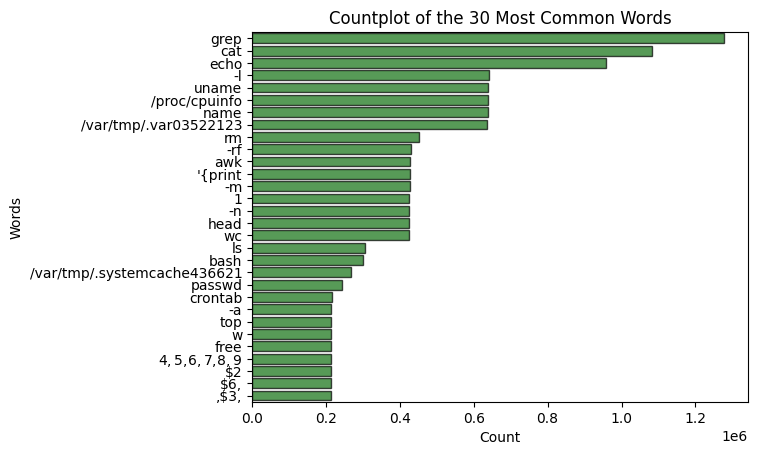

In [14]:
flattened = dataset['words'].explode().reset_index(drop=True)
print(flattened)

# 20 most common words
top_20_words = flattened.value_counts().nlargest(30).index

sns.countplot(
    y=flattened,
    order=top_20_words,
    color='green',
    alpha=0.7,
    edgecolor='black',
)

plt.title('Countplot of the 30 Most Common Words')
plt.xlabel('Count')
plt.ylabel('Words')

plt.show()

In [15]:
# convert each unique word to an integer unique value
unique_words = flattened.unique()
print(len(unique_words))
word_to_int = {word: i for i, word in enumerate(unique_words)}
int_to_word = {i: word for i, word in enumerate(unique_words)}

# convert each word to its integer value
dataset['int_words'] = dataset['words'].apply(lambda x: [word_to_int[word] for word in x])

400821


### Session intent analisys
Lets now observe the intents of the attackers. As it is possible to observe from the following picture, the most common intent for a command is 'Discovery', followed by 'Persistent' and 'Execution'. The number of commands with different intents in quite lower in contrast of those three.

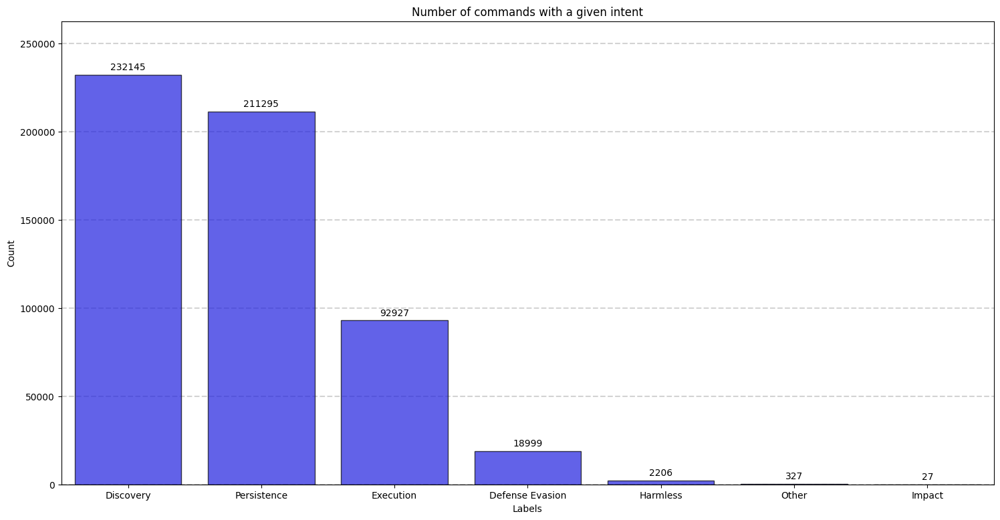

In [16]:
plt.figure(figsize=(18,9))

# List of all labels
flattended = dataset['Set_Fingerprint'].explode()
ay = sns.countplot(
	x=flattened,
	color='blue',
	alpha=0.7,
	edgecolor='black',
	order = dataset['Set_Fingerprint'].explode().value_counts().index
)
plt.title('Number of commands with a given intent')
plt.xlabel('Labels')
plt.ylabel('Count')

# Count annotations to each bar with padding
for label in ay.containers:
	ay.bar_label(label, label_type='edge', padding=3)

# Horizontal lines at every y-axis tick
yticks = plt.gca().get_yticks()
for y in yticks:
	plt.axhline(y, color='lightgrey', linestyle='--', zorder=0)  # Draw lines in the background

plt.show()

As for what concearns the number of intents for each session, each command has usually 2 or 3 intents, sometimes 1 or 4. The command with the most intents are the ones received from septermber until mid december.

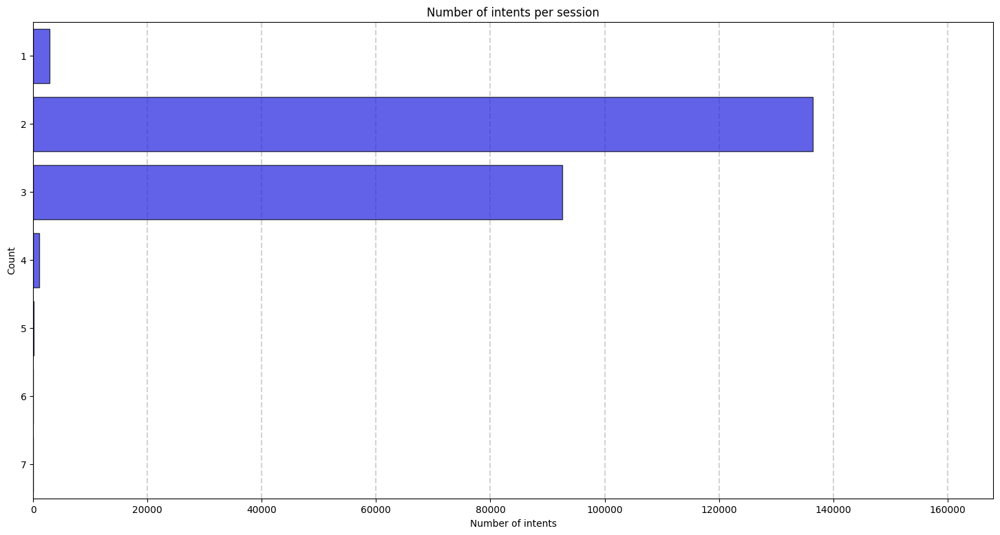

2.39417254918789


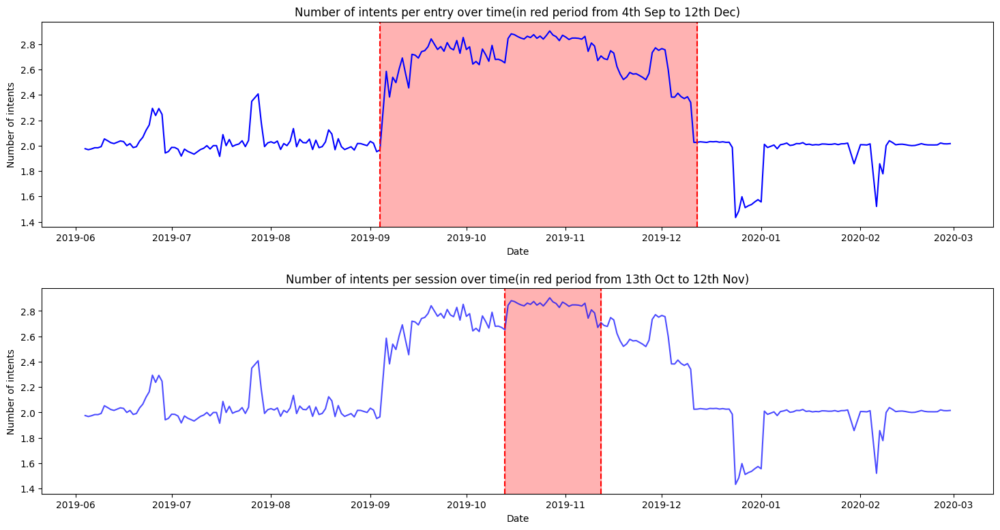

In [17]:
plt.figure(figsize=(18,9))

# Count of the different intents for each entry
dataset['intent_counts'] = dataset['Set_Fingerprint'].apply(lambda x:len(np.unique(x)))

ax = sns.countplot(
	data=dataset,
	y="intent_counts",
	color='blue',
	alpha=0.7,
	edgecolor='black',
)
plt.title('Number of intents per session')
plt.xlabel('Number of intents')
plt.ylabel('Count')

# Vertical lines at every x-axis tick
xticks = ax.get_xticks()
for x in xticks:
	ax.axvline(x, color='lightgrey', linestyle='--', zorder=0)  # Draw lines in the background

plt.show()

print(dataset['intent_counts'].mean()) # Average number of intents per entry

###############################################
fig, axs = plt.subplots(2, figsize=(18, 9))

sns.lineplot(
    data=dataset,
    x="date",
    y="intent_counts",
    color='blue',
	errorbar=None,
    ax=axs[0]
)

axs[0].set_title('Number of intents per entry over time(in red period from 4th Sep to 12th Dec)')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Number of intents')

axs[0].axvline(pd.to_datetime('2019-9-4').date(), color='red', linestyle='--')
axs[0].axvline(pd.to_datetime('2019-12-12').date(), color='red', linestyle='--')

# highlight the background for 4th September to 12th December
start_date = pd.to_datetime('2019-9-4').date()
end_date = pd.to_datetime('2019-12-12').date()
axs[0].axvspan(start_date, end_date, color='red', alpha=0.3)

sns.lineplot(
	data=dataset,
	x="date",
	y="intent_counts",
	color='blue',
	alpha=0.7,
	errorbar=None,
	ax=axs[1]
)

# Vertical line for October 13th
axs[1].axvline(pd.to_datetime('2019-10-13').date(), color='red', linestyle='--')
axs[1].axvline(pd.to_datetime('2019-11-12').date(), color='red', linestyle='--')


# highlight the background for October 13th to 20th
start_date = pd.to_datetime('2019-10-13').date()
end_date = pd.to_datetime('2019-11-12').date()
axs[1].axvspan(start_date, end_date, color='red', alpha=0.3)

axs[1].set_title('Number of intents per session over time(in red period from 13th Oct to 12th Nov)')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Number of intents')

# Padding between subplots
plt.subplots_adjust(hspace=0.3)


plt.show()

### Bag of words
Lets now rappresent the words in a numerical way, using a bag of words approach. Having computated the most common words before, we adopt the same approach, limiting the bag of words to the x most common words to avoid having too big of a dataframe, and also reduce the computational time.

In [18]:
from collections import Counter
# limit wordlist to avoid high memory usage
wordlist = [word[0] for word in Counter(dataset['int_words'].explode()).most_common(100)]

# bag of words
counters = []
for words in dataset['int_words']:
	word_counts = Counter(word for word in words if word in wordlist)
	counters.append(word_counts)

bow = pd.DataFrame(counters, columns=wordlist ).fillna(0).astype(np.uint32)
bow.index = dataset.index
print(bow.head())

   891     4       23      894     514     198     892     898     26      \
0       0       3       1       0       0       0       0       0       1   
1       0       3       1       0       0       0       0       0       1   
2       0       3       1       0       0       0       0       0       1   
3       0       3       1       0       0       0       0       0       1   
4       0       3       1       0       0       0       0       0       1   

   72      ...  211334  211335  211337  53      13501   13503   191     \
0       0  ...       0       0       0       0       0       0       0   
1       0  ...       0       0       0       0       0       0       0   
2       0  ...       0       0       0       0       0       0       0   
3       0  ...       0       0       0       0       0       0       0   
4       0  ...       0       0       0       0       0       0       0   

   190     1374    21512   
0       0       0       0  
1       0       0       0  
2       

### TF-IDF values
Lets now calculate the TF-IDF values for each word.

In [19]:
from sklearn.feature_extraction.text import TfidfTransformer

transformer = TfidfTransformer() # Transform a count matrix to a normalized tf or tf-idf representation

# Compute TF-IDF
tfidf = transformer.fit_transform(bow)

# Convert to a DataFrame
tfidf_df = pd.DataFrame.sparse.from_spmatrix(tfidf, columns=bow.columns)
tfidf_df.index = dataset.index
print(tfidf_df.head())

   891       4         23      894     514     198     892     898     \
0     0.0  0.106191  0.035365     0.0     0.0     0.0     0.0     0.0   
1     0.0  0.106191  0.035365     0.0     0.0     0.0     0.0     0.0   
2     0.0  0.106191  0.035365     0.0     0.0     0.0     0.0     0.0   
3     0.0  0.106191  0.035365     0.0     0.0     0.0     0.0     0.0   
4     0.0  0.106191  0.035365     0.0     0.0     0.0     0.0     0.0   

     26      72      ...  211334  211335  211337  53      13501   13503   \
0  0.035476     0.0  ...     0.0     0.0     0.0     0.0     0.0     0.0   
1  0.035476     0.0  ...     0.0     0.0     0.0     0.0     0.0     0.0   
2  0.035476     0.0  ...     0.0     0.0     0.0     0.0     0.0     0.0   
3  0.035476     0.0  ...     0.0     0.0     0.0     0.0     0.0     0.0   
4  0.035476     0.0  ...     0.0     0.0     0.0     0.0     0.0     0.0   

   191     190     1374    21512   
0     0.0     0.0     0.0     0.0  
1     0.0     0.0     0.0     0.

### Additional stuff
This section contains all the plots that we tried and werent used in the relation.


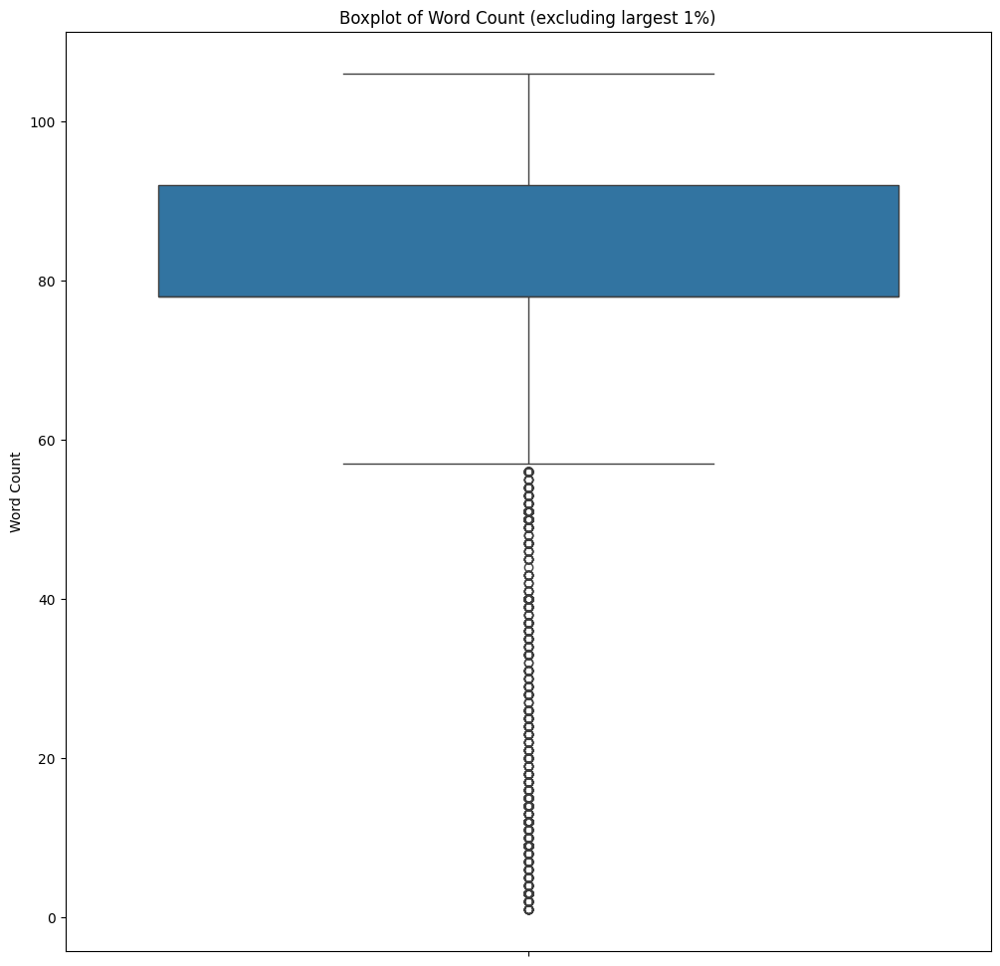

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the 99th percentile
q = dataset['word_count'].quantile(0.99)

# Filter the data
filtered_data = dataset[dataset['word_count'] < q]

plt.figure(figsize=(12, 12))

# Create boxplot
sns.boxplot(y='word_count', data=filtered_data)

plt.title('Boxplot of Word Count (excluding largest 1%)')
plt.ylabel('Word Count')
plt.show()

C:\Users\loren\AppData\Local\Temp\ipykernel_12184\2581598579.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  value_data['word_count'] = value_data['word_count']


         label  word_count
557921  Impact          24
557922  Impact          47
557923  Impact          47
557924  Impact          58
557925  Impact         164


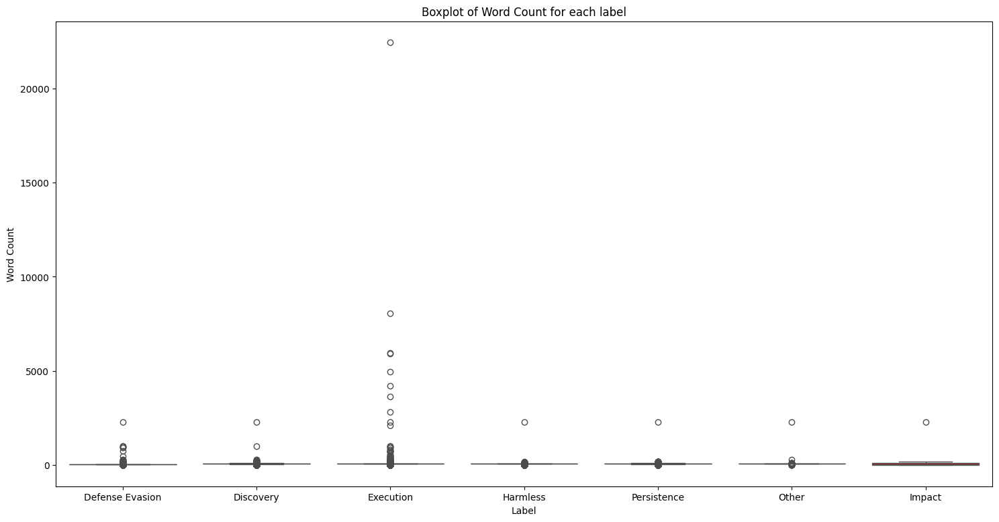

In [44]:
new_dataset = pd.DataFrame()

# Iterate over the unique label
for value in ll:
	# Filter the data for the current value
	value_data = dataset[dataset['Set_Fingerprint'].apply(lambda x: value in x)]
	
	# Calculate word count for each session
	value_data['word_count'] = value_data['word_count']
	
	value_df = pd.DataFrame({
		'label': value,
		'word_count': value_data['word_count']
	})
	
	# Append to the new dataset
	new_dataset = pd.concat([new_dataset, value_df])

new_dataset.reset_index(drop=True, inplace=True)

print(new_dataset.tail())

plt.figure(figsize=(18,9))

sns.boxplot(
	data=new_dataset,
	x='label',
	y='word_count',
	color='red'
)

plt.title(f'Boxplot of Word Count for each label')
plt.xlabel('Label')
plt.ylabel('Word Count')

plt.show()

C:\Users\loren\AppData\Local\Temp\ipykernel_12184\1200791439.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  value_data['word_count'] = value_data['word_count']


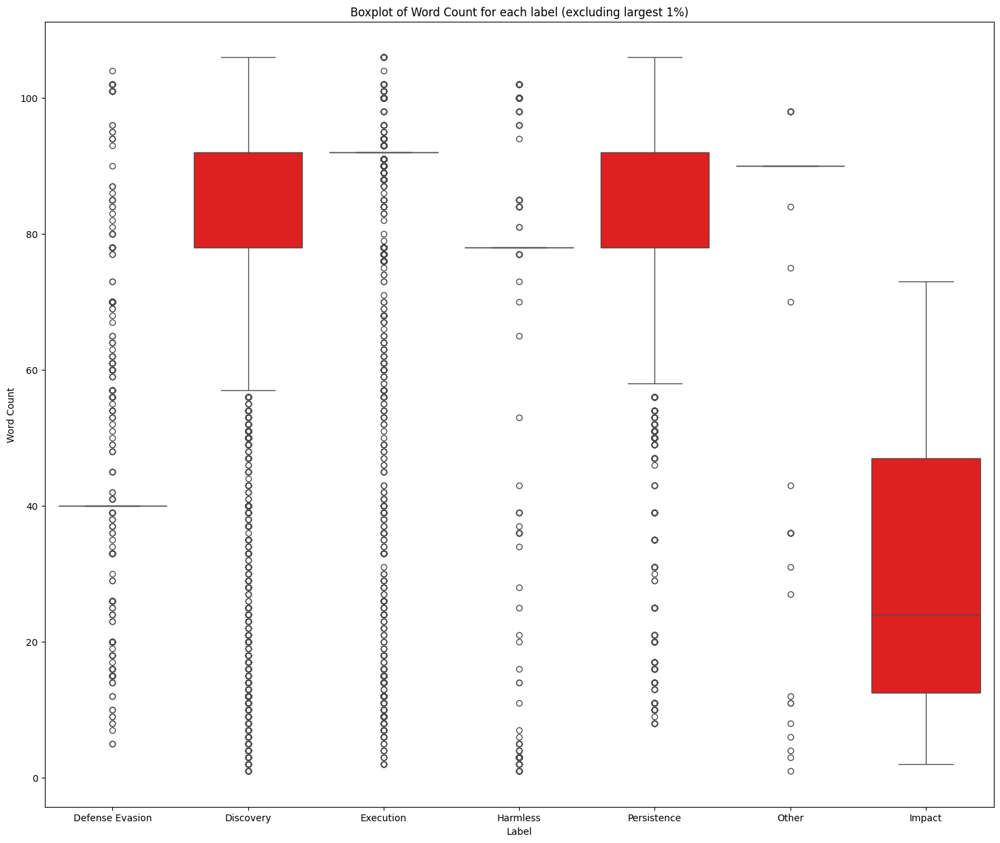

In [42]:
new_dataset = pd.DataFrame()

# Iterate over the unique labels
for value in ll:
    # Filter the data for the current value
    value_data = dataset[dataset['Set_Fingerprint'].apply(lambda x: value in x)]
    
    # Calculate word count for each session
    value_data['word_count'] = value_data['word_count']
    
    value_df = pd.DataFrame({
        'label': value,
        'word_count': value_data['word_count']
    })
    
    # Append to the new dataset
    new_dataset = pd.concat([new_dataset, value_df])

new_dataset.reset_index(drop=True, inplace=True)

# Calculate the 99th percentile
q = new_dataset['word_count'].quantile(0.99)

# Filter the data
filtered_data = new_dataset[new_dataset['word_count'] < q]

plt.figure(figsize=(18,15))

sns.boxplot(
    data=filtered_data,
    x='label',
    y='word_count',
    color='red'
)

plt.title(f'Boxplot of Word Count for each label (excluding largest 1%)')
plt.xlabel('Label')
plt.ylabel('Word Count')

plt.show()

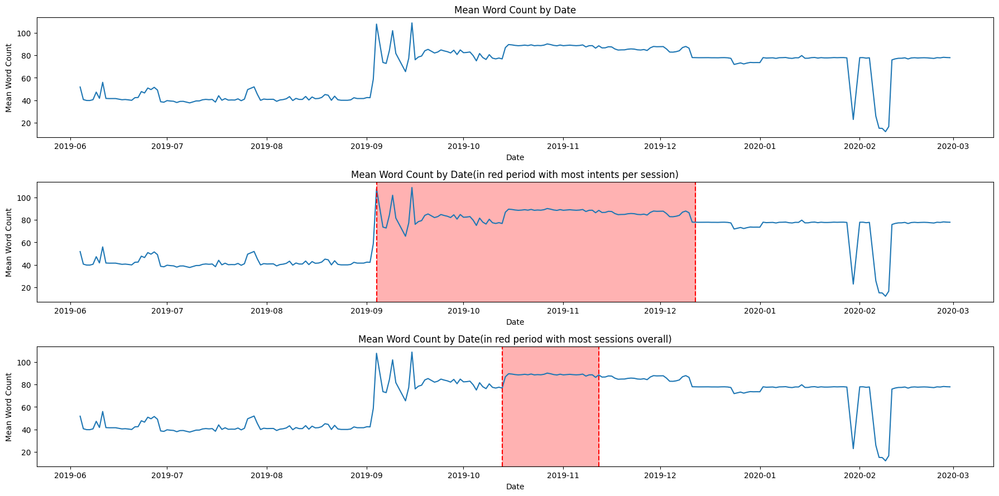

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

dataset_copy = dataset.copy()
dataset_copy['date'] = pd.to_datetime(dataset_copy['date'])

# Calculate mean word count by date
mean_word_count_by_date = dataset_copy.groupby('date')['word_count'].mean().reset_index()

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(18, 9))

sns.lineplot(
	data=mean_word_count_by_date, 
	x='date', 
	y='word_count',
	ax=ax1
)
ax1.set_title('Mean Word Count by Date')
ax1.set_xlabel('Date')
ax1.set_ylabel('Mean Word Count')

sns.lineplot(
	data=mean_word_count_by_date, 
	x='date', 
	y='word_count',
	ax=ax2
)
ax2.axvline(pd.to_datetime('2019-9-4').date(), color='red', linestyle='--')
ax2.axvline(pd.to_datetime('2019-12-12').date(), color='red', linestyle='--')

# highlight the background for 4th September to 12th December
start_date = pd.to_datetime('2019-9-4').date()
end_date = pd.to_datetime('2019-12-12').date()
ax2.axvspan(start_date, end_date, color='red', alpha=0.3)

ax2.set_title('Mean Word Count by Date(in red period with most intents per session)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Mean Word Count')

sns.lineplot(
	data=mean_word_count_by_date, 
	x='date', 
	y='word_count',
	ax=ax3
)

# Vertical line for October 14th
ax3.axvline(pd.to_datetime('2019-10-13').date(), color='red', linestyle='--')
ax3.axvline(pd.to_datetime('2019-11-12').date(), color='red', linestyle='--')

# highlight the background for October 14th to 20th
start_date = pd.to_datetime('2019-10-13').date()
end_date = pd.to_datetime('2019-11-12').date()
ax3.axvspan(start_date, end_date, color='red', alpha=0.3)

ax3.set_title('Mean Word Count by Date(in red period with most sessions overall)')
ax3.set_xlabel('Date')
ax3.set_ylabel('Mean Word Count')

plt.tight_layout()
plt.show()

## Section 2 – Supervised learning – classification

## 2.0 Preparation

### 2.0.1 Imports

In [22]:
#data 
from sklearn.metrics import  auc,  roc_curve, accuracy_score, hamming_loss, f1_score, precision_score, recall_score
from sklearn.metrics import multilabel_confusion_matrix, classification_report

# utlitlies
from sklearn.preprocessing import label_binarize
from sklearn.pipeline import Pipeline

import warnings

# datest split
from sklearn.model_selection import train_test_split

# data vectorization
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# models
from sklearn.base import TransformerMixin
from sklearn.calibration import LinearSVC
from sklearn.multioutput import  MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression

# hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# ensemble
from sklearn.ensemble import VotingClassifier

# class weights
from sklearn.utils import compute_class_weight
from sklearn.utils.class_weight import compute_sample_weight

### 2.0.2 Function Declaretion

In [23]:
# function to print confusion matrix in a correct way each time it is called
def print_confusion_matrix(confusion_matrix, axes, class_label, class_names, fontsize=7):
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cbar=False, ax=axes)
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    axes.set_ylabel('True label')
    axes.set_xlabel('Predicted label')
    # title in bold
    axes.set_title(class_label, fontsize=10, fontweight='bold')


def create_plot(confusion_test, title):
    fig, ax = plt.subplots(2, 4, figsize=(12, 4))
    for axes, cfs_matrix, label in zip(ax.flatten(), confusion_test, labels):
        print_confusion_matrix(cfs_matrix, axes, label, ["N", "Y"])
    fig.tight_layout()
    fig.suptitle(title + " - Confusion Matrix", fontsize=16)
    fig.subplots_adjust(top=0.88)
    fig.delaxes(ax[1,3])
    plt.show()
    return plt
    
'''
Bar plot of the accuracy and hamming loss for each model
'''
    
# Function to create a DataFrame with the results of the models 
def create_results_dataframe(model_names, predictions):
    accuracy_scores = [accuracy_score(y_test, pred) for pred in predictions]
    hamming_losses = [hamming_loss(y_test, pred) for pred in predictions]
    
    results = pd.DataFrame({
        'Model': model_names,
        'Accuracy': accuracy_scores,
        'Hamming Loss': hamming_losses
    })
    
    return results

# Function to plot the accuracy and loss scores for each model in a bar char 
# and highlight the highest accuracy and lowest hamming loss in red
def plot_results(data, title):
    # Create subplots
    # higth is 2*size of data
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    fig.suptitle(title, fontsize=16)

    # Plot accuracy scores
    sns.barplot(
        data=data,
        x='Accuracy',
        y='Model',
        color='blue',
        alpha=0.7,
        edgecolor='black',
        ax=axes[0]
    )
    axes[0].set_title('Accuracy Scores')
    axes[0].set_xlabel('Accuracy (higher is better)')
    axes[0].set_ylabel('Model')

    # Highlight the highest accuracy score
    max_accuracy = data['Accuracy'].max()
    max_accuracy_index = data['Accuracy'].idxmax()
    axes[0].barh(max_accuracy_index, max_accuracy, color='red', alpha=0.7, edgecolor='black')
        
    # Plot hamming loss
    sns.barplot(
        data=data,
        x='Hamming Loss',
        y='Model',
        color='blue',
        alpha=0.7,
        edgecolor='black',
        ax=axes[1]
    )
    axes[1].set_title('Hamming Loss')
    axes[1].set_xlabel('Hamming Loss (lower is better)')
    axes[1].set_ylabel('Model')

    # Highlight the lowest hamming loss
    min_hamming_loss = data['Hamming Loss'].min()
    min_hamming_loss_index = data['Hamming Loss'].idxmin()
    axes[1].barh(min_hamming_loss_index, min_hamming_loss, color='red', alpha=0.7, edgecolor='black')

    plt.tight_layout()
    fig.subplots_adjust(top=0.85)
    return plt


'''
ROC curve for each model
'''

def plt_roc_curve(y_test, predictions, title, class_names):
    
    # Binarize the output
    y_test_bin = label_binarize(y_test, classes=class_names)
    n_classes = y_test_bin.shape[1]
    
    # Create subplots
    fig, axes = plt.subplots(3, 3, figsize=(12, 6))
    fig.suptitle(title + " - ROC Curves", fontsize=16)
    fig.subplots_adjust(top=0.88, hspace=0.6, wspace=0.5)
    #fig.delaxes(axes[1,3])
    fig.delaxes(axes[2,2])
    fig.delaxes(axes[2,1])
    
    
    # Plot ROC curve for each class
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], predictions[:, i])
        roc_auc = auc(fpr, tpr)
        #ax = axes[i // 4, i % 4]
        ax = axes[i // 3, i % 3]
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('Class ' + class_names[i])
        ax.legend(loc="lower right")
    
    plt.show()


## 2.1 Perform a split to segment the dataset into training and test dataset.  

Before splitting the dataset, I need to modify two things in the dataset:
- Creare a column for each label which can thus be seen as a label binary
- merge the list of words in a single string

In [24]:
# Fingerprints possible values
labels = dataset['Set_Fingerprint'].explode().unique()

for value in labels:
    dataset[value] = 0

# create a column for each fingerprint value and set it to 1 if the fingerprint is present
# in this way we can consider the problem as several binary classification problems
for index, row in dataset.iterrows():
    for value in labels:
        if value in row['Set_Fingerprint']:
            dataset.loc[index, value] = 1
            
# ricreate a single string of words from the list of words
dataset['words'] = dataset['words'].apply(lambda x: ' '.join(x))

Now i can split the data into training and test sets (70% training, 30% test)

The random_state parameter is used to ensure we get the same split every time and then work on consistent data

In [25]:
random_value = 39
test_size = 0.3

X_train, X_test, y_train, y_test = train_test_split(
    dataset["words"],
    np.asarray(dataset[labels]), 
    test_size=test_size, 
    random_state=random_value
)

## 2.2 choice and first use of methods

The section will employ selected methods for smoother handling of a multilabel dataset through the use of pipelines. These pipelines execute a sequence of predefined transformations, consisting of two main steps defined in this case:

- "Tfidf": This involves using CountVectorizer followed by TfidfTransformer. It aims to convert the given text into vectors, subsequently transforming them into a normalized tf-idf representation.
- "X_model": In this step, the chosen machine learning (ML) model is encapsulated by the MultiOutputClassifier method. This method facilitates the conversion of various binary methods into multilabels by constructing a classifier for each target.

In [26]:
def run_pipeline(pipeline, X_train, y_train, X_test):
    pipeline.fit(X_train, y_train)
    test_predictions = pipeline.predict(X_test)
    train_predictions = pipeline.predict(X_train)
    return pipeline, test_predictions, train_predictions

# chosen pipelines

LR_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                        ('lr_model', MultiOutputClassifier(LogisticRegression(random_state=random_value), n_jobs=-1))])

# for time reasons, smaller values were chosen than the default values for the first test
RF_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                        ('rf_model', MultiOutputClassifier(RandomForestClassifier(max_depth=5, n_estimators=30,random_state=random_value), n_jobs=-1))])

ADA_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                         ('ada_model', MultiOutputClassifier(AdaBoostClassifier(random_state=random_value), n_jobs=-1))])

'''
The value dual is decleared with the default value for avoid a warning message: 
    /home/ale/Documents/Labs_poli/ML_python/ML4N/venv/lib/python3.11/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
        warnings.warn(
'''
# dual is explicitly set to True (the default value) for avoid a warning message. In all the other cases is set to False because is prefered when n_samples > n_features
LSVC_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                          ('lsvc_model', MultiOutputClassifier(LinearSVC(random_state=random_value, dual=True), n_jobs=-1))])

'''
Import of other models that were tested but not used in the final version

from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.svm import SVC
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multioutput import RegressorChain

REGRESSOR CHAIN TEST
A multi-label model that arranges regressions into a chain, 
tested for find an alternative to the MultiOutputClassifier 
but the results were not satisfactory

LR_chain = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                        ('lr_model', RegressorChain(LogisticRegression(random_state=random_value, n_jobs=-1)))])

DISCARDED PIPELINES
mainly due to hardware limitations (RAM) and time constraints 
some cells below are presents just for reference with the error messages
or with the exeucation time at the time of the interruption

MLP_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                         ('mpt_model', MultiOutputClassifier(MLPClassifier(alpha=1, max_iter=1000, random_state=random_value), n_jobs=-1))])

GAUS_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                         ('to_dense', DenseTransformer()),
                         ('gaus_model', MultiOutputClassifier(GaussianNB(), n_jobs=-1))])

GPC_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                         ('to_dense', DenseTransformer()),
                         ('gpc_model', MultiOutputClassifier(GaussianProcessClassifier(1.0 * RBF(1.0), random_state=42), n_jobs=-1))])

RBF_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                         ('rbf_model', MultiOutputClassifier(SVC(kernel='rbf', gamma=2, C=1, random_state=42)))])

QUAD_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                          ('to_dense', DenseTransformer()),
                          ('quad_model', MultiOutputClassifier(QuadraticDiscriminantAnalysis(), n_jobs=-1))])

KN_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                        ('kn_model', MultiOutputClassifier(KNeighborsClassifier(3), n_jobs=-1))])
'''


"\nImport of other models that were tested but not used in the final version\n\nfrom sklearn.neural_network import MLPClassifier\nfrom sklearn.naive_bayes import GaussianNB\nfrom sklearn.gaussian_process import GaussianProcessClassifier\nfrom sklearn.gaussian_process.kernels import RBF\nfrom sklearn.svm import SVC\nfrom sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis\nfrom sklearn.neighbors import KNeighborsClassifier\nfrom sklearn.multioutput import RegressorChain\n\nREGRESSOR CHAIN TEST\nA multi-label model that arranges regressions into a chain, \ntested for find an alternative to the MultiOutputClassifier \nbut the results were not satisfactory\n\nLR_chain = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),\n                        ('lr_model', RegressorChain(LogisticRegression(random_state=random_value, n_jobs=-1)))])\n\nDISCARDED PIPELINES\nmainly due to hardware limitations (RAM) and time constraints \nsome cells below are presents just for reference with

### 2.2.1 model training

In [27]:
LR_pipeline, LR_predictions, LR_train_predictions = run_pipeline(LR_pipeline, X_train, y_train, X_test)


In [28]:
RF_pipeline, RF_predictions, RF_train_predictions = run_pipeline(RF_pipeline, X_train, y_train, X_test)

In [29]:
ADA_pipeline, ADA_predictions, ADA_train_predictions = run_pipeline(ADA_pipeline, X_train, y_train, X_test)

In [30]:
LSVC_pipeline, LSVC_predictions, LSVC_train_predictions = run_pipeline(LSVC_pipeline, X_train, y_train, X_test) 

In [31]:
# table with accuracy and hamming loss for each model
results = pd.DataFrame({
    'accuracy': [accuracy_score(y_test, LR_predictions), accuracy_score(y_test, RF_predictions), accuracy_score(y_test, ADA_predictions), accuracy_score(y_test, LSVC_predictions)],
    'hamming_loss': [hamming_loss(y_test, LR_predictions), hamming_loss(y_test, RF_predictions), hamming_loss(y_test, ADA_predictions), hamming_loss(y_test, LSVC_predictions)]
}, index=['Logistic Regression', 'Random Forest', 'ADA Boost', 'Linear SVC'])

print(results)

# the same with the train predictions
train_results = pd.DataFrame({
    'accuracy': [accuracy_score(y_train, LR_train_predictions), accuracy_score(y_train, RF_train_predictions), accuracy_score(y_train, ADA_train_predictions), accuracy_score(y_train, LSVC_train_predictions)],
    'hamming_loss': [hamming_loss(y_train, LR_train_predictions), hamming_loss(y_train, RF_train_predictions), hamming_loss(y_train, ADA_train_predictions), hamming_loss(y_train, LSVC_train_predictions)]
}, index=['Logistic Regression -t', 'Random Forest', 'ADA Boost', 'Linear SVC'])

print(train_results)

,accuracy,hamming_loss
Logistic Regression -t,0.980978,0.003020
Random Forest,0.966437,0.007986
ADA Boost,0.984607,0.002328
Linear SVC,0.997542,0.000369


In the following cell there are the failed attempts to use other models. \
Some of them could not be used because of RAM memory requirements, others because of excessively long run times

In [32]:
'''

# MLP pipeline was not used due to the high time required for the training, over 50 minutes for each execution
- MLP_pipeline, MLP_predictions, MLP_train_predictions = run_pipeline(MLP_pipeline, X_train, y_train, X_test)

# GAUS pipeline was not used due to the high memory required for the training, over 240 GB
TypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.
Unable to allocate 241. GiB for an array with shape (163124, 198062) and data type float64
- GAUS_pipeline, GAUS_predictions, GAUS_train_predictions = run_pipeline(GAUS_pipeline, X_train, y_train, X_test)

# GPC pipeline was not used due to the high memory required for the training, over 240 GB
TypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.
Unable to allocate 241. GiB for an array with shape (163124, 198062) and data type float64
- GPC_pipeline, GPC_predictions, GPC_train_predictions = run_pipeline(GPC_pipeline, X_train, y_train, X_test) 

# RBF pipeline was not used due to the high time required for the training, over 212 minutes for each execution
- RBF_pipeline, RBF_predictions, RBF_train_predictions = run_pipeline(RBF_pipeline, X_train, y_train, X_test) 


# KN pipeline was not used due to the high time required for the training, over 70 minutes for each execution
- KN_pipeline, KN_predictions, KN_train_predictions = run_pipeline(KN_pipeline, X_train, y_train, X_test)

# QUAD pipeline was not used due to the high memory required for the training, over 240 GB
A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array
MemoryError: Unable to allocate 240. GiB for an array with shape (163124, 197882) and data type float64
- QUAD_pipeline, QUAD_predictions, QUAD_train_predictions = run_pipeline(QUAD_pipeline, X_train, y_train, X_test)
'''

'\n\n# MLP pipeline was not used due to the high time required for the training, over 50 minutes for each execution\n- MLP_pipeline, MLP_predictions, MLP_train_predictions = run_pipeline(MLP_pipeline, X_train, y_train, X_test)\n\n# GAUS pipeline was not used due to the high memory required for the training, over 240 GB\nTypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.\nUnable to allocate 241. GiB for an array with shape (163124, 198062) and data type float64\n- GAUS_pipeline, GAUS_predictions, GAUS_train_predictions = run_pipeline(GAUS_pipeline, X_train, y_train, X_test)\n\n# GPC pipeline was not used due to the high memory required for the training, over 240 GB\nTypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.\nUnable to allocate 241. GiB for an array with shape (163124, 198062) and data type float64\n- GPC_pipeline, GPC_predictions, GPC_train_predi

### 2.2.2 Classification reports

This section contains the various reports, printed in pairs (training and testing) for each model

In [33]:
warnings.filterwarnings('ignore')

print('Training set LR')
print(classification_report(y_train, LR_train_predictions, target_names=labels))
print('Test set LR')
print(classification_report(y_test, LR_predictions, target_names=labels))


Training set LR
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.97      0.09      0.17      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      0.95      0.98       217
         Impact       0.00      0.00      0.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.85      0.71      0.73    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       1.00      0.99      1.00    390455

Test set LR
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       0.91      0.12      0.22       626

In [34]:
print('Training set RF')
print(classification_report(y_train, RF_train_predictions, target_names=labels))
print('Test set RF')
print(classification_report(y_test, RF_predictions, target_names=labels))

Training set RF
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.95      0.97     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       0.97      0.97      0.97     64958
       Harmless       0.00      0.00      0.00      1580
    Persistence       0.98      1.00      0.99    147935
          Other       1.00      0.94      0.97       217
         Impact       1.00      0.05      0.10        19

      micro avg       0.99      0.99      0.99    390455
      macro avg       0.85      0.70      0.71    390455
   weighted avg       0.98      0.99      0.99    390455
    samples avg       0.99      0.99      0.99    390455

Test set RF
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.95      0.97      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       0.44      0.99      0.61     27969
       Harmless       0.00      0.00      0.00       626

In [35]:

print('Training set ADA')
print(classification_report(y_train, ADA_train_predictions, target_names=labels))
print('Test set ADA')
print(classification_report(y_test, ADA_predictions, target_names=labels))

Training set ADA


                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.90      0.17      0.28      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.98      0.88      0.89    390455
   weighted avg       1.00      0.99      1.00    390455
    samples avg       1.00      0.99      1.00    390455

Test set ADA
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       0.99      0.12      0.21       626
    Persistenc

In [36]:
print('Training set LSVC')
print(classification_report(y_train, LSVC_train_predictions, target_names=labels))
print('Test set LSVC')
print(classification_report(y_test, LSVC_predictions, target_names=labels))

Training set LSVC
                 precision    recall  f1-score   support

Defense Evasion       1.00      0.98      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      0.99      0.99      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.89      0.94        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.98      0.99    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test set LSVC
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.83      0.18      0.29      

### 2.2.3 Graphs



#### 2.2.3.1  Confusion Matrix - Test set

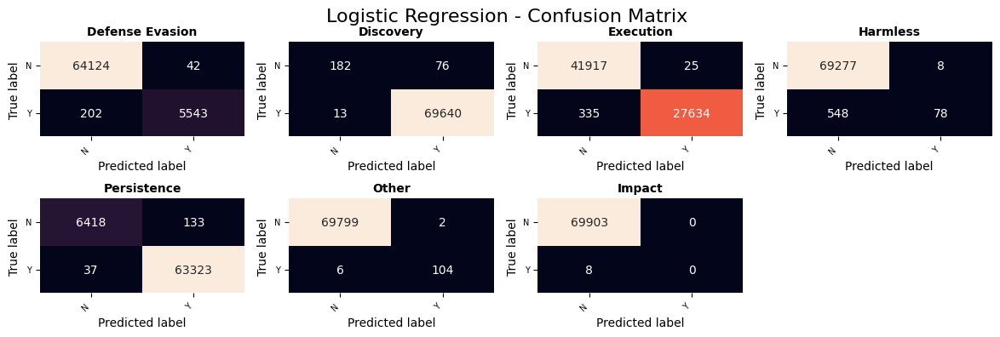

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [37]:
create_plot(multilabel_confusion_matrix(y_test, LR_predictions), "Logistic Regression")

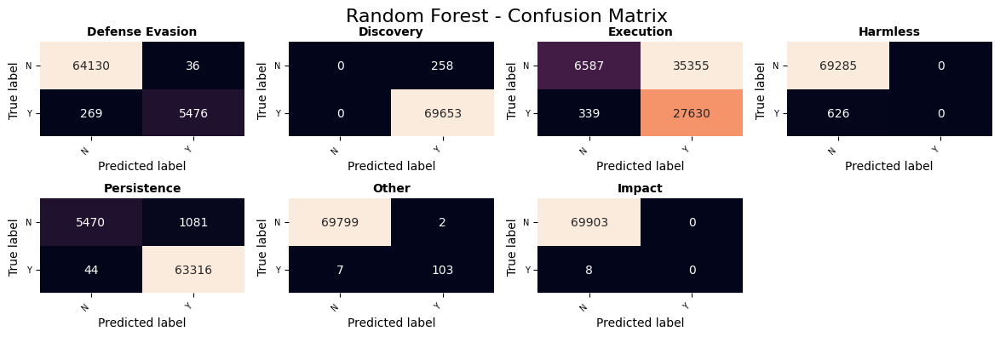

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [38]:
create_plot(multilabel_confusion_matrix(y_test, RF_predictions), "Random Forest")

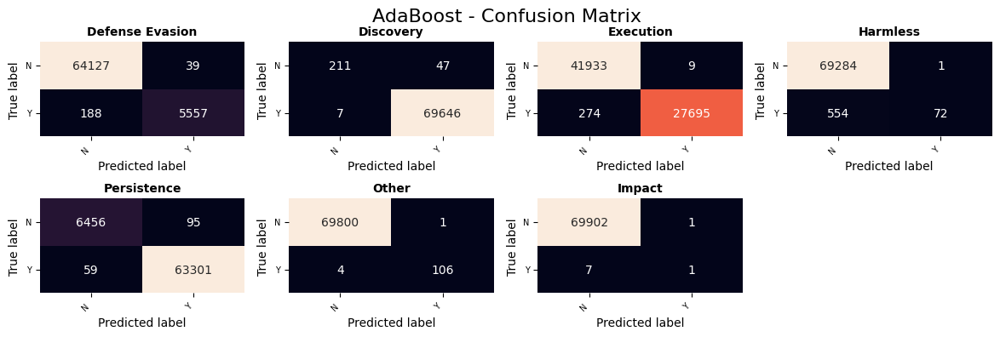

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [39]:
create_plot(multilabel_confusion_matrix(y_test, ADA_predictions), "AdaBoost")

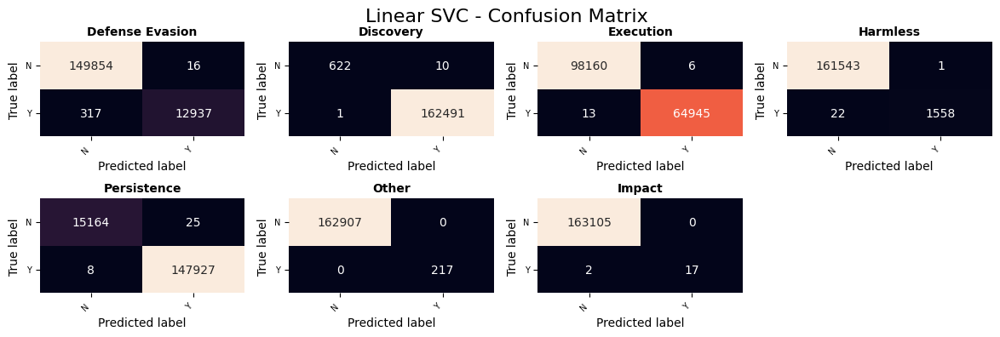

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [40]:
create_plot(multilabel_confusion_matrix(y_train, LSVC_train_predictions), "Linear SVC")

#### 2.2.3.2 Confusion Matrix - Training set

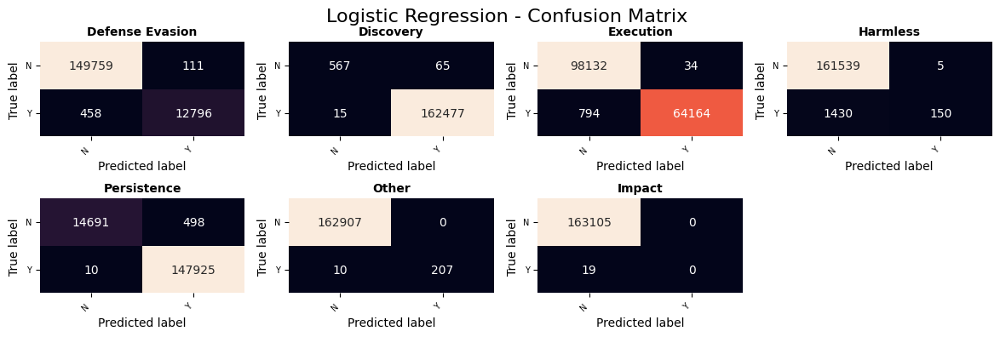

In [41]:
p = create_plot(multilabel_confusion_matrix(y_train, LR_train_predictions), "Logistic Regression")

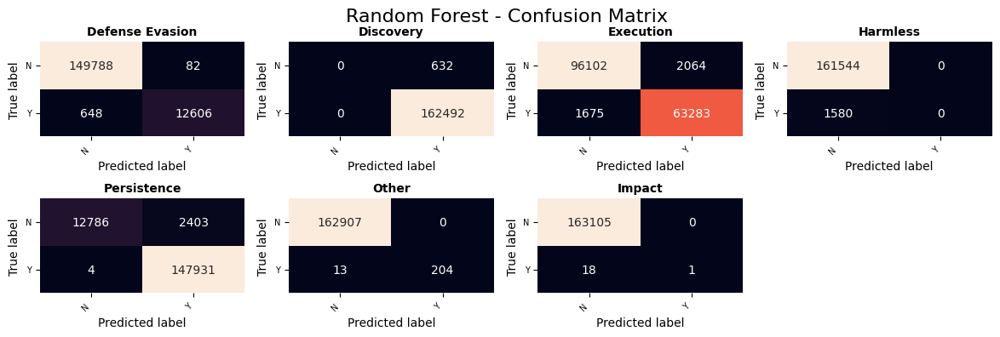

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [42]:
create_plot(multilabel_confusion_matrix(y_train, RF_train_predictions), "Random Forest")

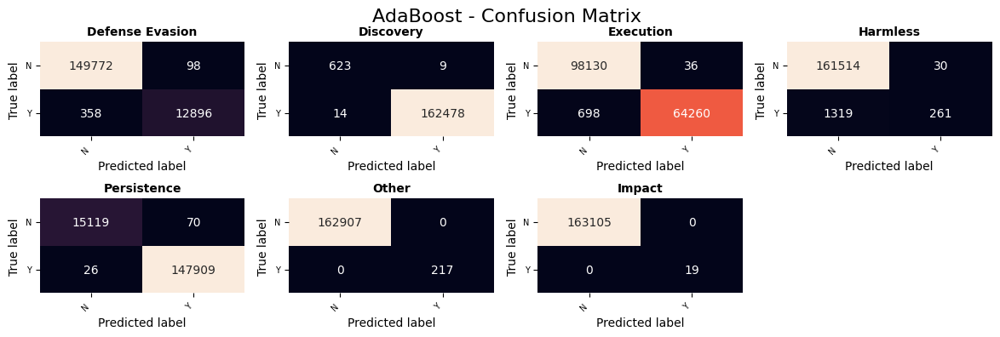

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [43]:
create_plot(multilabel_confusion_matrix(y_train, ADA_train_predictions), "AdaBoost")

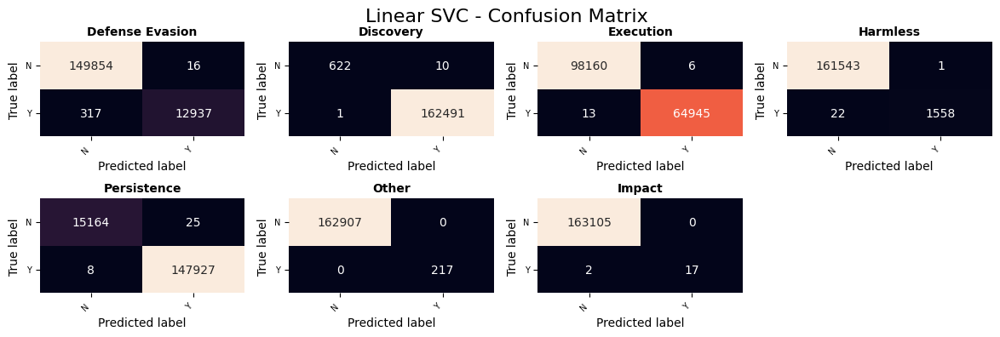

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [44]:
create_plot(multilabel_confusion_matrix(y_train, LSVC_train_predictions), "Linear SVC")

#### 2.2.3.2 ROC curve

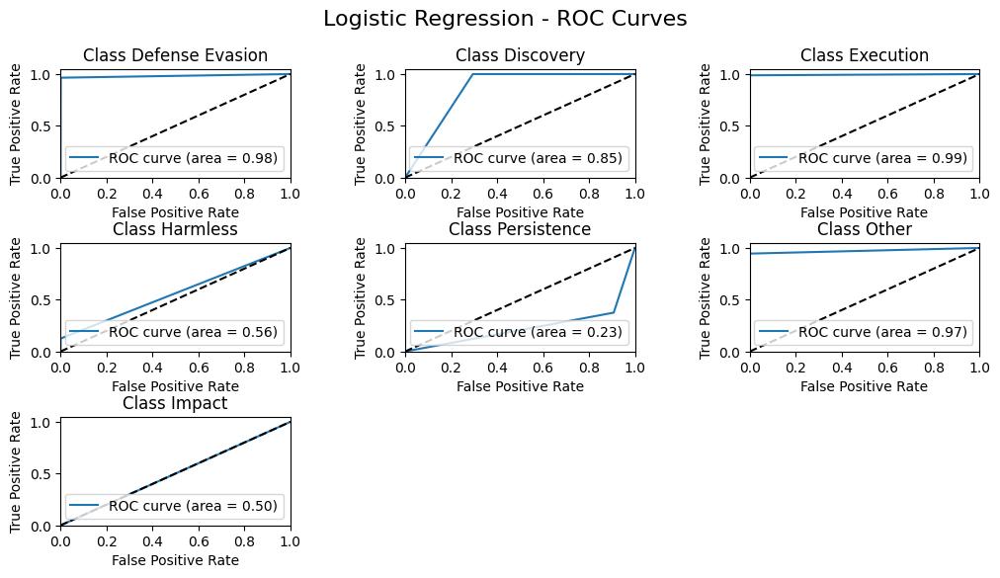

In [45]:
plt_roc_curve(y_test, LR_predictions, "Logistic Regression", labels)

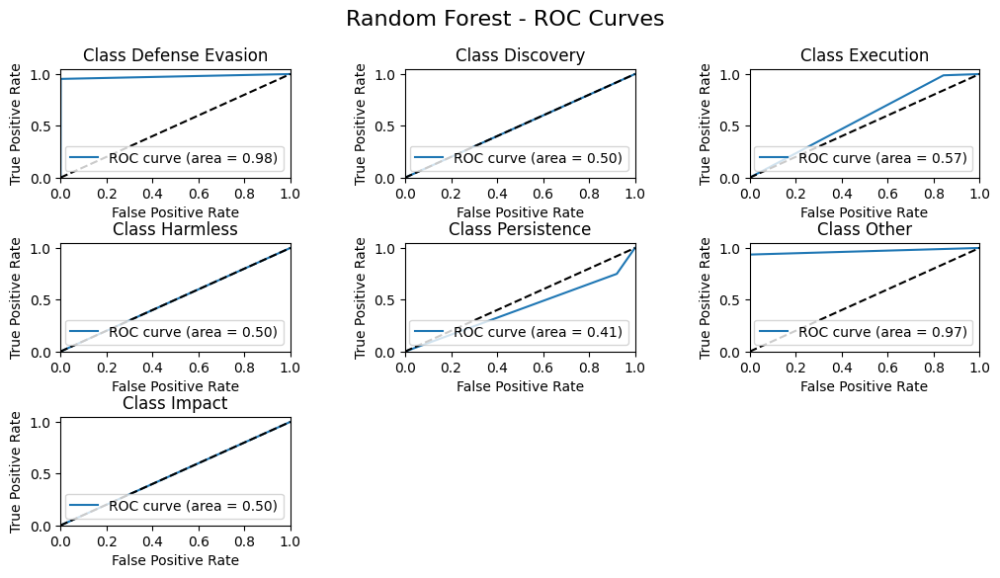

In [46]:
plt_roc_curve(y_test, RF_predictions, "Random Forest", labels)

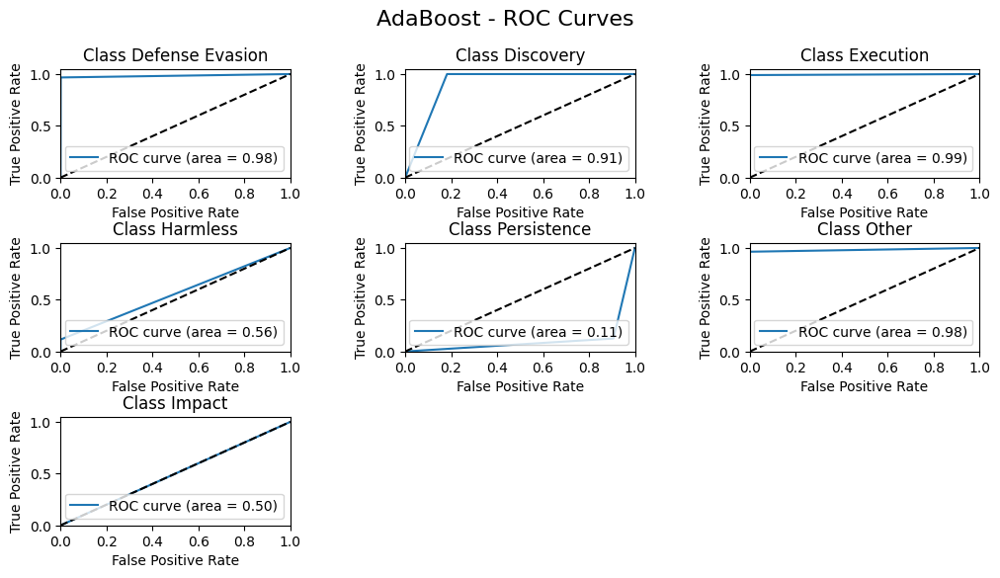

In [47]:
plt_roc_curve(y_test, ADA_predictions, "AdaBoost", labels)

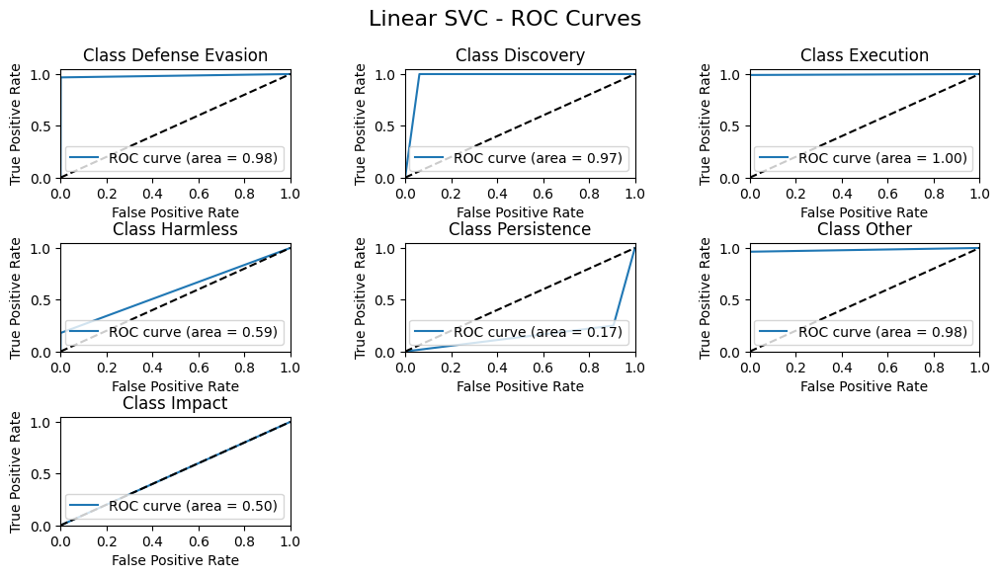

In [48]:
plt_roc_curve(y_test, LSVC_predictions, "Linear SVC", labels)

### 2.2.4 Some comments

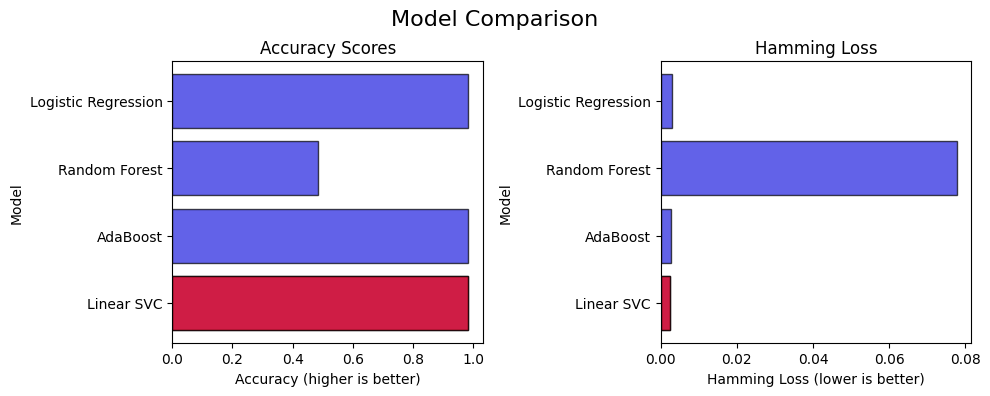

In [49]:
# Create a DataFrame with the results
models = ["Logistic Regression", "Random Forest", "AdaBoost", "Linear SVC"]
results = [LR_predictions, RF_predictions, ADA_predictions, LSVC_predictions]

plt = plot_results(create_results_dataframe(models, results), "Model Comparison")
plt.show()

Do you observe overfitting or under-fitting? Which model generates the best performance?

From what we can see in the classification reports:
- **Logistic Regression**: leads to a general good balance but with underfitting for labels Harmless (Recall: 0.09 traing set and 0.12 test set) and Impact (Recall: 0.00 on both)

- **Random Forest**: (executed with only 30 estimators and 5 max deepth, to stay cost effective with the times), it's the worst model that accompanies the underfitting ofr Impact and Harmless, with a low precision for Execution (0.44 in the training set) 

- **Linear SVC**: It's the best model for Accuracy and Loss. Brings a very good result also for Harmless (0.99 recall) and Impact (0.89 recall) in the training set, but remains lacking in the test set (respectively 0.18 and 0.12 recall)

- **ADA**: results similar to LR, but with some the capability to recognire the label Impact, with a recall of 1.0 in the training set and 0.12 in the test (at this point can sound more like overfitting, but but given the few samples, i remain with the general underfitting hypothesis). Label Harmless also remail problematic with only a 0.17 and 0.12 recall 

So, summarizing we can say that there are some problems with the limited number of sample for the label Impact which depending on the model used leads to situations of overfitting (as with LSV) and others of underfitting (as with LR). \
The situation for the label Harmless looks the same, even if the number of sample is definitely greater. 

## 2.3 Hyper Parameters Tuning

### 2.3.1 GridSeach

Now, the GridSerachSV method was used to search for hyper parameters. \
In this way, a grid of possible parameters for our pipeline can be provided as input, and the method will take care of testing all possible combinations (in case of incompatible parameters, it will fail after a few seconds by providing a NaN result and continue with the next combination).\
In each grid, in addition to the parameters for the various models, there is ngram_range to try to optimize the vectorization of the dataset using also digrams.

For GridSeach parameters, si è scelto:
- **verbose=5**: To obtain text output during execution and monitor progress 
- **j_jobs=1**: Already each pipeline is executed on all cores, so to avoid slowing execution due to excessive resource demand, only one set of parameters is tested at a time (in addition, in case of n_jobs > 1, jupyter does not print the verbose output)
- **cv=3**: the cross-validation splitting strategy is set to a "3-fold cross validation" to seek a balance between the reliability of results and secutution time

In [50]:
'''
n_gram=[(1,1),(1,2)]
'''

'\nn_gram=[(1,1),(1,2)]\n'

In [51]:
'''
 param_grid = {
     'tfidf__ngram_range': n_gram,
     'lr_model__estimator__C': [0.1,1,10,100],
     'lr_model__estimator__penalty': ['l1','l2'],
     'lr_model__estimator__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga']
 }
 
 LR_gsearch_cv = GridSearchCV(LR_pipeline, param_grid=param_grid, cv=3, verbose=5, n_jobs=1)
 LR_gsearch_cv.fit(X_train, y_train)
 print(LR_gsearch_cv.best_score_)
 print(LR_gsearch_cv.best_params_)
'''

"\n param_grid = {\n     'tfidf__ngram_range': n_gram,\n     'lr_model__estimator__C': [0.1,1,10,100],\n     'lr_model__estimator__penalty': ['l1','l2'],\n     'lr_model__estimator__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga']\n }\n \n LR_gsearch_cv = GridSearchCV(LR_pipeline, param_grid=param_grid, cv=3, verbose=5, n_jobs=1)\n LR_gsearch_cv.fit(X_train, y_train)\n print(LR_gsearch_cv.best_score_)\n print(LR_gsearch_cv.best_params_)\n"

In [52]:
'''
param_grid = { 
    'tfidf__ngram_range': n_gram,
    'ada_model__estimator__n_estimators': [10, 20, 50, 100],
    'ada_model__estimator__learning_rate': [0.001, 0.01, 0.1, 1.0],
    'ada_model__estimator__algorithm': ['SAMME', 'SAMME.R']
}

ADA_gsearch_cv = GridSearchCV(ADA_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
ADA_gsearch_cv.fit(X_train, y_train)
print(ADA_gsearch_cv.best_score_)
print(ADA_gsearch_cv.best_params_)
'''

"\nparam_grid = { \n    'tfidf__ngram_range': n_gram,\n    'ada_model__estimator__n_estimators': [10, 20, 50, 100],\n    'ada_model__estimator__learning_rate': [0.001, 0.01, 0.1, 1.0],\n    'ada_model__estimator__algorithm': ['SAMME', 'SAMME.R']\n}\n\nADA_gsearch_cv = GridSearchCV(ADA_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nADA_gsearch_cv.fit(X_train, y_train)\nprint(ADA_gsearch_cv.best_score_)\nprint(ADA_gsearch_cv.best_params_)\n"

In [53]:
'''
param_grid = {
    'tfidf__ngram_range': n_gram,
    'lsvc_model__estimator__C': [0.1, 1, 10, 100],
    'lsvc_model__estimator__penalty': ['l1', 'l2'],
    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],
    'lsvc_model__estimator__dual': [False],
    'lsvc_model__estimator__max_iter': [100, 200, 1000],
}

LSVC_gsearch_cv = GridSearchCV(LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
LSVC_gsearch_cv.fit(X_train, y_train)
print(LSVC_gsearch_cv.best_score_)
print(LSVC_gsearch_cv.best_params_)
'''

"\nparam_grid = {\n    'tfidf__ngram_range': n_gram,\n    'lsvc_model__estimator__C': [0.1, 1, 10, 100],\n    'lsvc_model__estimator__penalty': ['l1', 'l2'],\n    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],\n    'lsvc_model__estimator__dual': [False],\n    'lsvc_model__estimator__max_iter': [100, 200, 1000],\n}\n\nLSVC_gsearch_cv = GridSearchCV(LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nLSVC_gsearch_cv.fit(X_train, y_train)\nprint(LSVC_gsearch_cv.best_score_)\nprint(LSVC_gsearch_cv.best_params_)\n"

In [54]:
'''
param_grid = { 
    'tfidf__ngram_range': n_gram,
    'rf_model__estimator__n_estimators': [10, 20, 50, 100],
    'rf_model__estimator__max_depth': [5, 10, 20, 50],
    'rf_model__estimator__criterion': ['gini', 'entropy'],
    'rf_model__estimator__max_features': ['auto', 'sqrt', 'log2']
}

RF_gsearch_cv = GridSearchCV(RF_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
RF_gsearch_cv.fit(X_train, y_train)
print(RF_gsearch_cv.best_score_)
print(RF_gsearch_cv.best_params_)
'''

"\nparam_grid = { \n    'tfidf__ngram_range': n_gram,\n    'rf_model__estimator__n_estimators': [10, 20, 50, 100],\n    'rf_model__estimator__max_depth': [5, 10, 20, 50],\n    'rf_model__estimator__criterion': ['gini', 'entropy'],\n    'rf_model__estimator__max_features': ['auto', 'sqrt', 'log2']\n}\n\nRF_gsearch_cv = GridSearchCV(RF_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nRF_gsearch_cv.fit(X_train, y_train)\nprint(RF_gsearch_cv.best_score_)\nprint(RF_gsearch_cv.best_params_)\n"

### 2.3.2 Model training

After the search, we create new pipelines using the parameters obtained from the optimization

In [55]:
# # {'lr_model__estimator__C': 10, 'lr_model__estimator__penalty': 'l1', 'lr_model__estimator__solver': 'liblinear', 'tfidf__ngram_range': (1, 2)}

best_LR_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,2))),
                        ('lr_model', MultiOutputClassifier(LogisticRegression(C=10, penalty='l1', solver='liblinear', random_state=random_value), n_jobs=-1))])
best_LR_pipeline, best_LR_predictions, best_LR_train_predictions = run_pipeline(best_LR_pipeline, X_train, y_train, X_test)

In [56]:
# {'rf_model__estimator__criterion': 'gini', 'rf_model__estimator__max_depth': 20, 'rf_model__estimator__max_features': 'sqrt', 'rf_model__estimator__n_estimators': 10, 'tfidf__ngram_range': (1, 2)}

best_RF_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,2))),
                        ('rf_model', MultiOutputClassifier(RandomForestClassifier(criterion='gini', max_depth=20, max_features='sqrt', n_estimators=10, random_state=random_value), n_jobs=-1))])
best_RF_pipeline, best_RF_predictions, best_RF_train_predictions = run_pipeline(best_RF_pipeline, X_train, y_train, X_test)

In [57]:
# {'ada_model__estimator__algorithm': 'SAMME.R', 'ada_model__estimator__learning_rate': 0.1, 'ada_model__estimator__n_estimators': 100, 'tfidf__ngram_range': (1, 1)}

best_ADA_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,1))),
                            ('ada_model', MultiOutputClassifier(AdaBoostClassifier(algorithm='SAMME.R', learning_rate=0.1, n_estimators=100, random_state=random_value), n_jobs=-1))])
best_ADA_pipeline, best_ADA_predictions, best_ADA_train_predictions = run_pipeline(best_ADA_pipeline, X_train, y_train, X_test)

In [58]:
# {'lsvc_model__estimator__C': 10, 'lsvc_model__estimator__dual': False, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__max_iter': 1000, 'lsvc_model__estimator__penalty': 'l1', 'tfidf__ngram_range': (1, 2)}


best_LSVC_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('lsvc_model', MultiOutputClassifier(LinearSVC(C=10, loss='squared_hinge', penalty='l1', max_iter=1000, random_state=random_value, dual=False), n_jobs=-1))])
best_LSVC_pipeline, best_LSVC_predictions, best_LSVC_train_predictions = run_pipeline(best_LSVC_pipeline, X_train, y_train, X_test)


### 2.3.3 Optimized Classification Reports

In [59]:
print('Training Set Best LR')
print(classification_report(y_train, best_LR_train_predictions, target_names=labels))
print('Test Set Best LR')
print(classification_report(y_test, best_LR_predictions, target_names=labels))

Training Set Best LR
                 precision    recall  f1-score   support

Defense Evasion       1.00      1.00      1.00     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      1.00      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.79      0.88        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.97      0.98    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test Set Best LR
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.84      0.18      0.30

In [60]:
print('Training Set Best ADA')
print(classification_report(y_train, best_ADA_train_predictions, target_names=labels))
print('Test Set Best ADA')
print(classification_report(y_test, best_ADA_predictions, target_names=labels))

Training Set Best ADA


                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.94      0.14      0.24      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.95      0.97        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.99      0.86      0.88    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       1.00      0.99      1.00    390455

Test Set Best ADA
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       1.00      0.10      0.19       626
    Persi

In [61]:
print('Training Set Best LSVC')
print(classification_report(y_train, best_LSVC_train_predictions, target_names=labels))
print('Tes Sett Best LSVC')
print(classification_report(y_test, best_LSVC_predictions, target_names=labels))

Training Set Best LSVC
                 precision    recall  f1-score   support

Defense Evasion       1.00      1.00      1.00     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      1.00      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.95      0.97        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.99      1.00    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Tes Sett Best LSVC
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.84      0.18      

In [62]:
print('Training Set Best RF')
print(classification_report(y_train, best_RF_train_predictions, target_names=labels))
print('Test Set Best RF')
print(classification_report(y_test, best_RF_predictions, target_names=labels))

Training Set Best RF
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       0.99      0.98      0.99     64958
       Harmless       1.00      0.02      0.04      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      0.98      0.99       217
         Impact       1.00      0.68      0.81        19

      micro avg       1.00      0.99      0.99    390455
      macro avg       1.00      0.80      0.83    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       1.00      0.99      0.99    390455

Test Set Best RF
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       0.49      0.99      0.66     27969
       Harmless       1.00      0.00      0.01

### 2.3.4 Graphs

#### 2.3.4.1 Confuzion Matrix - Test Set

Best LR confusion matrix


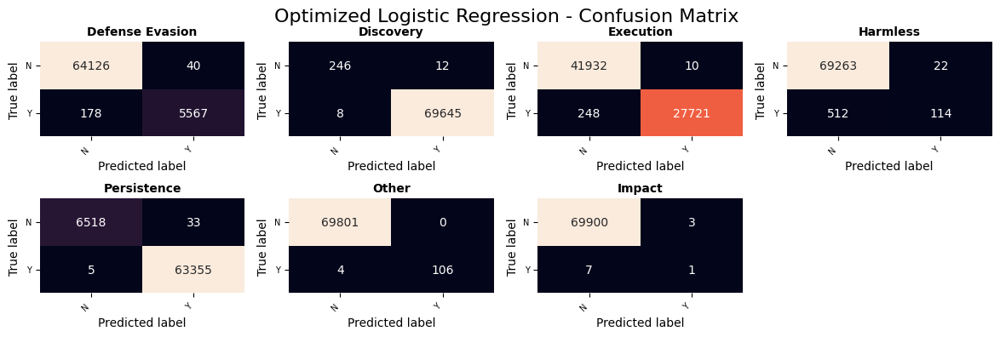

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [63]:
print('Best LR confusion matrix')
create_plot(multilabel_confusion_matrix(y_test, best_LR_predictions), "Optimized Logistic Regression")

Best ADA confusion matrix


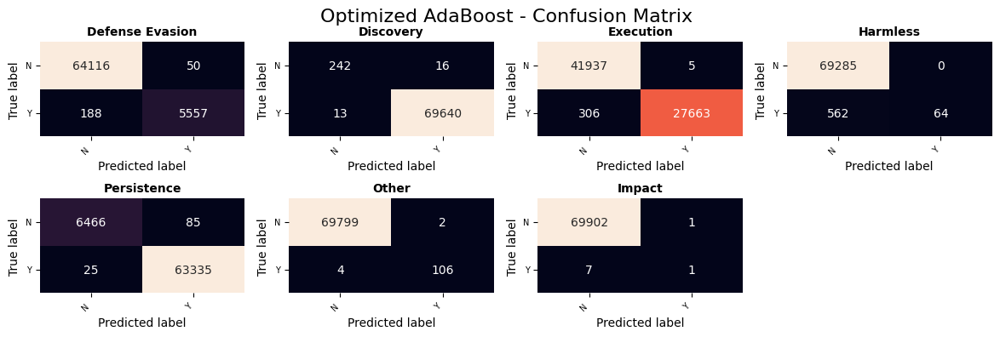

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [64]:
print('Best ADA confusion matrix')
create_plot(multilabel_confusion_matrix(y_test, best_ADA_predictions), "Optimized AdaBoost")

Best LSVC confusion matrix


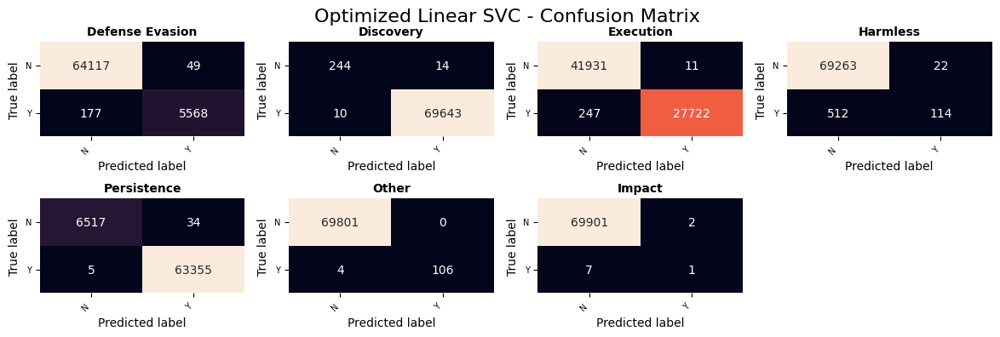

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [65]:
print('Best LSVC confusion matrix')
create_plot(multilabel_confusion_matrix(y_test, best_LSVC_predictions), "Optimized Linear SVC")

Best RF confusion matrix


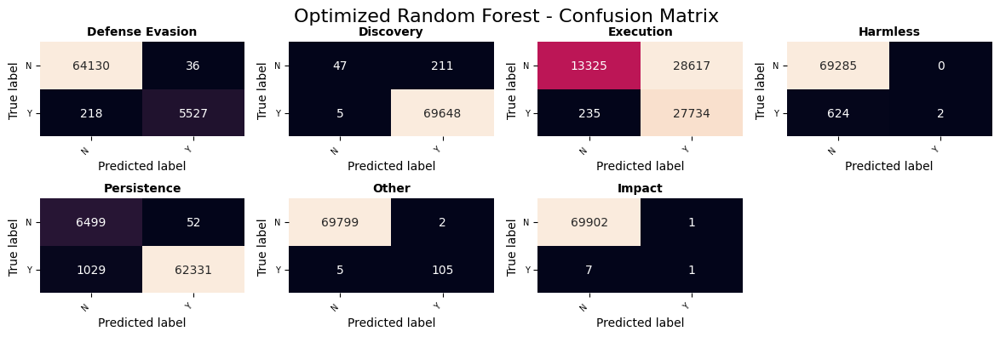

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [66]:
print('Best RF confusion matrix')
create_plot(multilabel_confusion_matrix(y_test, best_RF_predictions), "Optimized Random Forest")

#### 2.3.4.2 Confusion Matrix - Training set

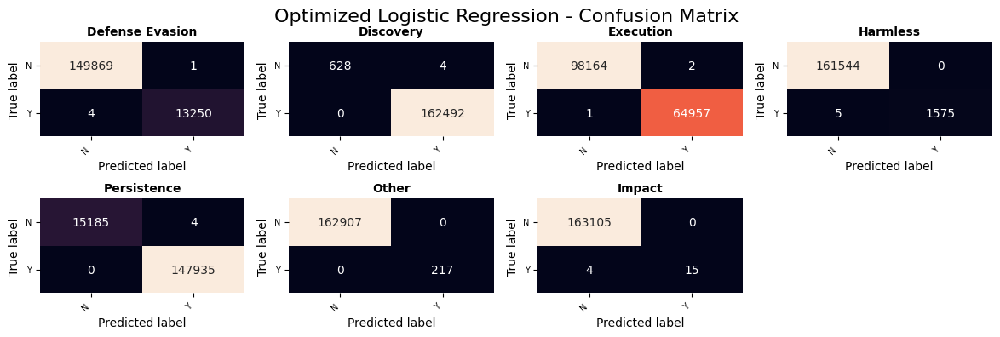

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [67]:
create_plot(multilabel_confusion_matrix(y_train, best_LR_train_predictions), "Optimized Logistic Regression")

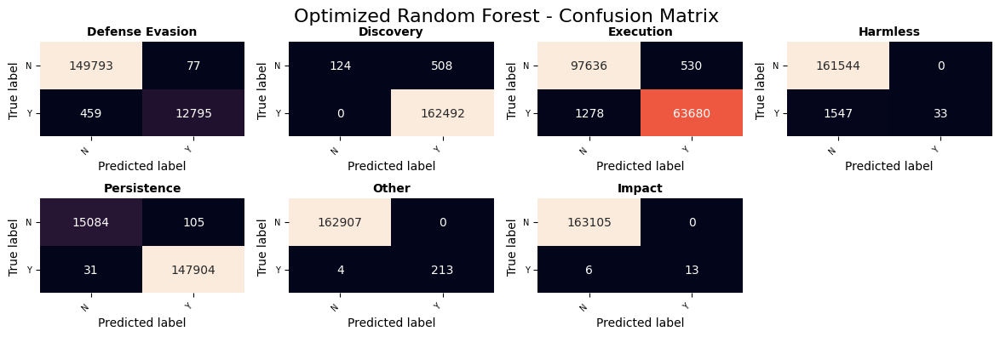

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [68]:
create_plot(multilabel_confusion_matrix(y_train, best_RF_train_predictions), "Optimized Random Forest")

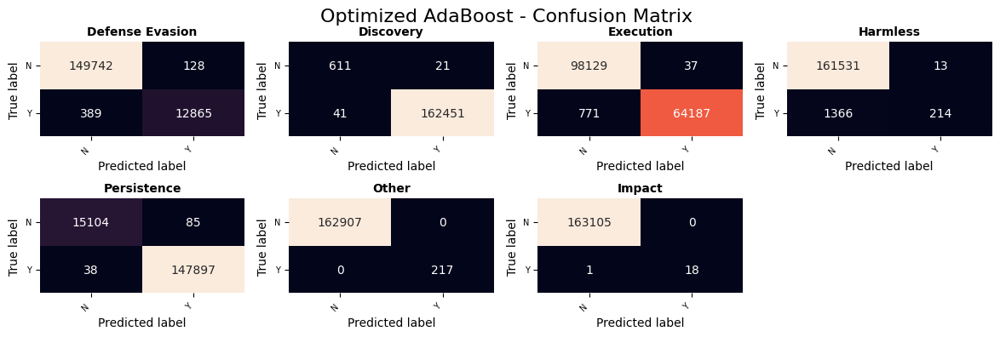

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [69]:
create_plot(multilabel_confusion_matrix(y_train, best_ADA_train_predictions), "Optimized AdaBoost")

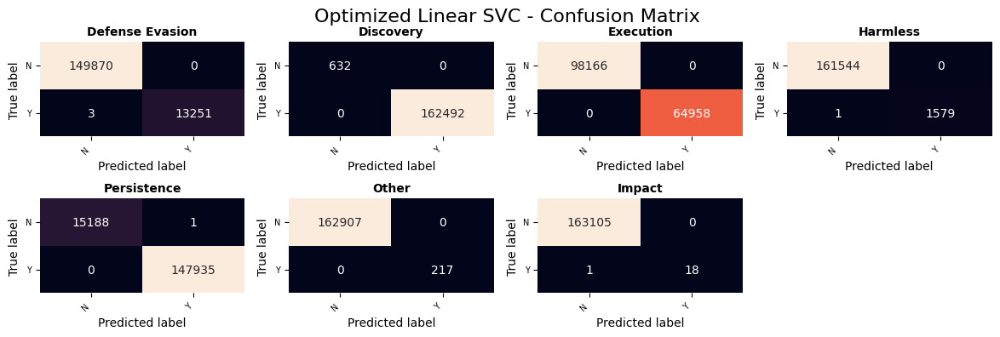

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [70]:
create_plot(multilabel_confusion_matrix(y_train, best_LSVC_train_predictions), "Optimized Linear SVC")

#### 2.3.4.3 ROC Curve

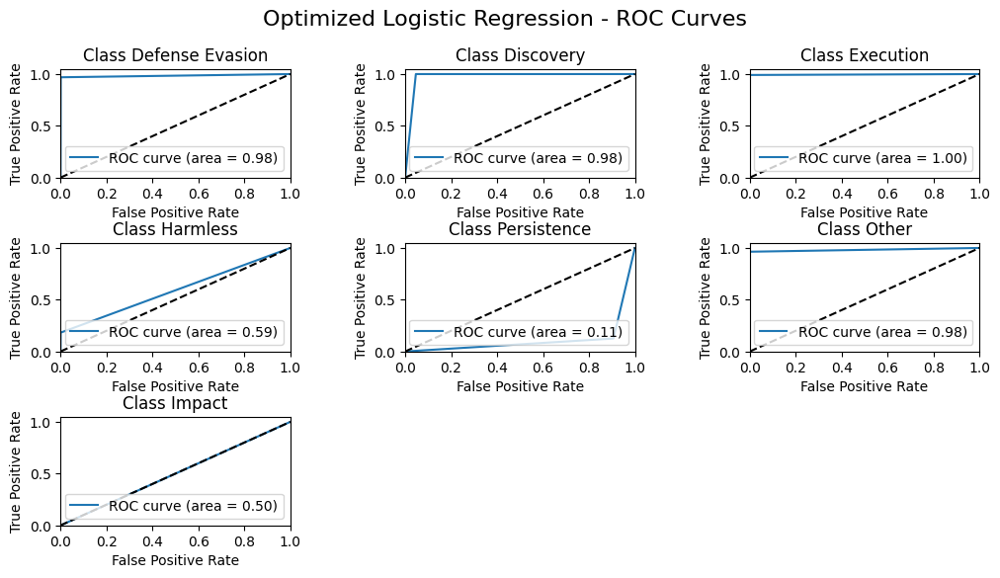

In [71]:
plt_roc_curve(y_test, best_LR_predictions, "Optimized Logistic Regression", labels)

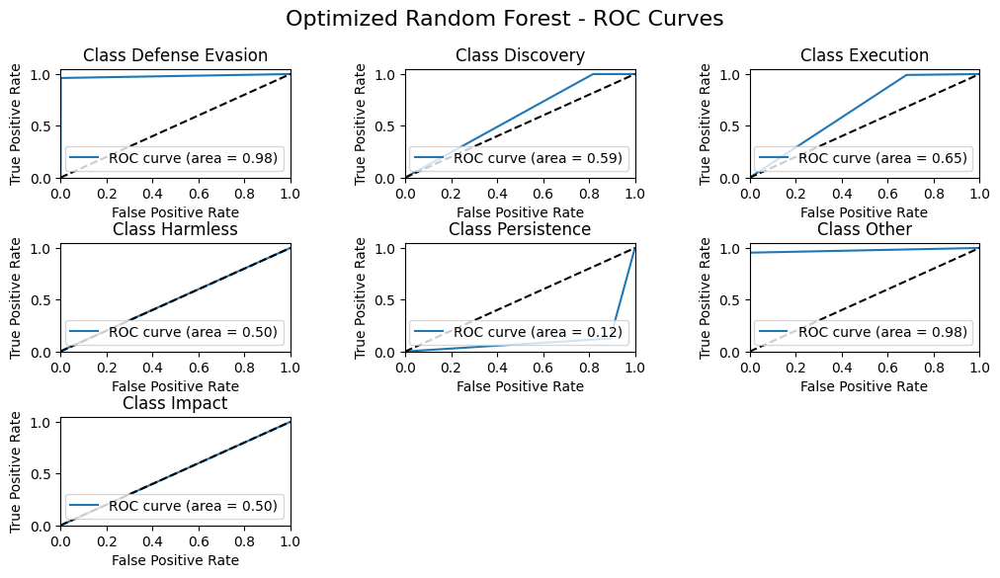

In [72]:
plt_roc_curve(y_test, best_RF_predictions, "Optimized Random Forest", labels)

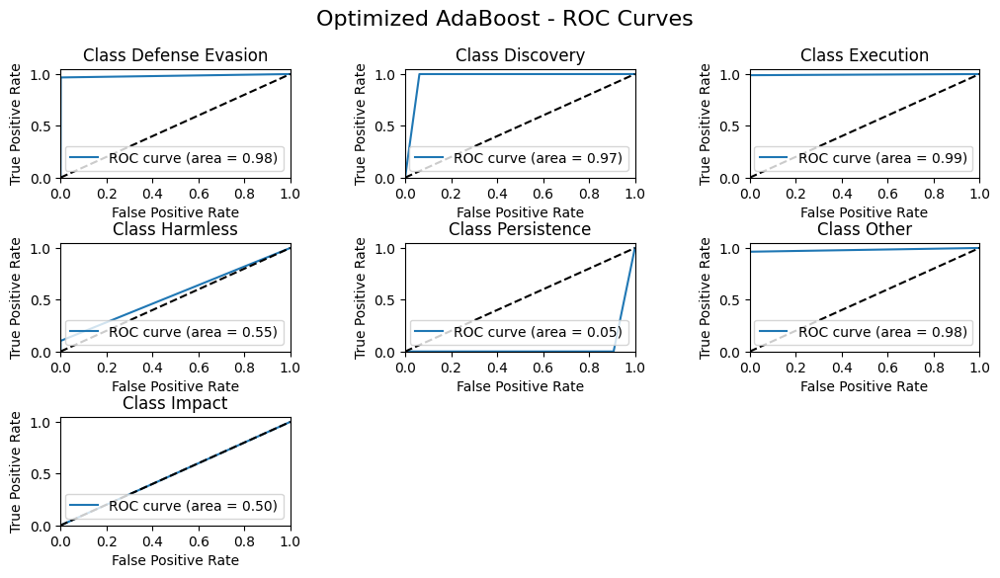

In [73]:
plt_roc_curve(y_test, best_ADA_predictions, "Optimized AdaBoost", labels)

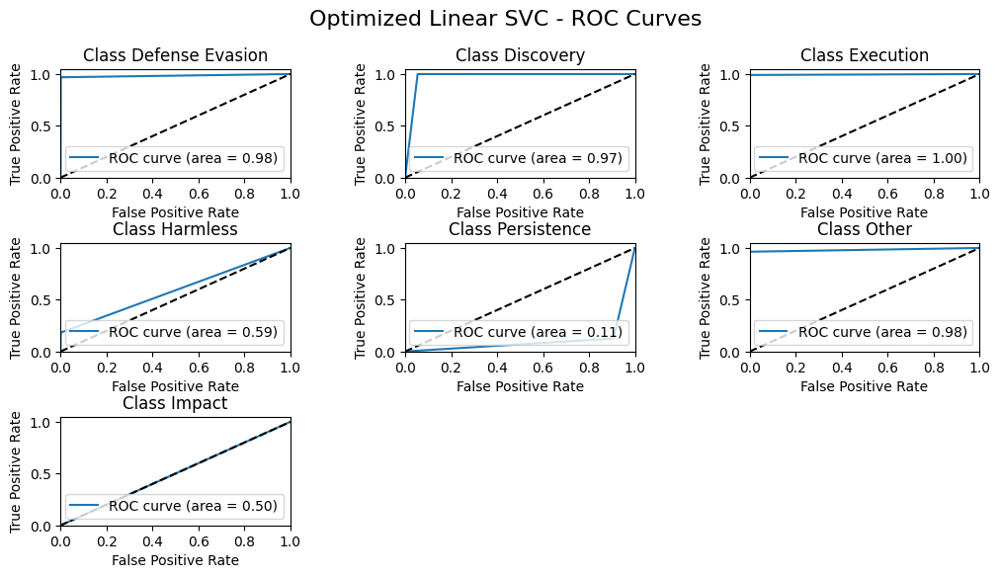

In [74]:
plt_roc_curve(y_test, best_LSVC_predictions, "Optimized Linear SVC", labels)

### 2.3.6 Optimization Result Comments

#### 2.3.6.1 Optimized vs Default

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

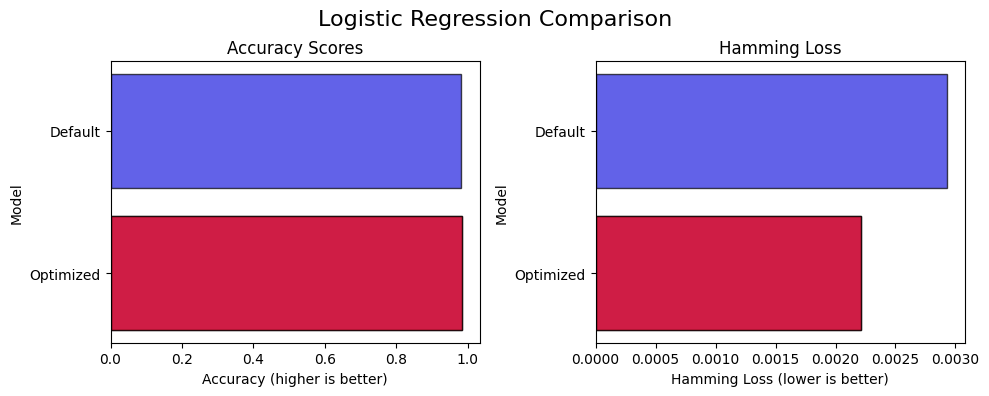

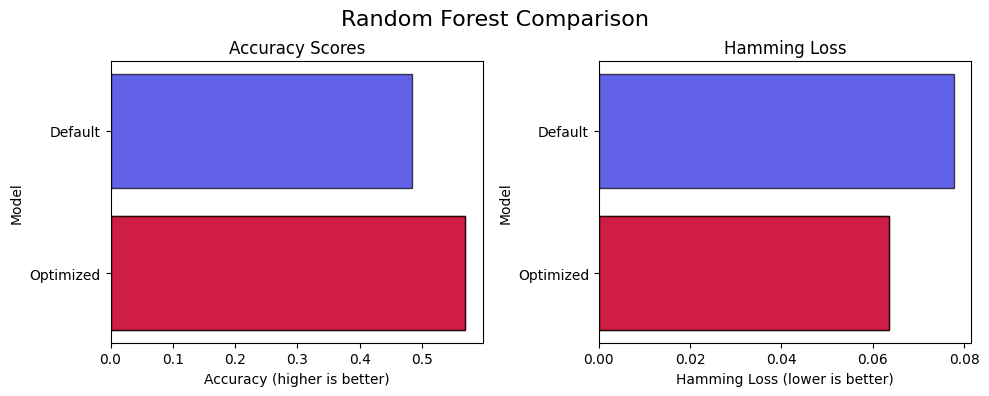

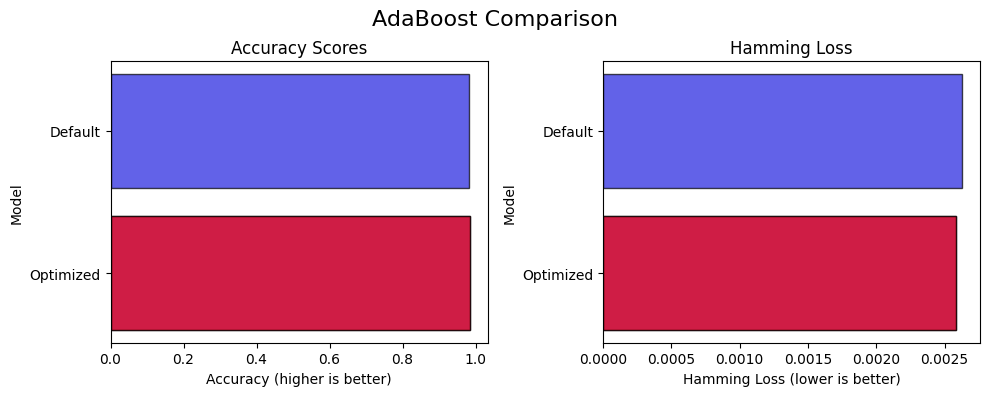

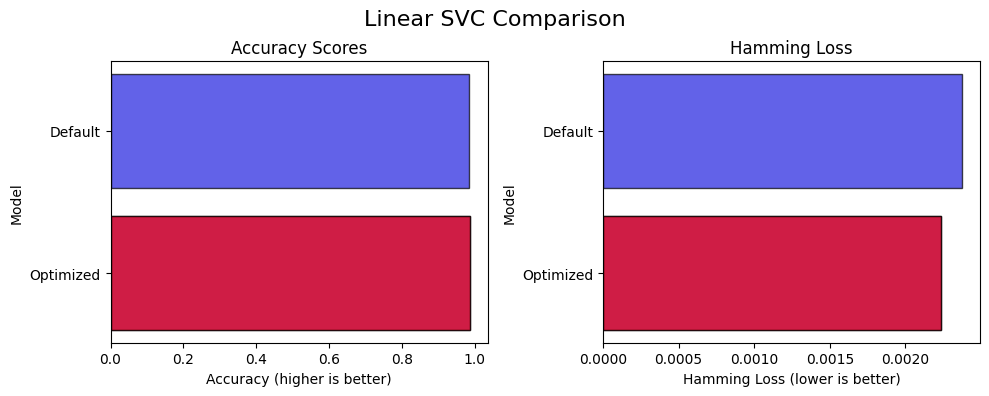

In [75]:
# Plot Logistic Regression Comparison
models = ['Default', 'Optimized']
predictions_lr = [LR_predictions, best_LR_predictions]
plot_results(create_results_dataframe(models, predictions_lr), "Logistic Regression Comparison")

# Plot Random Forest Comparison
predictions_rf = [RF_predictions, best_RF_predictions]
plot_results(create_results_dataframe(models, predictions_rf), "Random Forest Comparison")

# Plot AdaBoost Comparison
predictions_ada = [ADA_predictions, best_ADA_predictions]
plot_results(create_results_dataframe(models, predictions_ada), "AdaBoost Comparison")

# Plot Linear SVC Comparison
predictions_lsvc = [LSVC_predictions, best_LSVC_predictions]
plot_results(create_results_dataframe(models, predictions_lsvc), "Linear SVC Comparison")

From waht we can see in these 4 pairs of plots, the version with the optimized hyper parameters always gets an advantage over the default model.
In particulat Logistic Regression and Random Forest, have achieved a noticeable improvement.

Now, if we compere the 4 optimized model as done previously with the default version: 

#### 2.3.6.2 Optimized comparison

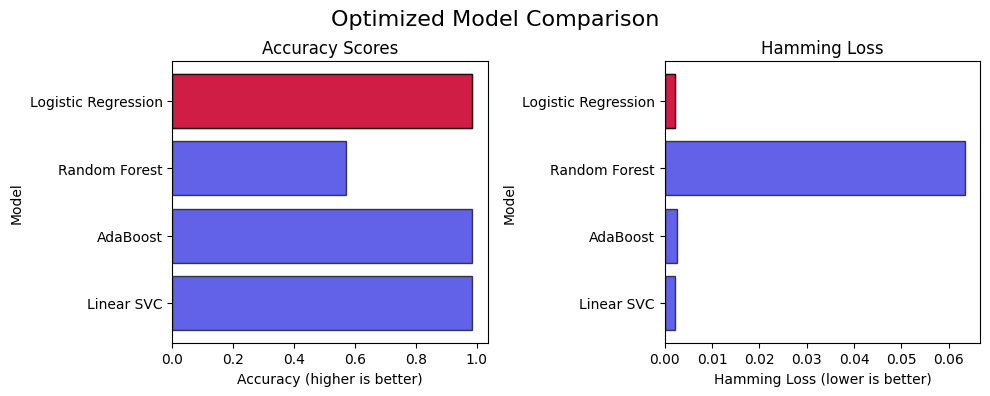

In [76]:
# Create a DataFrame with the results
optimized_models = ["Logistic Regression", "Random Forest", "AdaBoost", "Linear SVC"]
optimized_results = [best_LR_predictions, best_RF_predictions, best_ADA_predictions, best_LSVC_predictions]
plt = plot_results(create_results_dataframe(optimized_models, optimized_results), "Optimized Model Comparison")
plt.show()

The overall situation remains stable, but the improvement of LR allows for better results than LSVC and thus becomes the most promising model at the moment

Now, if we want to make a more granular comparison and see how the parameters have evolved for individual labels, we find that:

- **Logistic Regression**:  It improves significantly in training set analysis, bringing the recall of all labels to 1, except Impact, which still goes from 0.00 to 0.79. 
    As for the test set, there are no particular changes except for the recall of Impact, which goes from 0.00 to 0.12 (but with a precision of 0.25)

- **Random Forest**: It remains the worst model. After optimization, the only considerable improvement is the recall for Impact, which in the training set goes from 0 to 0.68, but stops at 0.12 for the test set.

- **Ada Boost**: No change to highlight, the results are practically the same compared to using the default parameters

- **Linear SVC**: Same situation as for AdaBoost, the results are practically the same compared to using the default parameters

## 2.4 Explore the use of Non-normalized data

As a first alternative approach, there is to not use tf-idf and thus work on non-normalized data. \
This was done by modifying the first part of the pipeline so that it went to perform only string vectorization 

#### 2.4.1 Default model training

In [77]:
notfidf_LR_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False)),
                        ('lr_model', MultiOutputClassifier(LogisticRegression(random_state=random_value), n_jobs=-1))])

notfidf_LR_pipeline, notfidf_LR_predictions, notfidf_LR_train_predictions = run_pipeline(notfidf_LR_pipeline, X_train, y_train, X_test)

'''
ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
'''

'\nConvergenceWarning: lbfgs failed to converge (status=1):\nSTOP: TOTAL NO. of ITERATIONS REACHED LIMIT.\n\nIncrease the number of iterations (max_iter) or scale the data as shown in:\n'

In [78]:
notfidf_RF_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False)),
                            ('rf_model', MultiOutputClassifier(RandomForestClassifier(max_depth=5, n_estimators=30, random_state=random_value), n_jobs=-1))])

notfidf_RF_pipeline, notfidf_RF_predictions, notfidf_RF_train_predictions = run_pipeline(notfidf_RF_pipeline, X_train, y_train, X_test)

In [79]:
notfidf_ADA_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False)),
                            ('ada_model', MultiOutputClassifier(AdaBoostClassifier(random_state=random_value), n_jobs=-1))])

notfidf_ADA_pipeline, notfidf_ADA_predictions, notfidf_ADA_train_predictions = run_pipeline(notfidf_ADA_pipeline, X_train, y_train, X_test)

In [80]:
notfidf_LSVC_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False)),
                            ('lsvc_model', MultiOutputClassifier(LinearSVC(random_state=random_value, dual=False), n_jobs=-1))])

notfidf_LSVC_pipeline, notfidf_LSVC_predictions, notfidf_LSVC_train_predictions = run_pipeline(notfidf_LSVC_pipeline, X_train, y_train, X_test)

'''
ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
'''

'\nConvergenceWarning: Liblinear failed to converge, increase the number of iterations.\n  warnings.warn(\n'

Already while running the various models without yet knowing the rusltates, we can see how the nonnormalization of the data leads to various warnings for the LR and LSVC models (Mainly related to the number of default iterations not sufficing)

In [81]:
# Create a DataFrame with the results
notfidf_results = pd.DataFrame({
    'accuracy': [accuracy_score(y_test, notfidf_LR_predictions), accuracy_score(y_test, notfidf_RF_predictions), accuracy_score(y_test, notfidf_ADA_predictions), accuracy_score(y_test, notfidf_LSVC_predictions)],
    'hamming_loss': [hamming_loss(y_test, notfidf_LR_predictions), hamming_loss(y_test, notfidf_RF_predictions), hamming_loss(y_test, notfidf_ADA_predictions), hamming_loss(y_test, notfidf_LSVC_predictions)]
}, index=['Logistic Regression (no tf-idf)', 'Random Forest (no tf-idf)', 'ADA Boost (no tf-idf)', 'Linear SVC (no tf-idf)'])

notfidf_results

,accuracy,hamming_loss
Logistic Regression (no tf-idf),0.985653,0.002191
Random Forest (no tf-idf),0.964169,0.006845
ADA Boost (no tf-idf),0.985110,0.002291
Linear SVC (no tf-idf),0.985582,0.002199


#### 2.4.2 Classification Reports

In [82]:
print('Training set LR (without tfidf)')
print(classification_report(y_train, notfidf_LR_train_predictions, target_names=labels))
print('Test set LR (without tfidf)')
print(classification_report(y_test, notfidf_LR_predictions, target_names=labels))

Training set LR (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.98      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      0.98      0.99      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      0.99      0.99       217
         Impact       1.00      0.89      0.94        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.98      0.99    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test set LR (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.

In [83]:
print('Training set ADA (without tfidf)')
print(classification_report(y_train, notfidf_ADA_train_predictions, target_names=labels))
print('Test set ADA (without tfidf)')
print(classification_report(y_test, notfidf_ADA_predictions, target_names=labels))

Training set ADA (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.89      0.17      0.28      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.98      0.88      0.89    390455
   weighted avg       1.00      0.99      1.00    390455
    samples avg       1.00      0.99      1.00    390455

Test set ADA (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       

In [84]:
print('Training set LSVC (without tfidf)')
print(classification_report(y_train, notfidf_LSVC_train_predictions, target_names=labels))
print('Test set LSVC (without tfidf)')
print(classification_report(y_test, notfidf_LSVC_predictions, target_names=labels))

Training set LSVC (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       1.00      0.98      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      1.00      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      1.00      1.00    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test set LSVC (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless     

In [85]:
print('Training set RF (without tfidf)')
print(classification_report(y_train, notfidf_RF_train_predictions, target_names=labels))
print('Test set RF (without tfidf)')
print(classification_report(y_test, notfidf_RF_predictions, target_names=labels))

Training set RF (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.95      0.97     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.96      0.98     64958
       Harmless       0.00      0.00      0.00      1580
    Persistence       0.98      1.00      0.99    147935
          Other       1.00      0.96      0.98       217
         Impact       1.00      0.05      0.10        19

      micro avg       0.99      0.99      0.99    390455
      macro avg       0.85      0.70      0.72    390455
   weighted avg       0.99      0.99      0.99    390455
    samples avg       0.99      0.99      0.99    390455

Test set RF (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.95      0.97      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.96      0.98     27969
       Harmless       0.

#### 2.4.3 Graphs

##### 2.4.3.1 Stability Matrix - Test set

LR confusion matrix (without tfidf)


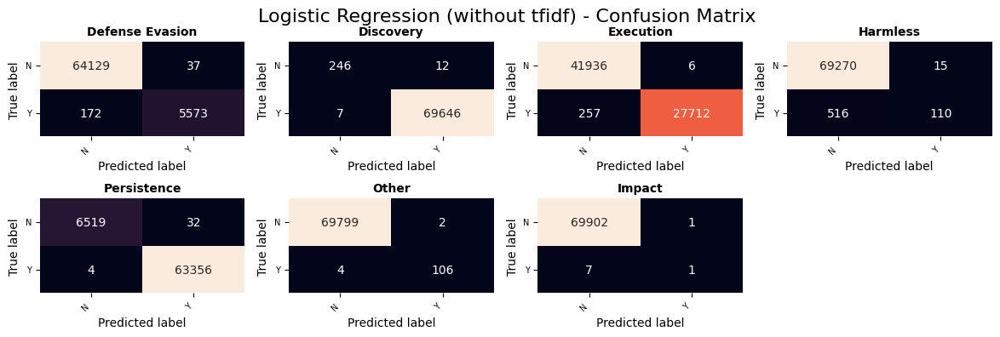

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [86]:
print('LR confusion matrix (without tfidf)')
create_plot(multilabel_confusion_matrix(y_test, notfidf_LR_predictions), "Logistic Regression (without tfidf)")

ADA confusion matrix (without tfidf)


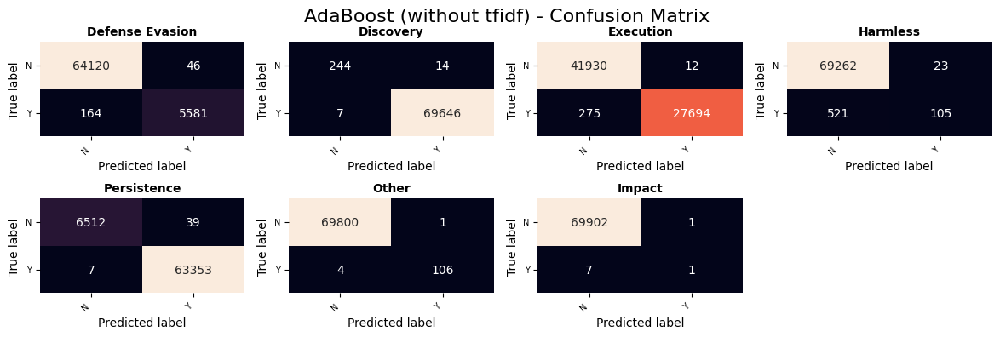

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [87]:
print('ADA confusion matrix (without tfidf)')
create_plot(multilabel_confusion_matrix(y_test, notfidf_ADA_predictions), "AdaBoost (without tfidf)")

LSVC confusion matrix (without tfidf)


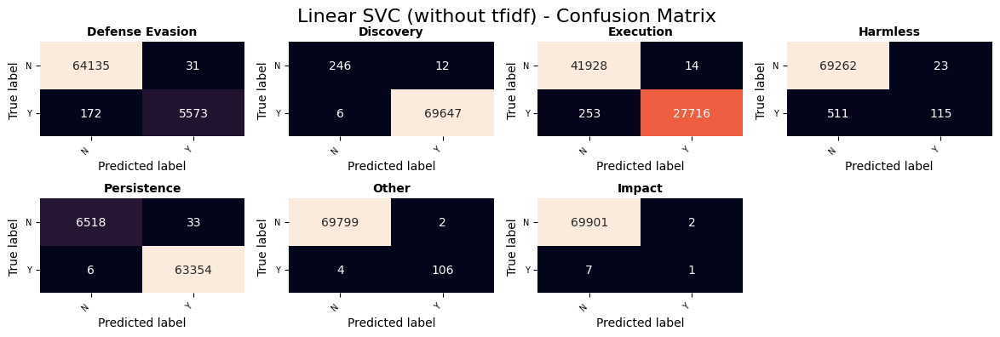

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [88]:
print('LSVC confusion matrix (without tfidf)')
create_plot(multilabel_confusion_matrix(y_test, notfidf_LSVC_predictions), "Linear SVC (without tfidf)")

RF confusion matrix (without tfidf)


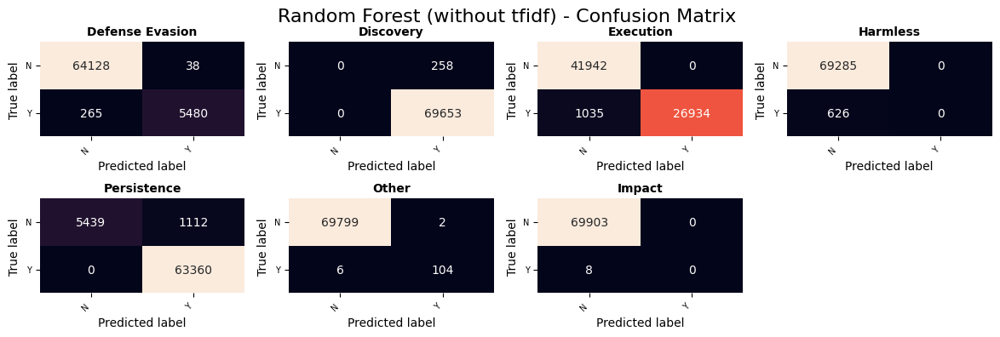

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [89]:
print('RF confusion matrix (without tfidf)')
create_plot(multilabel_confusion_matrix(y_test, notfidf_RF_predictions), "Random Forest (without tfidf)")

##### 2.4.3.2 Stability Matrix - Training set

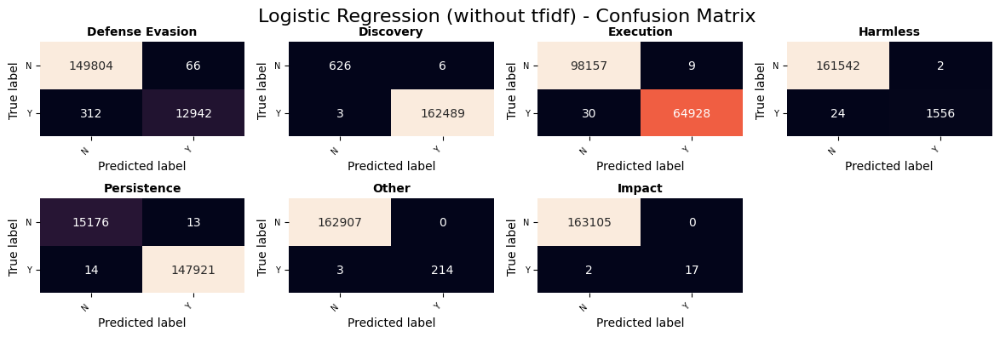

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [90]:
create_plot(multilabel_confusion_matrix(y_train, notfidf_LR_train_predictions), "Logistic Regression (without tfidf)")

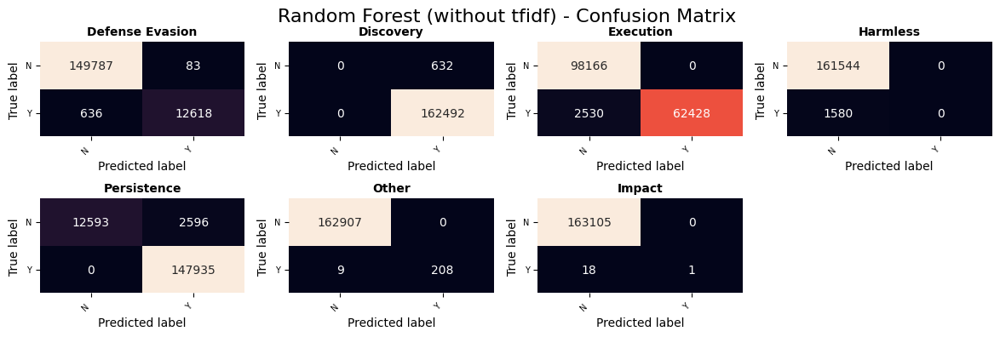

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [91]:
create_plot(multilabel_confusion_matrix(y_train, notfidf_RF_train_predictions), "Random Forest (without tfidf)")

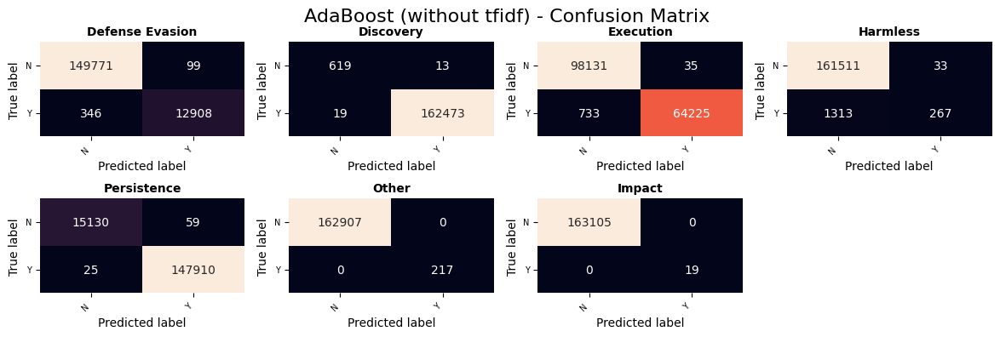

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [92]:
create_plot(multilabel_confusion_matrix(y_train, notfidf_ADA_train_predictions), "AdaBoost (without tfidf)")

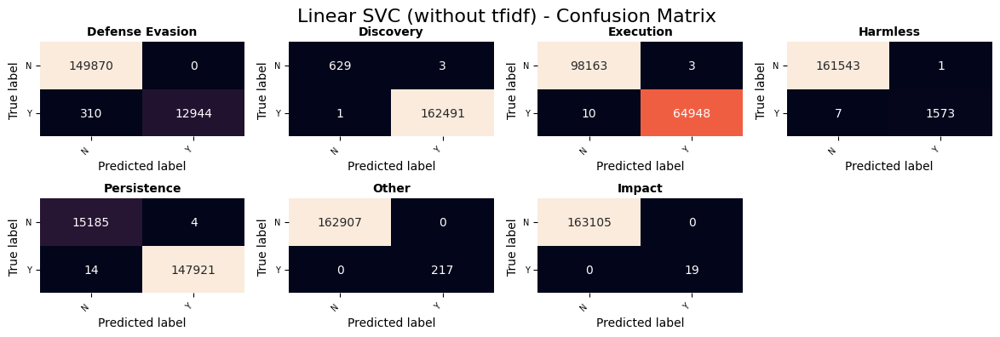

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [93]:
create_plot(multilabel_confusion_matrix(y_train, notfidf_LSVC_train_predictions), "Linear SVC (without tfidf)")

##### 2.4.3.3 ROC Curve

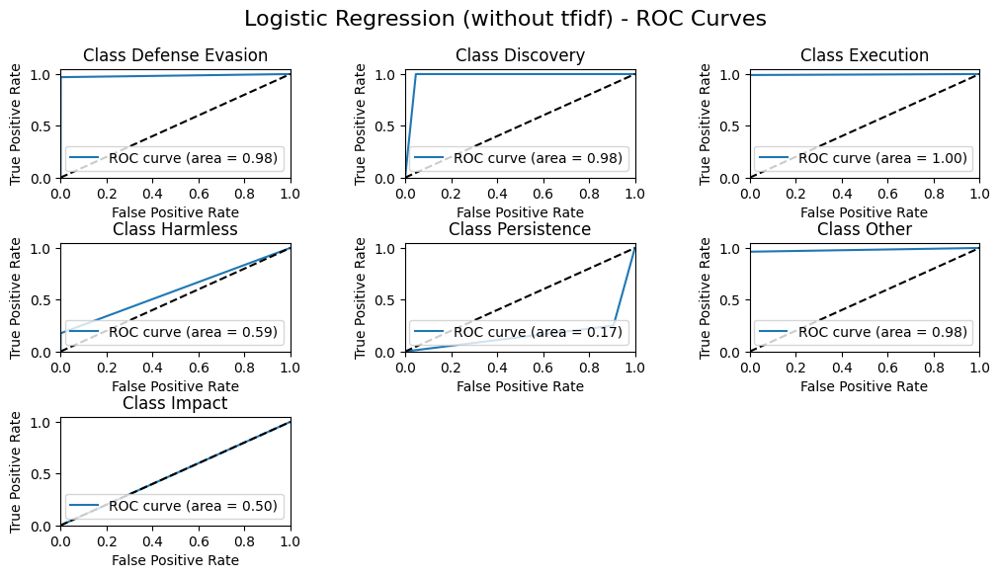

In [94]:
plt_roc_curve(y_test, notfidf_LR_predictions, "Logistic Regression (without tfidf)", labels)

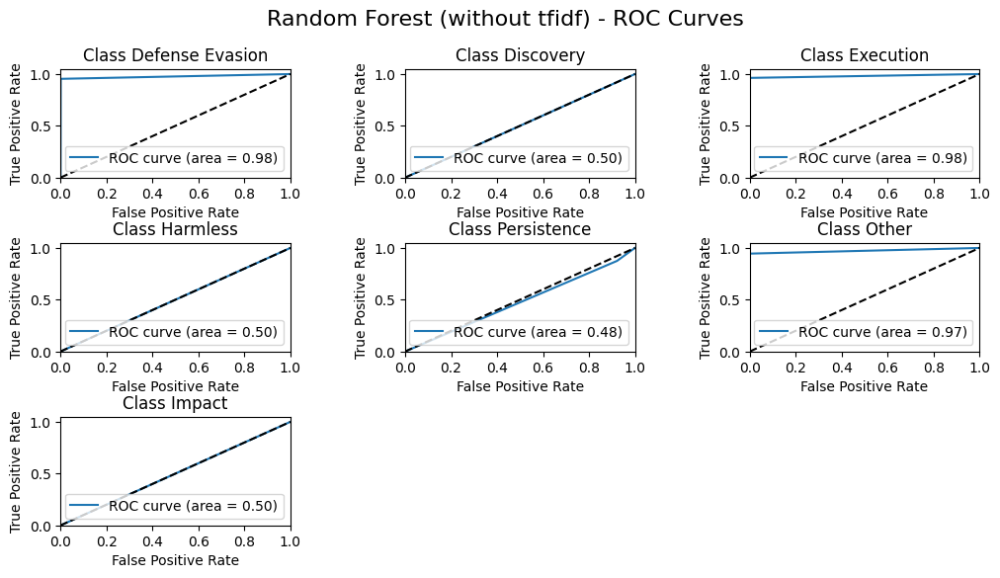

In [95]:
plt_roc_curve(y_test, notfidf_RF_predictions, "Random Forest (without tfidf)", labels)

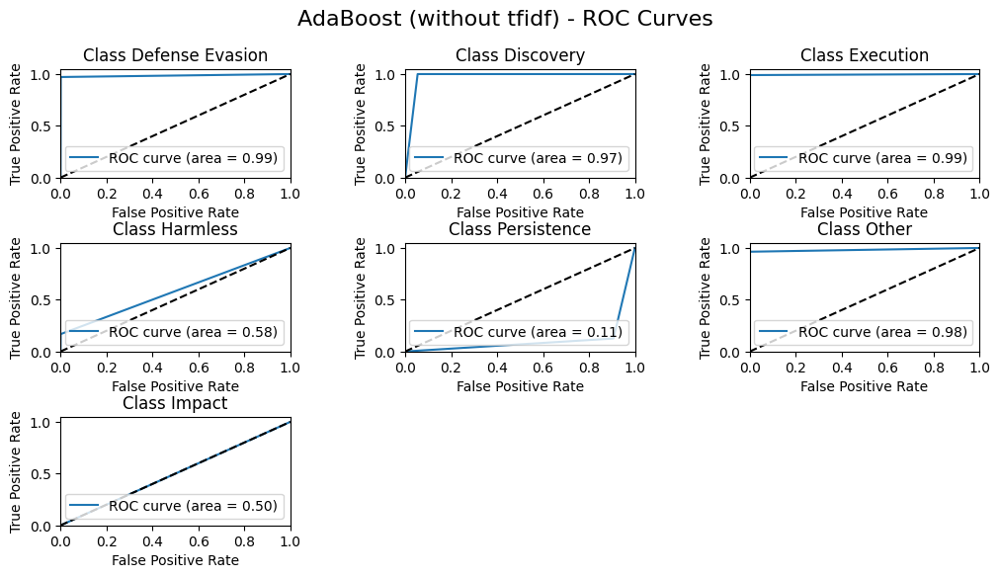

In [96]:
plt_roc_curve(y_test, notfidf_ADA_predictions, "AdaBoost (without tfidf)", labels)

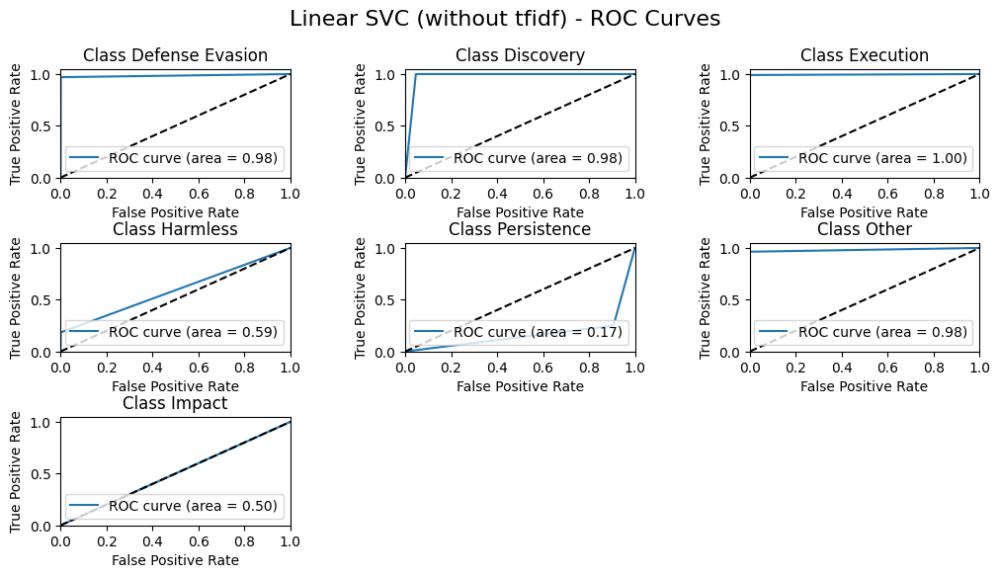

In [97]:
plt_roc_curve(y_test, notfidf_LSVC_predictions, "Linear SVC (without tfidf)", labels)

#### 2.5.4 Some Comments

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

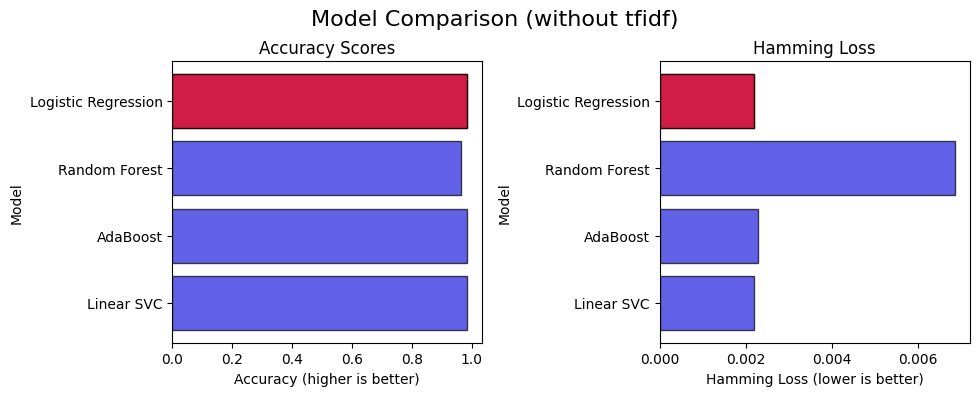

In [98]:
models = ["Logistic Regression", "Random Forest", "AdaBoost", "Linear SVC"]
notfidf_results = [notfidf_LR_predictions, notfidf_RF_predictions, notfidf_ADA_predictions, notfidf_LSVC_predictions]
plot_results(create_results_dataframe(models, notfidf_results), "Model Comparison (without tfidf)")

Comparing the current situation with previous ones, we can see that Random Forest achieves significantly higher accuracy without the implementation of the tf-idf function, also the loss decrease by an order of magnitude (from about 0.08 to 0.007). \
Other that, now the best model for both, Accuracy and Loss is the Logistic Regression even with the default parameters.

### 2.4.5 Hyer Parameters Tuning without tfidf

#### 2.4.5.1 GridSeach

In [99]:
'''# {'lr_model__estimator__C': 10, 'lr_model__estimator__max_iter': 100, 'lr_model__estimator__penalty': 'l2', 'lr_model__estimator__solver': 'lbfgs', 'vect__ngram_range': (1, 2)}

# estimator saga block the execution with signle test that ask over 1 hour

param_grid = {
    'vect__ngram_range': n_gram,
    'lr_model__estimator__C': [0.01,0.1,1,10,100],
    'lr_model__estimator__penalty': ['l1','l2'],
    'lr_model__estimator__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag'],
    'lr_model__estimator__max_iter': [100, 200, 1000]
}

LR_gsearch_cv = GridSearchCV(notfidf_LR_pipeline, param_grid=param_grid, cv=3, verbose=5, n_jobs=1)
LR_gsearch_cv.fit(X_train, y_train)
print(LR_gsearch_cv.best_score_)
print(LR_gsearch_cv.best_params_)
'''

"# {'lr_model__estimator__C': 10, 'lr_model__estimator__max_iter': 100, 'lr_model__estimator__penalty': 'l2', 'lr_model__estimator__solver': 'lbfgs', 'vect__ngram_range': (1, 2)}\n\n# estimator saga block the execution with signle test that ask over 1 hour\n\nparam_grid = {\n    'vect__ngram_range': n_gram,\n    'lr_model__estimator__C': [0.01,0.1,1,10,100],\n    'lr_model__estimator__penalty': ['l1','l2'],\n    'lr_model__estimator__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag'],\n    'lr_model__estimator__max_iter': [100, 200, 1000]\n}\n\nLR_gsearch_cv = GridSearchCV(notfidf_LR_pipeline, param_grid=param_grid, cv=3, verbose=5, n_jobs=1)\nLR_gsearch_cv.fit(X_train, y_train)\nprint(LR_gsearch_cv.best_score_)\nprint(LR_gsearch_cv.best_params_)\n"

In [100]:
# {'rf_model__estimator__criterion': 'gini', 'rf_model__estimator__max_depth': 50, 'rf_model__estimator__max_features': 'sqrt', 'rf_model__estimator__n_estimators': 10, 'vect__ngram_range': (1, 1)}

# param_grid = { 
#     'vect__ngram_range': n_gram,
#     'rf_model__estimator__n_estimators': [10, 20, 50, 100],
#     'rf_model__estimator__max_depth': [5, 10, 20, 50],
#     'rf_model__estimator__criterion': ['gini', 'entropy'],
#     'rf_model__estimator__max_features': ['auto', 'sqrt', 'log2']
# }
# 
# RF_gsearch_cv = GridSearchCV(notfidf_RF_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
# RF_gsearch_cv.fit(X_train, y_train)
# print(RF_gsearch_cv.best_score_)
# print(RF_gsearch_cv.best_params_)

In [101]:
# {'ada_model__estimator__algorithm': 'SAMME.R', 'ada_model__estimator__learning_rate': 1.0, 'ada_model__estimator__n_estimators': 50, 'vect__ngram_range': (1, 2)}

#param_grid = { 
#    'vect__ngram_range': n_gram,
#    'ada_model__estimator__n_estimators': [10, 20, 50, 100],
#    'ada_model__estimator__learning_rate': [0.001, 0.01, 0.1, 1.0],
#    'ada_model__estimator__algorithm': ['SAMME', 'SAMME.R']
#}
#
#ADA_gsearch_cv = GridSearchCV(notfidf_ADA_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
#ADA_gsearch_cv.fit(X_train, y_train)
#print(ADA_gsearch_cv.best_score_)
#print(ADA_gsearch_cv.best_params_)

In [102]:
# {'lsvc_model__estimator__C': 0.1, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__penalty': 'l2', 'vect__ngram_range': (1, 2)}
'''
param_grid = {
    'vect__ngram_range': n_gram,
    'lsvc_model__estimator__C': [0.1, 1, 10, 100, 200],
    'lsvc_model__estimator__penalty': ['l1', 'l2'],
    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],
    'lsvc_model__estimator__max_iter': [100, 200, 1000],
}

LSVC_gsearch_cv = GridSearchCV(notfidf_LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
LSVC_gsearch_cv.fit(X_train, y_train)
print(LSVC_gsearch_cv.best_score_)
print(LSVC_gsearch_cv.best_params_)
'''

"\nparam_grid = {\n    'vect__ngram_range': n_gram,\n    'lsvc_model__estimator__C': [0.1, 1, 10, 100, 200],\n    'lsvc_model__estimator__penalty': ['l1', 'l2'],\n    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],\n    'lsvc_model__estimator__max_iter': [100, 200, 1000],\n}\n\nLSVC_gsearch_cv = GridSearchCV(notfidf_LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nLSVC_gsearch_cv.fit(X_train, y_train)\nprint(LSVC_gsearch_cv.best_score_)\nprint(LSVC_gsearch_cv.best_params_)\n"

#### 2.4.5.2 Model training

In [103]:
best_noftidf_LR_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,2))),
                        ('lr_model', MultiOutputClassifier(LogisticRegression(C=10, penalty='l2', solver='lbfgs', max_iter=100, random_state=random_value), n_jobs=-1))])
best_noftidf_LR_pipeline, best_noftidf_LR_predictions, best_noftidf_LR_train_predictions = run_pipeline(best_noftidf_LR_pipeline, X_train, y_train, X_test)

In [104]:
best_noftidf_RF_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,1))),
                        ('rf_model', MultiOutputClassifier(RandomForestClassifier(criterion='gini', max_depth=50, max_features='sqrt', n_estimators=10, random_state=random_value), n_jobs=-1))])
best_noftidf_RF_pipeline, best_noftidf_RF_predictions, best_noftidf_RF_train_predictions = run_pipeline(best_noftidf_RF_pipeline, X_train, y_train, X_test)

In [105]:
# same as default
best_noftidf_ADA_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('ada_model', MultiOutputClassifier(AdaBoostClassifier(algorithm='SAMME.R', learning_rate=1.0, n_estimators=50, random_state=random_value), n_jobs=-1))])
best_noftidf_ADA_pipeline, best_noftidf_ADA_predictions, best_noftidf_ADA_train_predictions = run_pipeline(best_noftidf_ADA_pipeline, X_train, y_train, X_test)

In [106]:
best_noftidf_LSVC_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('lsvc_model', MultiOutputClassifier(LinearSVC(C=0.1, loss='squared_hinge', penalty='l2', random_state=random_value, max_iter=1000, dual=False), n_jobs=-1))])
best_noftidf_LSVC_pipeline, best_noftidf_LSVC_predictions, best_noftidf_LSVC_train_predictions = run_pipeline(best_noftidf_LSVC_pipeline, X_train, y_train, X_test)

#### 2.4.5.3 Optimized Classification Reports

In [107]:
print('Training Set Best LR (without tfidf)')
print(classification_report(y_train, best_noftidf_LR_train_predictions, target_names=labels))
print('Test Set Best LR (without tfidf)')
print(classification_report(y_test, best_noftidf_LR_predictions, target_names=labels))

Training Set Best LR (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       1.00      1.00      1.00     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      0.99      0.99      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      1.00      1.00    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test Set Best LR (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmles

In [108]:
print('Training Set Best RF (without tfidf)')
print(classification_report(y_train, best_noftidf_RF_train_predictions, target_names=labels))
print('Test Set Best RF (without tfidf)')
print(classification_report(y_test, best_noftidf_RF_predictions, target_names=labels))

Training Set Best RF (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.96      0.08      0.16      1580
    Persistence       0.99      1.00      0.99    147935
          Other       1.00      0.99      0.99       217
         Impact       1.00      0.89      0.94        19

      micro avg       1.00      0.99      0.99    390455
      macro avg       0.99      0.85      0.87    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       0.99      0.99      0.99    390455

Test Set Best RF (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmles

In [109]:
print('Training Set Best ADA (without tfidf)')
print(classification_report(y_train, best_noftidf_ADA_train_predictions, target_names=labels))
print('Test Set Best ADA (without tfidf)')
print(classification_report(y_test, best_noftidf_ADA_predictions, target_names=labels))

Training Set Best ADA (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.91      0.16      0.28      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.99      0.87      0.89    390455
   weighted avg       1.00      0.99      1.00    390455
    samples avg       1.00      0.99      1.00    390455

Test Set Best ADA (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harml

In [110]:
print('Training Set Best LSVC (without tfidf)')
print(classification_report(y_train, best_noftidf_LSVC_train_predictions, target_names=labels))
print('Test Set Best LSVC (without tfidf)')
print(classification_report(y_test, best_noftidf_LSVC_predictions, target_names=labels))

Training Set Best LSVC (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       1.00      0.98      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      0.99      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      1.00      1.00    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test Set Best LSVC (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Har

#### 2.4.5.4 Graph

##### 2.4.5.4.1 Confusion Matrix - Test set

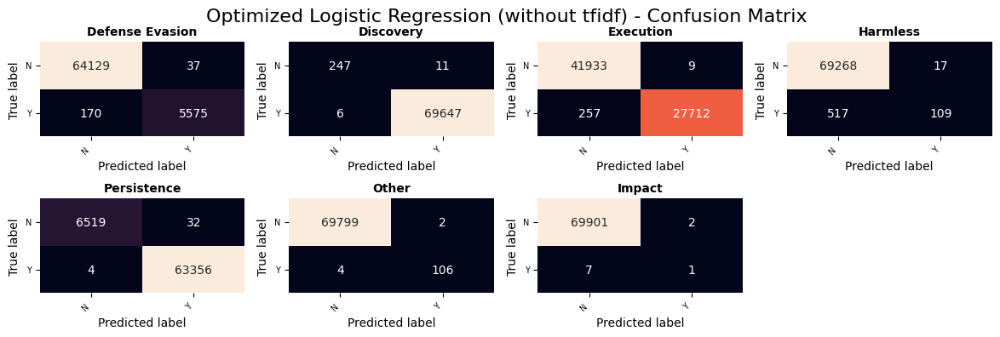

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [111]:
create_plot(multilabel_confusion_matrix(y_test, best_noftidf_LR_predictions), "Optimized Logistic Regression (without tfidf)")

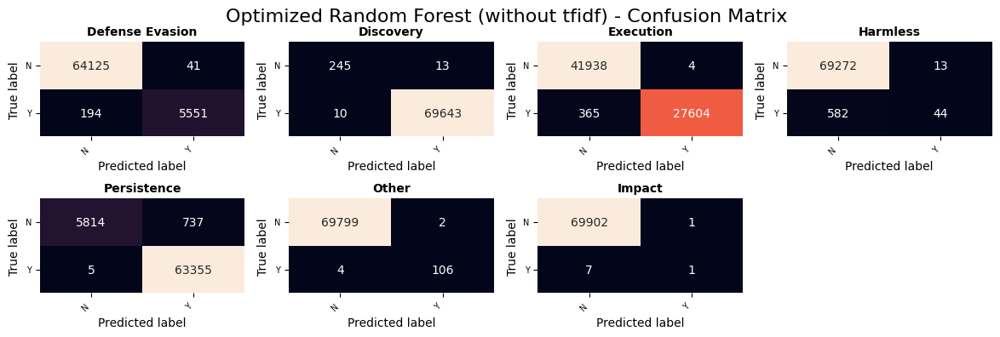

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [112]:
create_plot(multilabel_confusion_matrix(y_test, best_noftidf_RF_predictions), "Optimized Random Forest (without tfidf)")

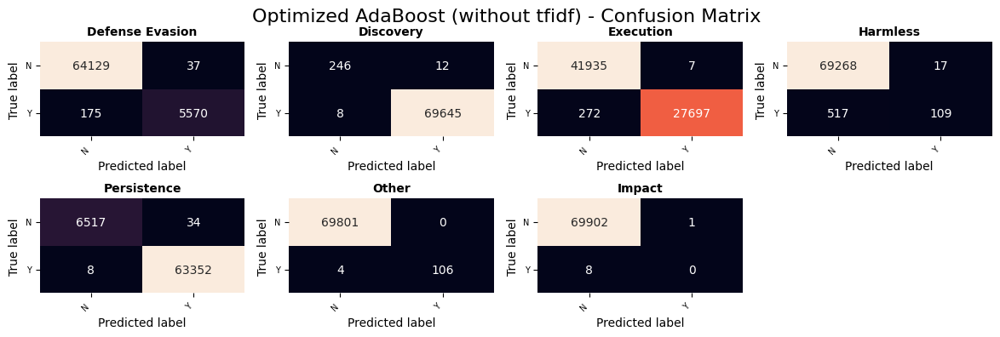

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [113]:
create_plot(multilabel_confusion_matrix(y_test, best_noftidf_ADA_predictions), "Optimized AdaBoost (without tfidf)")

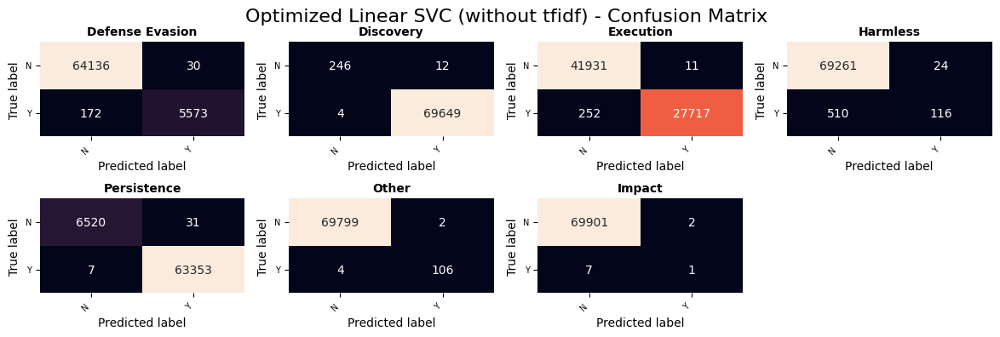

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [114]:
create_plot(multilabel_confusion_matrix(y_test, best_noftidf_LSVC_predictions), "Optimized Linear SVC (without tfidf)")

##### 2.4.5.4.2 Confusion Matrix - Training set

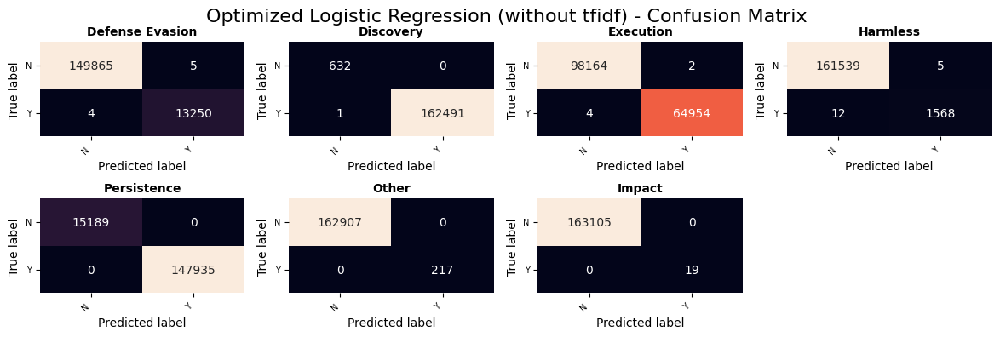

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [115]:
create_plot(multilabel_confusion_matrix(y_train, best_noftidf_LR_train_predictions), "Optimized Logistic Regression (without tfidf)")

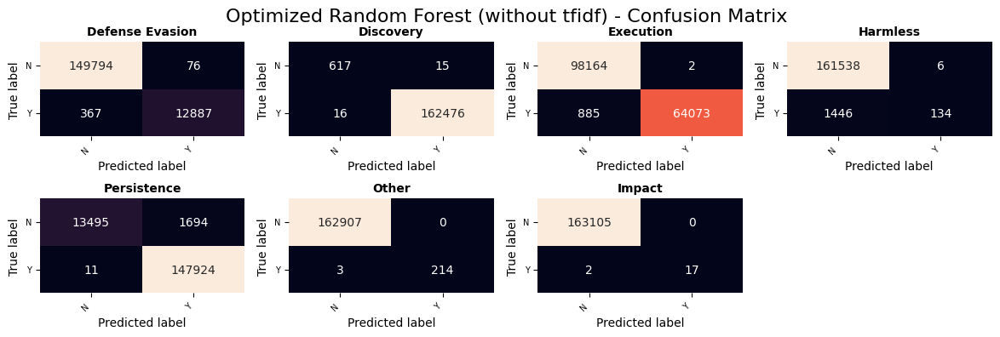

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [116]:
create_plot(multilabel_confusion_matrix(y_train, best_noftidf_RF_train_predictions), "Optimized Random Forest (without tfidf)")

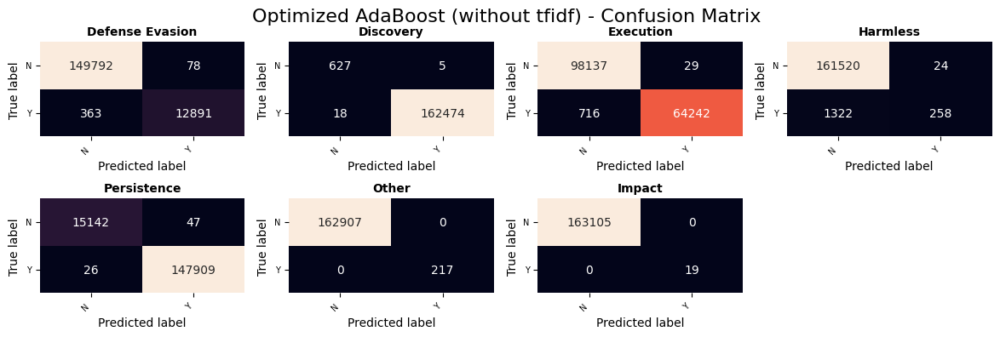

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [117]:
create_plot(multilabel_confusion_matrix(y_train, best_noftidf_ADA_train_predictions), "Optimized AdaBoost (without tfidf)")

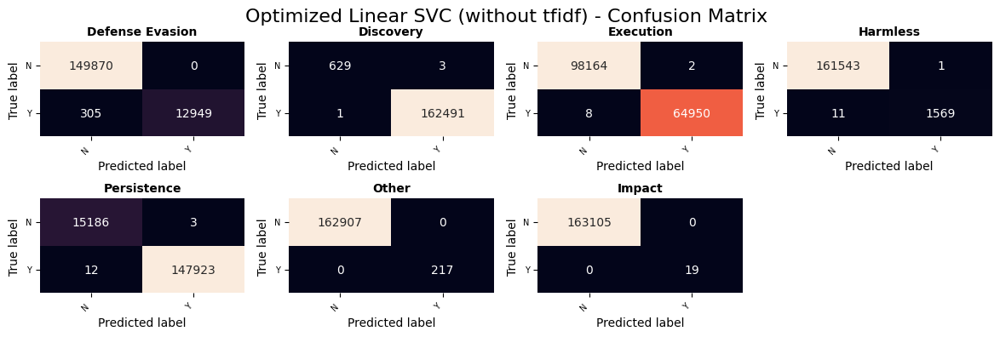

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [118]:
create_plot(multilabel_confusion_matrix(y_train, best_noftidf_LSVC_train_predictions), "Optimized Linear SVC (without tfidf)")

##### 2.4.5.4.2 Roc curve

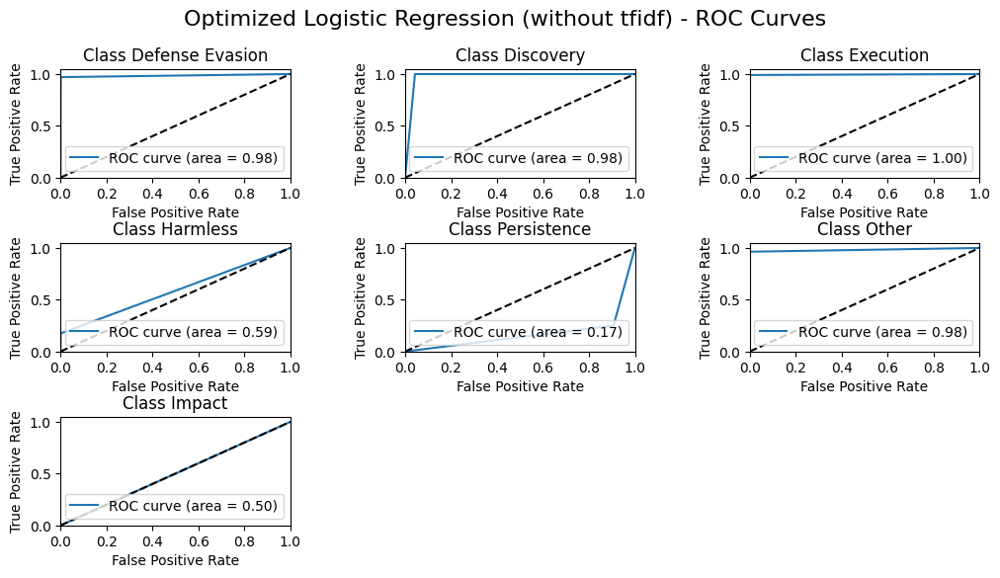

In [119]:
plt_roc_curve(y_test, best_noftidf_LR_predictions, "Optimized Logistic Regression (without tfidf)", labels)

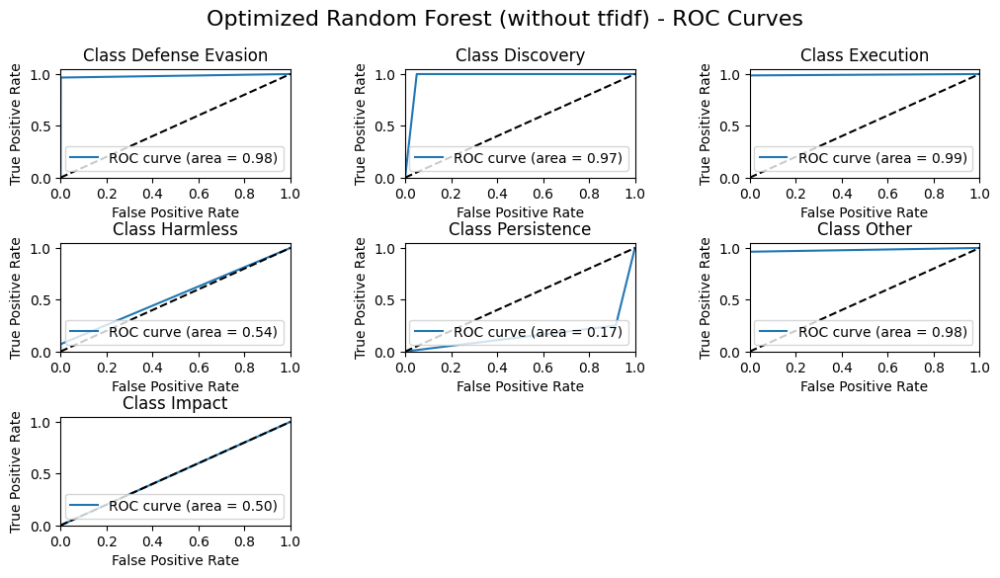

In [120]:
plt_roc_curve(y_test, best_noftidf_RF_predictions, "Optimized Random Forest (without tfidf)", labels)

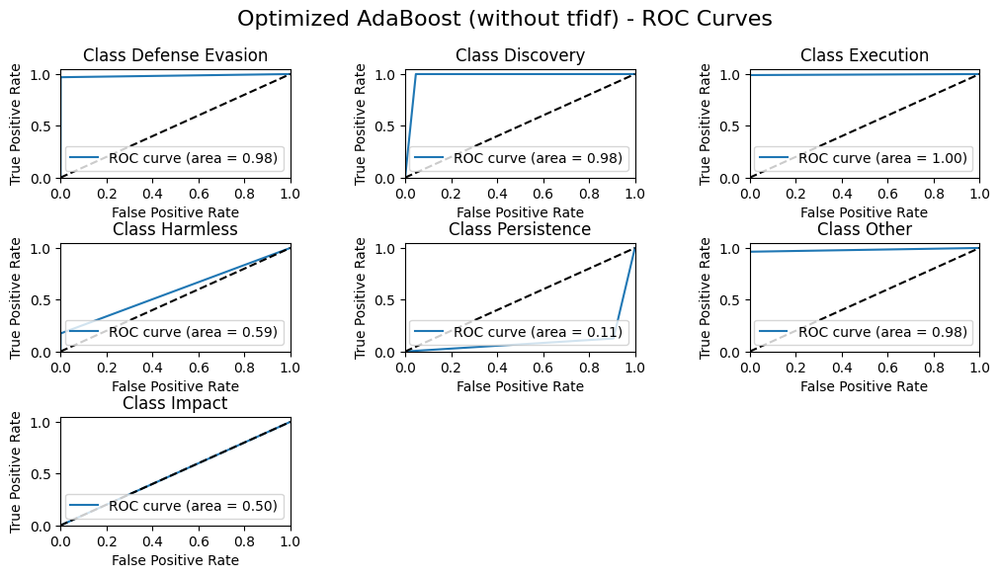

In [121]:
plt_roc_curve(y_test, best_noftidf_ADA_predictions, "Optimized AdaBoost (without tfidf)", labels)

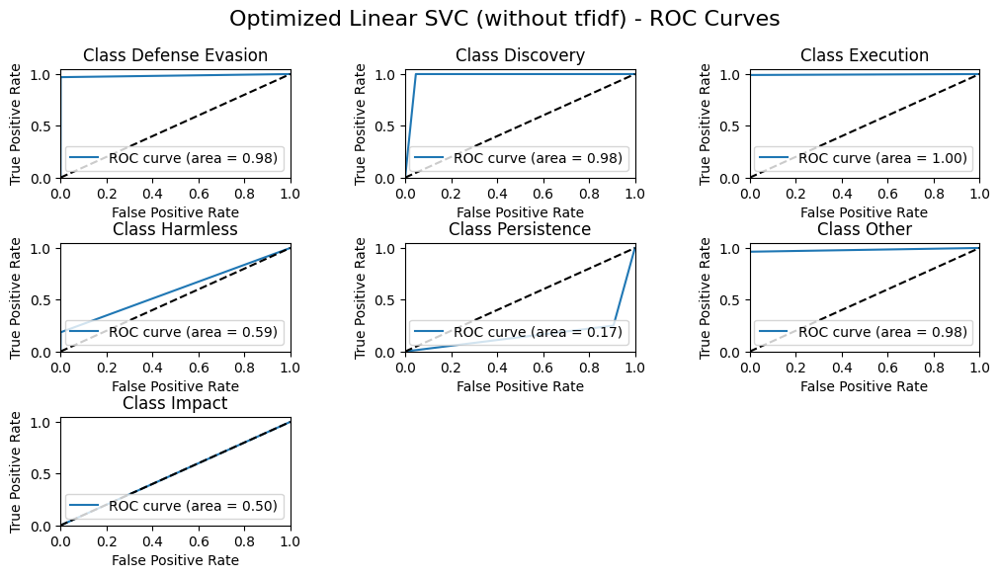

In [122]:
plt_roc_curve(y_test, best_noftidf_LSVC_predictions, "Optimized Linear SVC (without tfidf)", labels)

#### 2.4.6 Some Comments

In [123]:
def get_metrics(y_test, predictions):
    accuracy = accuracy_score(y_test, predictions)
    hamming = hamming_loss(y_test, predictions)
    f1 = f1_score(y_test, predictions, average='micro')
    precision = precision_score(y_test, predictions, average='micro')
    recall = recall_score(y_test, predictions, average='micro')
    return accuracy, hamming, f1, precision, recall


results = {}
results['LR'] = get_metrics(y_test, LR_predictions)
results['best LR'] = get_metrics(y_test, best_LR_predictions)
results['no tfidf LR'] = get_metrics(y_test, notfidf_LR_predictions)
results['best no tfidf LR'] = get_metrics(y_test, best_noftidf_LR_predictions)
results['RF'] = get_metrics(y_test, RF_predictions)
results['best RF'] = get_metrics(y_test, best_RF_predictions)
results['no tfidf RF'] = get_metrics(y_test, notfidf_RF_predictions)
results['best no tfidf RF'] = get_metrics(y_test, best_noftidf_RF_predictions)
results['ADA'] = get_metrics(y_test, ADA_predictions)
results['best ADA'] = get_metrics(y_test, best_ADA_predictions)
results['no tfidf ADA'] = get_metrics(y_test, notfidf_ADA_predictions)
results['best no-tfidf ADA'] = get_metrics(y_test, best_noftidf_ADA_predictions)
results['LSVC'] = get_metrics(y_test, LSVC_predictions)
results['best LSVC'] = get_metrics(y_test, best_LSVC_predictions)
results['no tfidf LSVC'] = get_metrics(y_test, notfidf_LSVC_predictions)
results['best no tfidf LSVC'] = get_metrics(y_test, best_noftidf_LSVC_predictions)

# convert the dictionary to a DataFrame
results_df = pd.DataFrame(results, index=['Accuracy', 'Hamming Loss', 'F1', 'Precision', 'Recall'])
results_df

,LR,best LR,no tfidf LR,best no tfidf LR,RF,best RF,no tfidf RF,best no tfidf RF,ADA,best ADA,no tfidf ADA,best no-tfidf ADA,LSVC,best LSVC,no tfidf LSVC,best no tfidf LSVC
Accuracy,0.982707,0.985625,0.985653,0.985667,0.483887,0.569596,0.964169,0.975025,0.982907,0.983407,0.985110,0.985396,0.984595,0.985453,0.985582,0.985739
Hamming Loss,0.002932,0.002211,0.002191,0.002197,0.077701,0.063432,0.006845,0.004042,0.002628,0.002583,0.002291,0.002248,0.002374,0.002235,0.002199,0.002182
F1,0.995705,0.996761,0.996791,0.996782,0.897335,0.914187,0.989982,0.994088,0.996150,0.996216,0.996645,0.996707,0.996522,0.996726,0.996779,0.996803
Precision,0.998283,0.999280,0.999370,0.999340,0.818974,0.851138,0.991554,0.995147,0.998841,0.999045,0.999184,0.999352,0.999100,0.999208,0.999298,0.999328
Recall,0.993139,0.994256,0.994226,0.994238,0.992279,0.987323,0.988416,0.993032,0.993473,0.993402,0.994118,0.994077,0.993957,0.994256,0.994274,0.994292


<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

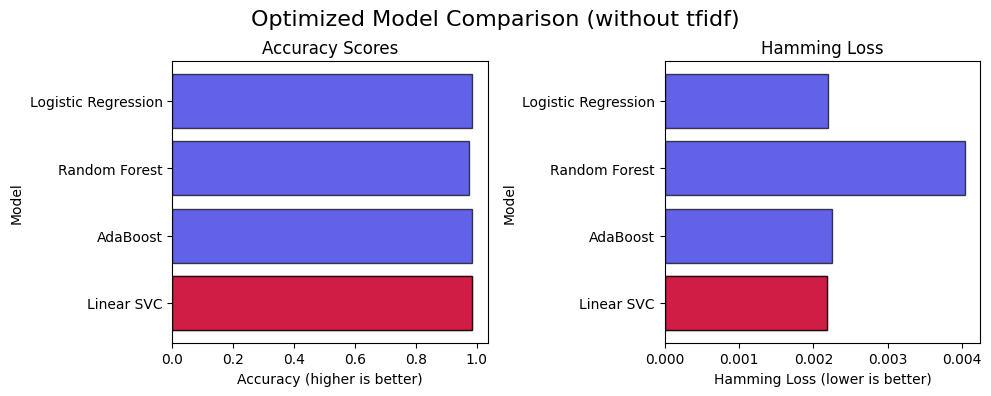

In [124]:
optz_notfidf_results = [best_noftidf_LR_predictions, best_noftidf_RF_predictions, best_noftidf_ADA_predictions, best_noftidf_LSVC_predictions]
plot_results(create_results_dataframe(models, optz_notfidf_results), "Optimized Model Comparison (without tfidf)")

From a first superficial view, we can see that the Random Forest hamming loss has dropped further to 0.004, but it is still a very bad result compared to the other models which remained slightly above 0.02.\
Other that, now the best model (among those with optimized hyper-parameters) is the Liner SVC for both, loss and accuracy. \
Now, if we want to make a more granular comparison and see how the parameters have evolved for individual labels, we find that:

- **Logistic Regression**: There are no notable changes

- **Random Forest**: The general situation is a bit static, but we can see hoe the recall for Impact is passed from 0.05 and 0 to 0.89 and 0.12 (in order training and test set). Also the recall for the label Harmless has made slight improvements, from 0 and 0 to 0.08 and 0.07

- **Ada Boost**: There are no notable changes

- **Linear SVC**: There are no notable changes

To close this section, we can see how using a technique such as GridSearch to optimize hyper parameters, in this case, was not particularly effective, bringing bland improvements for most models.\
Using other techniques or a different definition of the possible hyper-parameters could lead to better results, but given the available hardware the required timelines result unsustainable.


<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

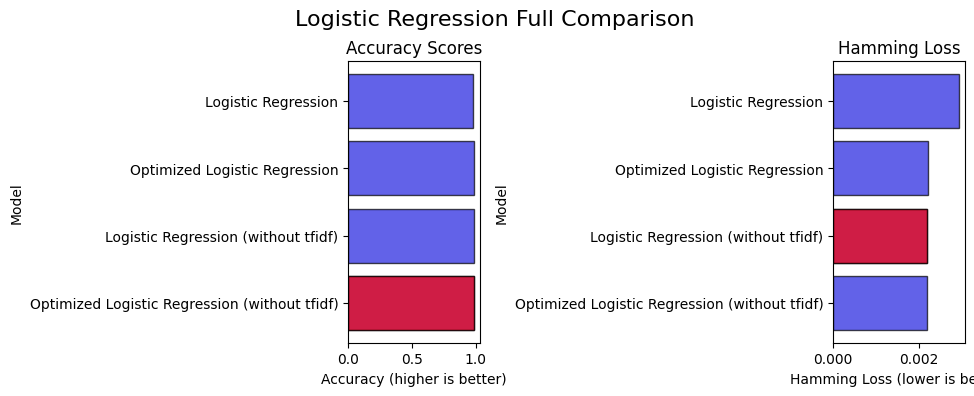

In [125]:
LR_models = ["Logistic Regression", "Optimized Logistic Regression", "Logistic Regression (without tfidf)", "Optimized Logistic Regression (without tfidf)"]
LR_results = [LR_predictions, best_LR_predictions, notfidf_LR_predictions, best_noftidf_LR_predictions]
plot_results(create_results_dataframe(LR_models, LR_results), "Logistic Regression Full Comparison")

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

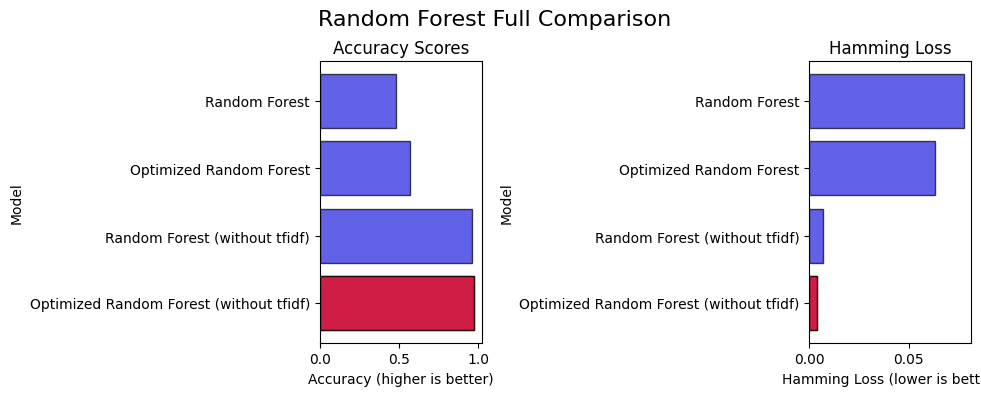

In [126]:
RF_models = ["Random Forest", "Optimized Random Forest", "Random Forest (without tfidf)", "Optimized Random Forest (without tfidf)"]
RF_results = [RF_predictions, best_RF_predictions, notfidf_RF_predictions, best_noftidf_RF_predictions]
plot_results(create_results_dataframe(RF_models, RF_results), "Random Forest Full Comparison")

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

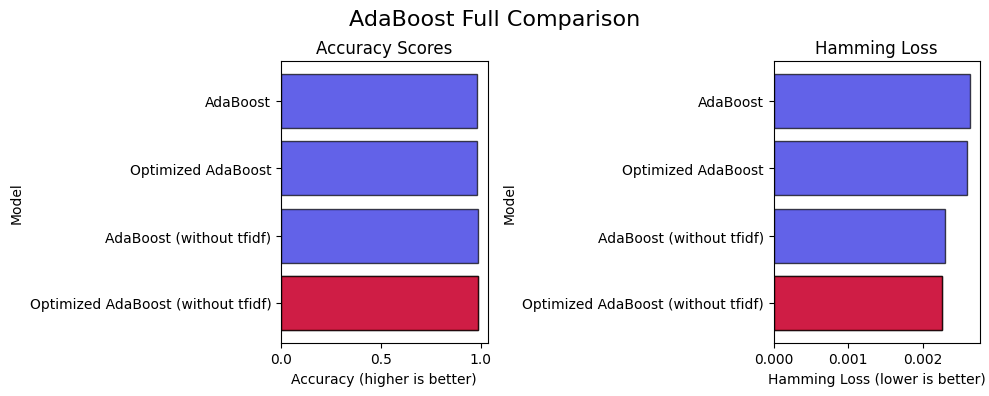

In [127]:
ADA_models = ["AdaBoost", "Optimized AdaBoost", "AdaBoost (without tfidf)", "Optimized AdaBoost (without tfidf)"]
ADA_results = [ADA_predictions, best_ADA_predictions, notfidf_ADA_predictions, best_noftidf_ADA_predictions]
plot_results(create_results_dataframe(ADA_models, ADA_results), "AdaBoost Full Comparison")

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

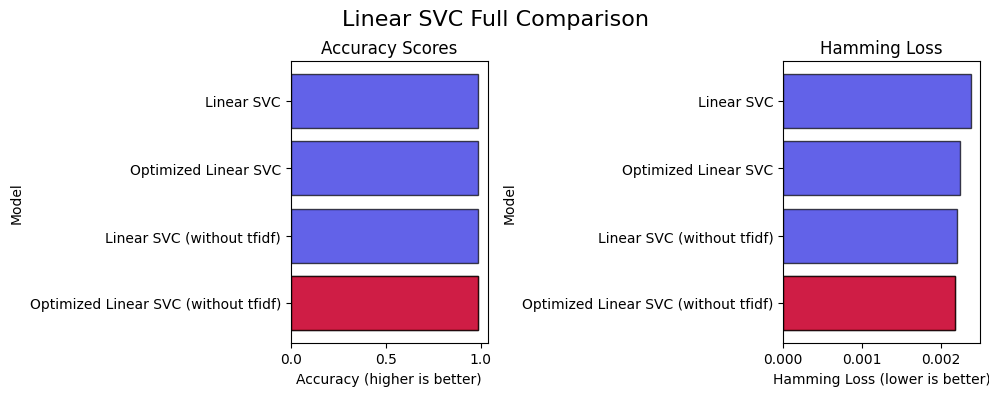

In [128]:
LSVC_models = ["Linear SVC", "Optimized Linear SVC", "Linear SVC (without tfidf)", "Optimized Linear SVC (without tfidf)"]
LSVC_results = [LSVC_predictions, best_LSVC_predictions, notfidf_LSVC_predictions, best_noftidf_LSVC_predictions]
plot_results(create_results_dataframe(LSVC_models, LSVC_results), "Linear SVC Full Comparison")

**Final results** \
At this point, for each base model we have 4 differents "implementation":
- normalized with default hyper-parameters
- normalized with optimized hyper-parameters
- not normalized with default hyper-parameters
- not normalized with optimized hyper-parameters

Analyzing the final results, we can see that, for the dataset in use, normalizing the data and using tf-idf is deleterious, as for each model used, the best results were obtained by working on non-normalized data. \
In particular, the Random Forest model gains a large advantage from the nonnormalized data, while the other models show only slight improvements. \
In conclusion, from the data obtained, we can say that the best result was obtained by starting from non-normalized data vectorized with an ngram_range=(1,2) and using the Linear SVC model with the hyper-parameters optimized according to the following values:
- C=0.1
- loss=squared_hinge
- penalty=l2
- max_iter=1000
- dual=False
But even in this case there is some problem with the labels Impact and Harmell that have gone from an initial underfitting situation to one that, seeing the recall results, is more akin to a case of overfitting

## 2.6 Ensemble Method
Another method to improve results si to combine conceptually different machine learning classifiers and use a majority vote to predict the class labels. \
And as done with the individual models, I proceeded to run the test both with data normalization and without (but working directly with hyperparameters found from previous optimizations)

### 2.6.1 Model training

In [129]:

# 7 minutes
ensemble_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('ensemble_model', MultiOutputClassifier(VotingClassifier(estimators=[('lr', LogisticRegression(C=10, penalty='l1', solver='liblinear', random_state=random_value)), 
                                                                                                ('rf', RandomForestClassifier(criterion='gini', max_depth=20, max_features='sqrt', n_estimators=10, random_state=random_value)), 
                                                                                                ('ada', AdaBoostClassifier(algorithm='SAMME.R', learning_rate=0.1, n_estimators=100, random_state=random_value)), 
                                                                                                ('lsvc', LinearSVC(C=10, loss='squared_hinge', penalty='l1', random_state=random_value, max_iter=1000, dual=False))]), n_jobs=-1))])

ensemble_pipeline, ensemble_predictions, ensemble_train_predictions = run_pipeline(ensemble_pipeline, X_train, y_train, X_test)


In [130]:
# 6 minutes
ensemble_noftidf_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('ensemble_model', MultiOutputClassifier(VotingClassifier(estimators=[('lr', LogisticRegression(C=10, penalty='l2', solver='lbfgs',max_iter=100, random_state=random_value)), 
                                                                                                ('rf', RandomForestClassifier(criterion='gini', max_depth=50, max_features='sqrt', n_estimators=10, random_state=random_value)), 
                                                                                                ('ada', AdaBoostClassifier(algorithm='SAMME.R', learning_rate=1.0, n_estimators=50, random_state=random_value)), 
                                                                                                ('lsvc', LinearSVC(C=0.1, loss='squared_hinge', penalty='l2', random_state=random_value, max_iter=1000, dual=False))]), n_jobs=-1))])

ensemble_noftidf_pipeline, ensemble_noftidf_predictions, ensemble_noftidf_train_predictions = run_pipeline(ensemble_noftidf_pipeline, X_train, y_train, X_test)

### 2.6.2 Classification Reports

In [131]:

print('Training Set Ensemble')
print(classification_report(y_train, ensemble_train_predictions, target_names=labels))
print('Test Set Ensemble')
print(classification_report(y_test, ensemble_predictions, target_names=labels))


Training Set Ensemble
                 precision    recall  f1-score   support

Defense Evasion       1.00      0.97      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       1.00      0.16      0.27      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.95      0.97        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       1.00      0.87      0.89    390455
   weighted avg       1.00      0.99      1.00    390455
    samples avg       1.00      0.99      1.00    390455

Test Set Ensemble
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       0.99      0.11      0.

In [132]:
print('Training Set Ensemble (without tfidf)')
print(classification_report(y_train, ensemble_noftidf_train_predictions, target_names=labels))
print('Test Set Ensemble (without tfidf)')
print(classification_report(y_test, ensemble_noftidf_predictions, target_names=labels))

Training Set Ensemble (without tfidf)


                 precision    recall  f1-score   support

Defense Evasion       1.00      0.98      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       1.00      0.18      0.31      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      1.00      1.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       1.00      0.88      0.90    390455
   weighted avg       1.00      0.99      1.00    390455
    samples avg       1.00      0.99      1.00    390455

Test Set Ensemble (without tfidf)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.90      0.17      0.29    

### 2.6.3 Graphs

#### 2.6.3.1 Stability Matrix - Test set

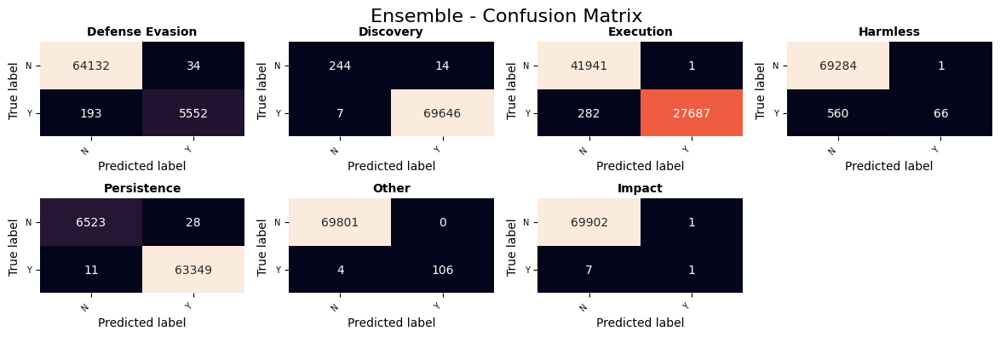

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [133]:
create_plot(multilabel_confusion_matrix(y_test, ensemble_predictions), "Ensemble")

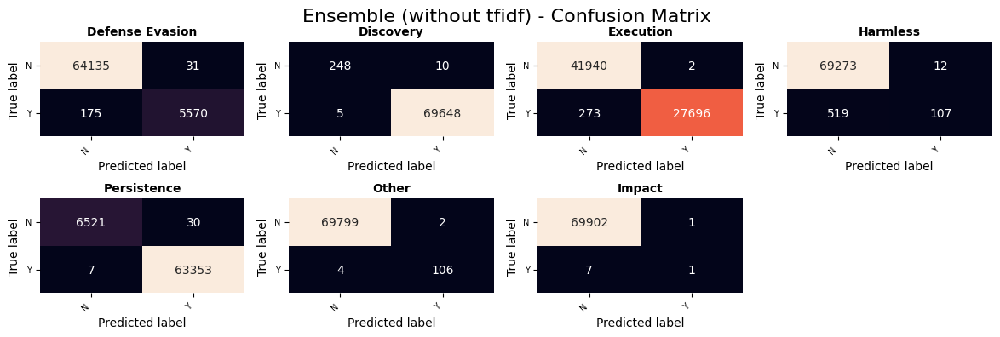

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [134]:
create_plot(multilabel_confusion_matrix(y_test, ensemble_noftidf_predictions), "Ensemble (without tfidf)")

#### 2.6.3.2 Stability Matrix - Training set

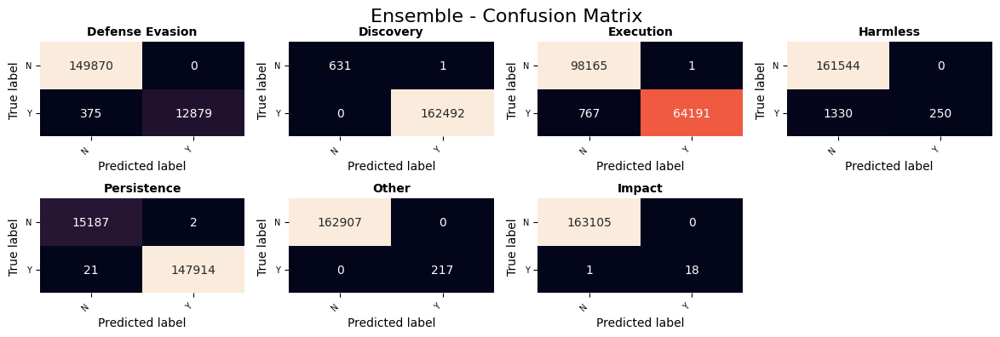

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [135]:
create_plot(multilabel_confusion_matrix(y_train, ensemble_train_predictions), "Ensemble")

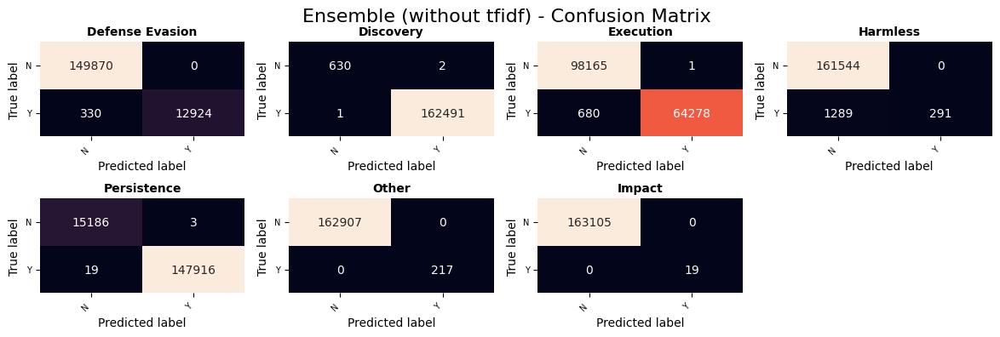

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [136]:
create_plot(multilabel_confusion_matrix(y_train, ensemble_noftidf_train_predictions), "Ensemble (without tfidf)")

#### 2.6.3.3 ROC Curve

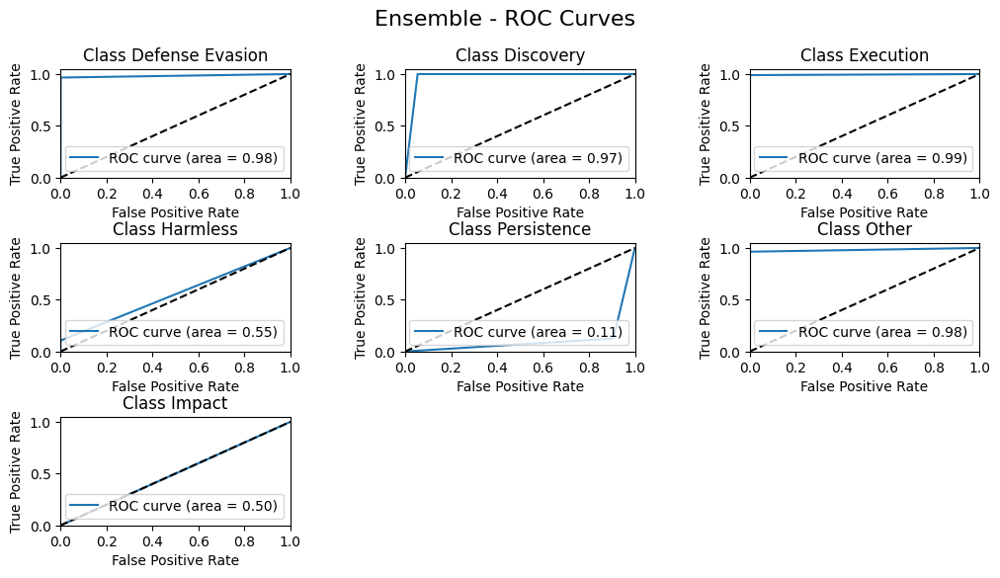

In [137]:
plt_roc_curve(y_test, ensemble_predictions, "Ensemble", labels)

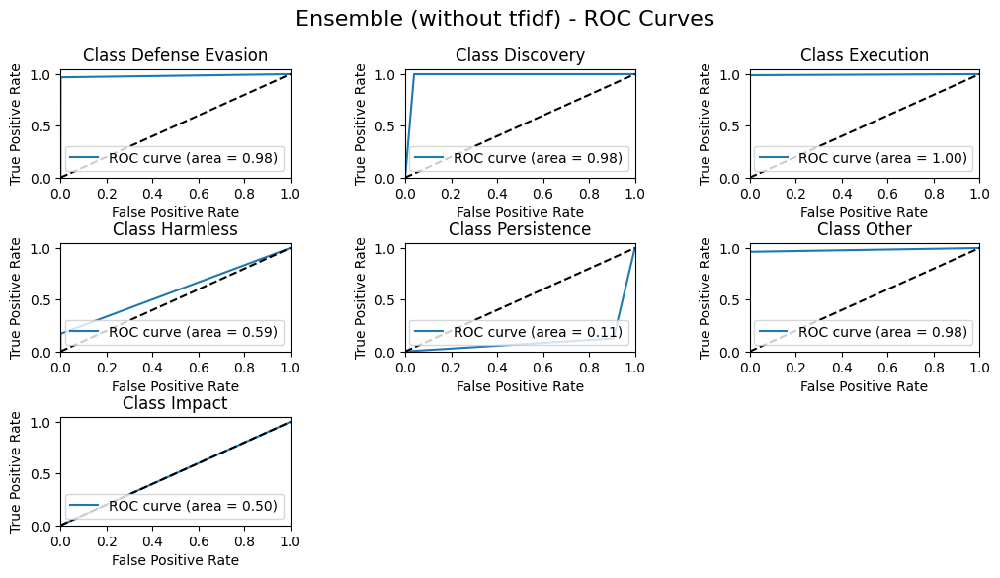

In [138]:
plt_roc_curve(y_test, ensemble_noftidf_predictions, "Ensemble (without tfidf)", labels)

### 2.6.4 Some Comments

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

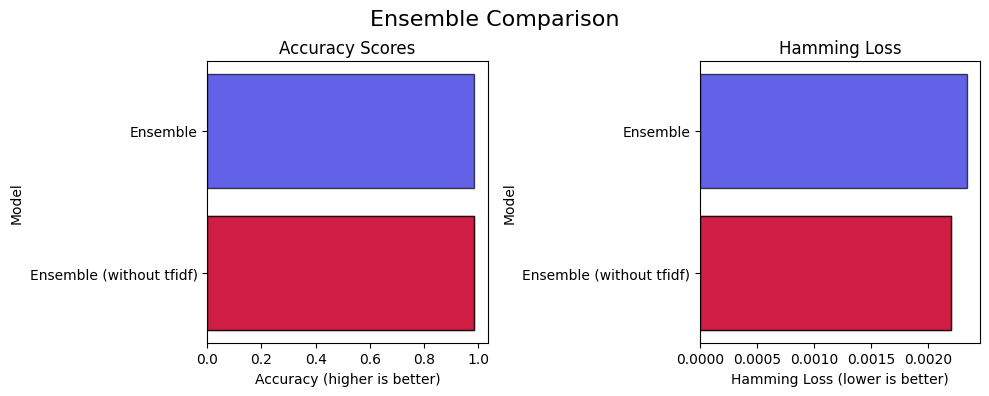

In [139]:
esenble_results = [ensemble_predictions, ensemble_noftidf_predictions]
plot_results(create_results_dataframe(['Ensemble', 'Ensemble (without tfidf)'], esenble_results), "Ensemble Comparison")

The results follow the same line as the previous ones, so we find better results working without normalization, and the problems of Impact and Harmless remain

## 2.7 Class Weight

The last test consists in implementing different weights for the various classes. \
In this way it should be possible to give more importance to the samples that present the labels under-represented 

In [140]:
class_weights = {}
for label in range(np.asarray(dataset[labels]).shape[1]):
    class_weights[label] = dict(zip(np.unique(np.asarray(dataset[labels])[:, label]), compute_class_weight(class_weight='balanced', classes=np.unique(np.asarray(dataset[labels])[:, label]), y=np.asarray(dataset[labels])[:, label])))

# Extract only the second value from each tuple
class_weights = {label: weight[1] for label, weight in class_weights.items()}

'''
#sample weights
# Tested, but destroys the results
sample_weights = compute_sample_weight(class_weight="balanced", y=y_train)
print(sample_weights)
'''

'\n#sample weights\n# Tested, but destroys the results\nsample_weights = compute_sample_weight(class_weight="balanced", y=y_train)\nprint(sample_weights)\n'

### 2.7.1 First try
To test a first fast implementation, Logistic Rregression was used given the short execution times

In [141]:
LR_weighted_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False)),
                        ('model', MultiOutputClassifier(LogisticRegression(random_state=39, class_weight=class_weights), n_jobs=-1))])

LR_weighted_pipeline, LR_weighted_predictions, LR_weighted_train_predictions = run_pipeline(LR_weighted_pipeline, X_train, y_train, X_test)

In [142]:
print('Training Set LR (weighted)')
print(classification_report(y_train, LR_weighted_train_predictions, target_names=labels))
print('Test Set LR (weighted)')
print(classification_report(y_test, LR_weighted_predictions, target_names=labels))

Training Set LR (weighted)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.98      0.99     64958
       Harmless       0.99      0.09      0.16      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      0.94      0.97       217
         Impact       0.00      0.00      0.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.86      0.71      0.73    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       1.00      0.99      0.99    390455

Test Set LR (weighted)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       1.00      0.

In [143]:
print('Training Set LR')
print(classification_report(y_train, LR_train_predictions, target_names=labels))
print('Test Set LR')
print(classification_report(y_test, LR_predictions, target_names=labels))

Training Set LR
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      0.99      0.99     64958
       Harmless       0.97      0.09      0.17      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      0.95      0.98       217
         Impact       0.00      0.00      0.00        19

      micro avg       1.00      0.99      1.00    390455
      macro avg       0.85      0.71      0.73    390455
   weighted avg       1.00      0.99      0.99    390455
    samples avg       1.00      0.99      1.00    390455

Test Set LR
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      0.99     27969
       Harmless       0.91      0.12      0.22       626

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

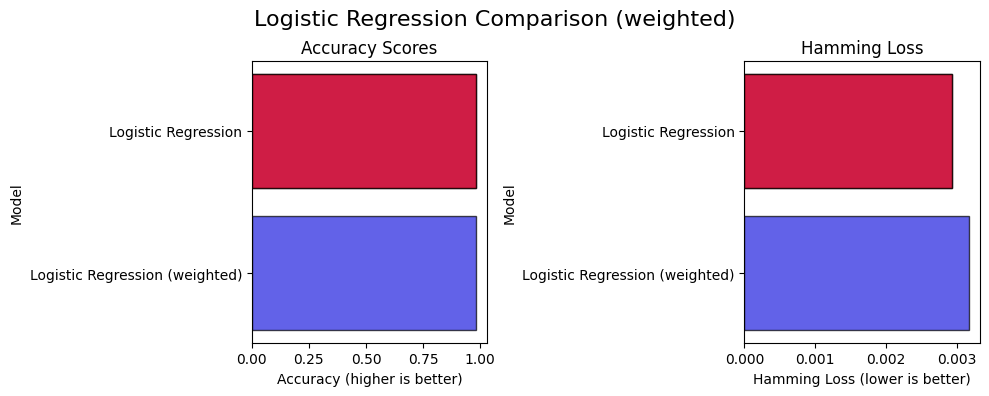

In [144]:
plot_results(create_results_dataframe(['Logistic Regression', 'Logistic Regression (weighted)'], [LR_predictions, LR_weighted_predictions]), "Logistic Regression Comparison (weighted)")

After this first test for the implementation of the weights, we can say that there no improvement with the use of the default model parameters. \
To ensure the result, we can try to optimize a model by taking weights into account. \
To do this we move on to using Liner SVC which has proven to be the best model so far


### 2.7.2 Hyper Parameters Tuning

To ensure thoroughness, optimization was conducted both with and without data normalization.

In [145]:
'''
from sklearn.model_selection import GridSearchCV
n_gram=[(1,1),(1,2)]


param_grid = {
    'tfidf__ngram_range': n_gram,
    'lsvc_model__estimator__C': [0.1, 1, 10, 100],
    'lsvc_model__estimator__penalty': ['l1', 'l2'],
    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],
    'lsvc_model__estimator__dual': [False],
    'lsvc_model__estimator__max_iter': [100, 200, 1000],
    'lsvc_model__estimator__class_weight': [class_weights]
}

LSVC_gsearch_cv = GridSearchCV(LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
LSVC_gsearch_cv.fit(X_train, y_train)
print(LSVC_gsearch_cv.best_score_)
print(LSVC_gsearch_cv.best_params_)
'''

"\nfrom sklearn.model_selection import GridSearchCV\nn_gram=[(1,1),(1,2)]\n\n\nparam_grid = {\n    'tfidf__ngram_range': n_gram,\n    'lsvc_model__estimator__C': [0.1, 1, 10, 100],\n    'lsvc_model__estimator__penalty': ['l1', 'l2'],\n    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],\n    'lsvc_model__estimator__dual': [False],\n    'lsvc_model__estimator__max_iter': [100, 200, 1000],\n    'lsvc_model__estimator__class_weight': [class_weights]\n}\n\nLSVC_gsearch_cv = GridSearchCV(LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nLSVC_gsearch_cv.fit(X_train, y_train)\nprint(LSVC_gsearch_cv.best_score_)\nprint(LSVC_gsearch_cv.best_params_)\n"

In [146]:
'''
param_grid = {
    'vect__ngram_range': n_gram,
    'lsvc_model__estimator__C': [0.1, 1, 10, 100],
    'lsvc_model__estimator__penalty': ['l1', 'l2'],
    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],
    'lsvc_model__estimator__dual': [False],
    'lsvc_model__estimator__max_iter': [100, 200, 1000],
    'lsvc_model__estimator__class_weight': [class_weights]
}


LSVC_gsearch_cv = GridSearchCV(notfidf_LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)
LSVC_gsearch_cv.fit(X_train, y_train)
print(LSVC_gsearch_cv.best_score_)
print(LSVC_gsearch_cv.best_params_)

# {'lsvc_model__estimator__C': 1, 'lsvc_model__estimator__class_weight': {0: 6.1328227801463235, 1: 0.5019169053824118, 2: 1.2538605572115746, 3: 52.81844968268359, 4: 0.5514446626754064, 5: 356.322629969419, 6: 4315.462962962963}, 'lsvc_model__estimator__dual': False, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__max_iter': 200, 'lsvc_model__estimator__penalty': 'l1', 'vect__ngram_range': (1, 2)}
'''

"\nparam_grid = {\n    'vect__ngram_range': n_gram,\n    'lsvc_model__estimator__C': [0.1, 1, 10, 100],\n    'lsvc_model__estimator__penalty': ['l1', 'l2'],\n    'lsvc_model__estimator__loss': ['hinge', 'squared_hinge'],\n    'lsvc_model__estimator__dual': [False],\n    'lsvc_model__estimator__max_iter': [100, 200, 1000],\n    'lsvc_model__estimator__class_weight': [class_weights]\n}\n\n\nLSVC_gsearch_cv = GridSearchCV(notfidf_LSVC_pipeline, param_grid=param_grid, verbose=3, cv=3, n_jobs=1)\nLSVC_gsearch_cv.fit(X_train, y_train)\nprint(LSVC_gsearch_cv.best_score_)\nprint(LSVC_gsearch_cv.best_params_)\n\n# {'lsvc_model__estimator__C': 1, 'lsvc_model__estimator__class_weight': {0: 6.1328227801463235, 1: 0.5019169053824118, 2: 1.2538605572115746, 3: 52.81844968268359, 4: 0.5514446626754064, 5: 356.322629969419, 6: 4315.462962962963}, 'lsvc_model__estimator__dual': False, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__max_iter': 200, 'lsvc_model__estimator__penalty

### 2.7.3 Model training

In [147]:
# {'lsvc_model__estimator__C': 10, 'lsvc_model__estimator__class_weight': "class_weights", 'lsvc_model__estimator__dual': False, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__max_iter': 1000, 'lsvc_model__estimator__penalty': 'l1', 'tfidf__ngram_range': (1, 2)}

best_weighted_LSVC_pipeline = Pipeline([('tfidf', TfidfVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('lsvc_model', MultiOutputClassifier(LinearSVC(C=10, loss='squared_hinge', penalty='l1', random_state=random_value, max_iter=1000, dual=False, class_weight=class_weights), n_jobs=-1))])

best_weighted_LSVC_pipeline, best_weighted_LSVC_predictions, best_weighted_LSVC_train_predictions = run_pipeline(best_weighted_LSVC_pipeline, X_train, y_train, X_test)

In [148]:
#{'lsvc_model__estimator__C': 1, 'lsvc_model__estimator__class_weight': "class_weights", 'lsvc_model__estimator__dual': False, 'lsvc_model__estimator__loss': 'squared_hinge', 'lsvc_model__estimator__max_iter': 200, 'lsvc_model__estimator__penalty': 'l1', 'vect__ngram_range': (1, 2)}

best_weighted_notidf_LSVC_pipeline = Pipeline([('vect', CountVectorizer(lowercase=False, ngram_range=(1,2))),
                            ('lsvc_model', MultiOutputClassifier(LinearSVC(C=1, loss='squared_hinge', penalty='l1', random_state=random_value, max_iter=200, dual=False, class_weight=class_weights), n_jobs=-1))])

best_weighted_notfidf_LSVC_pipeline, best_weighted_notfidf_LSVC_predictions, best_weighted_notfidf_LSVC_train_predictions = run_pipeline(best_weighted_notidf_LSVC_pipeline, X_train, y_train, X_test)


### 2.7.4 Classification Reports

In [149]:
print('Training Set Optimized LSVC (weighted)')
print(classification_report(y_train, best_weighted_LSVC_train_predictions, target_names=labels))
print('Test Set Optimized LSVC (weighted)')
print(classification_report(y_test, best_weighted_LSVC_predictions, target_names=labels))

Training Set Optimized LSVC (weighted)
                 precision    recall  f1-score   support

Defense Evasion       1.00      1.00      1.00     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      1.00      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.95      0.97        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.99      1.00    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test Set Optimized LSVC (weighted)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Har

In [150]:
print('Training Set Optimized LSVC (without tfidf) (weighted)')
print(classification_report(y_train, best_weighted_notfidf_LSVC_train_predictions, target_names=labels))
print('Test Set Optimized LSVC (without tfidf) (weighted)')
print(classification_report(y_test, best_weighted_notfidf_LSVC_predictions, target_names=labels))

Training Set Optimized LSVC (without tfidf) (weighted)


                 precision    recall  f1-score   support

Defense Evasion       1.00      0.99      0.99     13254
      Discovery       1.00      1.00      1.00    162492
      Execution       1.00      1.00      1.00     64958
       Harmless       1.00      0.99      1.00      1580
    Persistence       1.00      1.00      1.00    147935
          Other       1.00      1.00      1.00       217
         Impact       1.00      0.89      0.94        19

      micro avg       1.00      1.00      1.00    390455
      macro avg       1.00      0.98      0.99    390455
   weighted avg       1.00      1.00      1.00    390455
    samples avg       1.00      1.00      1.00    390455

Test Set Optimized LSVC (without tfidf) (weighted)
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      5745
      Discovery       1.00      1.00      1.00     69653
      Execution       1.00      0.99      1.00     27969
       Harmless       0.85      0

### 2.7.5 Results & Comments

<module 'matplotlib.pyplot' from 'd:\\GitHub\\ML4N\\.venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

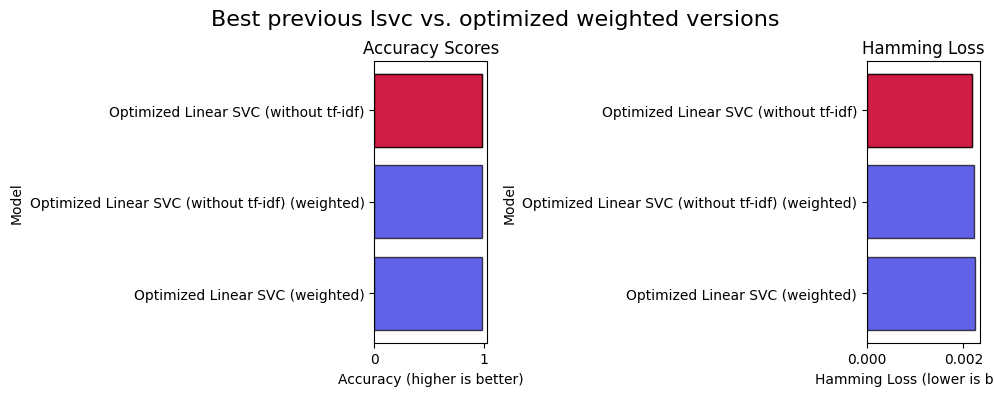

In [151]:
plot_results(create_results_dataframe(['Optimized Linear SVC (without tf-idf)', 'Optimized Linear SVC (without tf-idf) (weighted)','Optimized Linear SVC (weighted)'], [best_noftidf_LSVC_predictions, best_weighted_notfidf_LSVC_predictions,  best_weighted_LSVC_predictions]), "Best previous lsvc vs. optimized weighted versions")

The situation appears unchanged; the recall for Impact and Harmless remains stagnant at 0.12 and 0.18 for the test set. It's plausible that employing different weights for classes is insufficient to offset the imbalance. \
Another factor to consider is the possibility of an unfortunate split in the dataset, resulting in more samples in the training set. This, coupled with the increased weight, might be leading to overfitting.

<center><b><font size=6>    Section 3 - Unsupervised learning - Clustering<b><center>

In [20]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score, rand_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
!pip install wordcloud
from wordcloud import WordCloud
import re
from collections import Counter
from IPython.display import Markdown

In [22]:
columns=['session_id','full_session','first_timestamp','date']
data = dataset.rename(columns={'int_words':'Words'}).rename(columns={'words':'str_words'}).set_index('Words').drop(columns=columns)
data = data.rename(columns={'Set_Fingerprint':'Fingerprint'})
data = data[[col for col in data.columns if col != 'str_words'] + ['str_words']]
data = data[[col for col in data.columns if col != 'Fingerprint'] + ['Fingerprint']]
data

,hour,char_count,word_count,intent_counts,str_words,Fingerprint
Words,,,,,,
"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 4, 10, 11, 12, 10, 6, 7, 13, 14, 6, 7, 15, 16, 17, 18, 4, 10, 19, 20, 21, 22, 23, 24, 25, 10, 6, 7, 26, 10, 27]",9,280,40,2,"[enable, system, shell, sh, cat, /proc/mounts,...","[Defense Evasion, Discovery]"
"[0, 1, 2, 3, 4, 5, 6, 28, 8, 9, 4, 10, 11, 12, 10, 6, 28, 13, 14, 6, 28, 15, 16, 17, 18, 4, 10, 19, 20, 21, 22, 23, 24, 25, 10, 6, 28, 26, 10, 27]",9,280,40,2,"[enable, system, shell, sh, cat, /proc/mounts,...","[Defense Evasion, Discovery]"
"[0, 1, 2, 3, 4, 5, 6, 29, 8, 9, 4, 10, 11, 12, 10, 6, 29, 13, 14, 6, 29, 15, 16, 17, 18, 4, 10, 19, 20, 21, 22, 23, 24, 25, 10, 6, 29, 26, 10, 27]",9,280,40,2,"[enable, system, shell, sh, cat, /proc/mounts,...","[Defense Evasion, Discovery]"
"[0, 1, 2, 3, 4, 5, 6, 30, 8, 9, 4, 10, 11, 12, 10, 6, 30, 13, 14, 6, 30, 15, 16, 17, 18, 4, 10, 19, 20, 21, 22, 23, 24, 25, 10, 6, 30, 26, 10, 27]",10,280,40,2,"[enable, system, shell, sh, cat, /proc/mounts,...","[Defense Evasion, Discovery]"
"[0, 1, 2, 3, 4, 5, 6, 31, 8, 9, 4, 10, 11, 12, 10, 6, 31, 13, 14, 6, 31, 15, 16, 17, 18, 4, 10, 19, 20, 21, 22, 23, 24, 25, 10, 6, 31, 26, 10, 27]",10,280,40,2,"[enable, system, shell, sh, cat, /proc/mounts,...","[Defense Evasion, Discovery]"
...,...,...,...,...,...,...
"[4, 198, 891, 892, 893, 894, 23, 1371, 400811, 2210, 890, 23, 400812, 2210, 23, 897, 898, 26, 72, 898, 4, 898, 899, 900, 901, 4, 198, 891, 892, 899, 900, 901, 902, 903, 904, 905, 906, 891, 907, 902, 903, 908, 909, 910, 911, 912, 913, 378, 914, 915, 916, 918, 894, 919, 514, 906, 4, 198, 891, 920, 891, 892, 893, 894, 921, 514, 514, 515, 922, 891, 923, 23, 6779, 13869, 6711, 26, 72, 8253]",23,608,78,2,"[cat, /proc/cpuinfo, grep, name, wc, -l, echo,...","[Discovery, Persistence]"
"[4, 198, 891, 892, 893, 894, 23, 1371, 400813, 2210, 890, 23, 400814, 2210, 23, 897, 898, 26, 72, 898, 4, 898, 899, 900, 901, 4, 198, 891, 892, 899, 900, 901, 902, 903, 904, 905, 906, 891, 907, 902, 903, 908, 909, 910, 911, 912, 913, 378, 914, 915, 916, 918, 894, 919, 514, 906, 4, 198, 891, 920, 891, 892, 893, 894, 921, 514, 514, 515, 922, 891, 923, 23, 6779, 21611, 6711, 26, 72, 8253]",23,623,78,2,"[cat, /proc/cpuinfo, grep, name, wc, -l, echo,...","[Discovery, Persistence]"
"[4, 198, 891, 892, 893, 894, 23, 1371, 400815, 2210, 890, 23, 400816, 2210, 23, 897, 898, 26, 72, 898, 4, 898, 899, 900, 901, 4, 198, 891, 892, 899, 900, 901, 902, 903, 904, 905, 906, 891, 907, 902, 903, 908, 909, 910, 911, 912, 913, 378, 914, 915, 916, 918, 894, 919, 514, 906, 4, 198, 891, 920, 891, 892, 893, 894, 921, 514, 514, 515, 922, 891, 923, 23, 6779, 18325, 6711, 26, 72, 8253]",23,623,78,2,"[cat, /proc/cpuinfo, grep, name, wc, -l, echo,...","[Discovery, Persistence]"


In [23]:
# Get X and y
X = data.drop(columns=['Fingerprint','str_words']).to_numpy()
y = data[['Fingerprint']].values

# Scale Data
scaler = StandardScaler()
X_s = scaler.fit_transform(X)

## 3.1 k-Mean algorithm

### Determine the number of clusters

In [24]:
# Step 1
n_cluster_list=[]
shs_list = []
ri_list = []
ari_list = []
inertia_list=[]
for n_clusters in range(3, 16):
    kmeans = KMeans(n_clusters=n_clusters)
    cl_labels = kmeans.fit_predict(X_s)
    # Unsupervised metric
    #silhouette  = silhouette_score(X_s, cl_labels)
    n_cluster_list.append(n_clusters)
    #shs_list.append(silhouette)
    inertia_list.append(kmeans.inertia_)

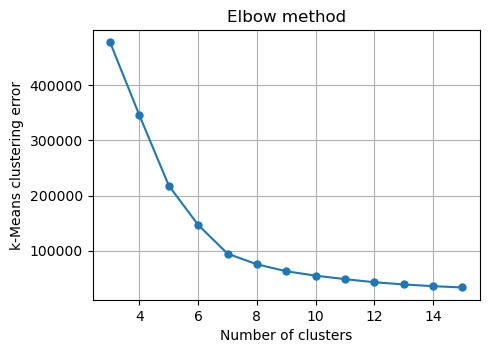

In [25]:
# Plot k-Means clustering error 
plt.figure(figsize=(5, 3.5))
plt.plot(n_cluster_list,inertia_list, marker='o', markersize=5)
plt.grid()
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('k-Means clustering error')
plt.show()

best k:  6  with corresponding silhouette:  0.5796691001521069


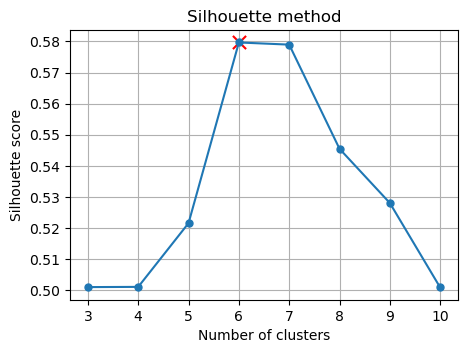

In [27]:
n_cluster_list2=[]
shs_list = []

for n_clusters in range(3, 11):
    kmeans = KMeans(n_clusters=n_clusters)
    cl_labels = kmeans.fit_predict(X_s)
    # Unsupervised metric
    n_cluster_list2.append(n_clusters)
    silhouette  = silhouette_score(X_s, cl_labels)
    shs_list.append(silhouette)

# Get n_clusters leading to the highest silhouette
best_sh= np.max(shs_list)
best_n=n_cluster_list2[np.argmax(shs_list)]
print("best k: ",best_n, " with corresponding silhouette: ", best_sh)

# Plot
plt.figure(figsize=(5, 3.5))
plt.plot(n_cluster_list2,shs_list, marker='o', markersize=5)
plt.scatter(best_n, best_sh, color='r', marker='x', s=90)
plt.grid()
plt.title('Silhouette method')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

### Tune other hyper-parameters

#### Tune the number of clusters:

In [100]:
#2D PCA
pca = PCA(n_components=2)
projection = pca.fit_transform(X)
projection = pd.DataFrame(projection)

The clustered labels of best k are:
 [4 4 4 ... 0 0 0]

The centroids are:
 [[ 8.72696487e-01 -1.96523124e-01 -1.50785600e-01 -7.92744995e-01]
 [-8.63654060e-01  1.80988200e-01  2.07882478e-01  1.16530118e+00]
 [-4.88957705e-02  2.07132657e+01  1.55513283e+00  2.66097350e+00]
 [ 8.84326798e-01  1.81749689e-01  2.11539407e-01  1.17754067e+00]
 [-8.63338807e-01 -1.95602331e-01 -1.46398946e-01 -7.92589209e-01]
 [-9.24136534e-01  8.86839734e+01  3.89355420e+02 -2.66244386e+00]]

The clustered labels of k=3 are:
 [0 0 0 ... 0 0 0]

The centroids are:
 [[-6.25211710e-03 -1.96056930e-01 -1.48564653e-01 -7.92666121e-01]
 [ 9.61059250e-03  1.81285208e-01  2.09331668e-01  1.17145708e+00]
 [-4.81331694e-02  2.08234687e+01  2.39675614e+00  2.63972233e+00]]



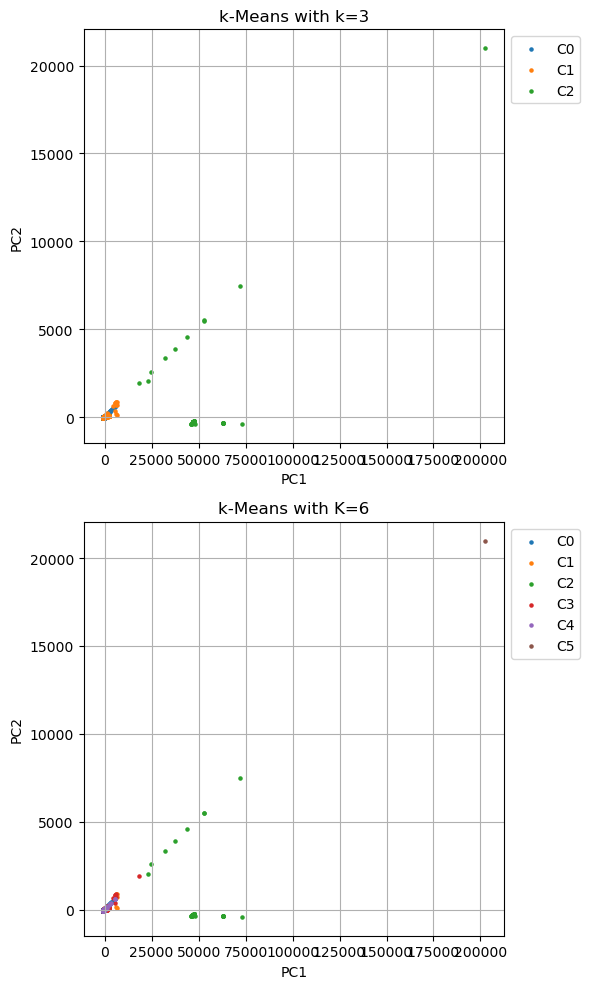

In [101]:
#set the best_n value
best_n=6

#running again k-Means with k=3 and best k to save the labels
kmeans = KMeans(n_clusters=best_n)
kmeans.fit(X_s)
cl_labels = kmeans.fit_predict(X_s)

print('The clustered labels of best k are:\n', kmeans.labels_)
print()

# print the centroid of each feature for each cluster
print('The centroids are:\n', kmeans.cluster_centers_)
print()

kmeans3 = KMeans(n_clusters=3)
kmeans3.fit(X_s)
cl_labels3 = kmeans3.fit_predict(X_s)   
    
print('The clustered labels of k=3 are:\n', kmeans3.labels_)
print()

print('The centroids are:\n', kmeans3.cluster_centers_)
print()    
    
projection['cid3'] = [f'C{x}' for x in cl_labels3]
projection['cidBest'] = [f'C{x}' for x in cl_labels]
projection['label'] = y.reshape(-1)

fig, axs = plt.subplots(2, 1, figsize=(6, 10))

for i in np.unique(projection.cid3):
    subdf = projection[projection.cid3==i]
    axs[0].scatter(subdf[0], subdf[1], label=i, s=5)
axs[0].grid()
lgnd = axs[0].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[0].set_xlabel('PC1')
axs[0].set_ylabel('PC2')
axs[0].set_title('k-Means with k=3')
    
for i in np.unique(projection.cidBest):
    subdf = projection[projection.cidBest==i]
    axs[1].scatter(subdf[0], subdf[1], label=i, s=5)
axs[1].grid()
lgnd = axs[1].legend(bbox_to_anchor=(1, 1), loc="upper left")

axs[1].set_xlabel('PC1')
axs[1].set_ylabel('PC2')
axs[1].set_title(f'k-Means with K={best_n}')

plt.tight_layout()
plt.show()

#### Tune the Initialization method

In [102]:
# Centroids initialized randomly

kmeans = KMeans(n_clusters=6, init='random', random_state=None, n_init=1)
kmeans.fit(X_s)

print('The clustered labels of centroids randomly initialized are:\n', kmeans.labels_)
print()

print('The centroids randomly initialized are:\n', kmeans.cluster_centers_)
print()

# Centroids equally distant from each other

kmeans = KMeans(n_clusters=6, init='k-means++', random_state=None, n_init=1)
kmeans.fit(X_s)

print('The clustered labels of centroids equally distant are:\n', kmeans.labels_)
print()

print('The centroids equally distant are:\n', kmeans.cluster_centers_)
print()

The clustered labels of centroids randomly initialized are:
 [2 2 2 ... 4 4 4]

The centroids randomly initialized are:
 [[-0.85494325  0.40066397  0.23210312  1.18093516]
 [ 0.71685852 -0.19709987 -0.15367137 -0.79381791]
 [-0.21656572 -0.19678757 -0.1523894  -0.7928184 ]
 [-1.21350391 -0.19513357 -0.14404493 -0.7925593 ]
 [ 1.42335603 -0.19501459 -0.1430514  -0.79102782]
 [ 0.88431593  0.1813559   0.20982091  1.17766464]]

The clustered labels of centroids equally distant are:
 [1 1 1 ... 5 5 5]

The centroids equally distant are:
 [[-7.95275512e-01  1.81062389e-01  2.07838653e-01  1.16465195e+00]
 [-7.93633652e-01 -1.95822797e-01 -1.47489203e-01 -7.93023437e-01]
 [-4.69929230e-02  2.06847131e+01  7.04372528e-01  2.70399101e+00]
 [-4.12325822e-01  3.71341153e+01  1.63340460e+02 -2.66244386e+00]
 [ 9.54142397e-01  1.81728002e-01  2.11904763e-01  1.17935322e+00]
 [ 9.44940605e-01 -1.96339774e-01 -1.49863844e-01 -7.92234467e-01]]



#### Tune the random state

In [103]:
# Kmeans with a random state value

kmeans = KMeans(n_clusters=6, init='random', random_state=38, n_init=1)
kmeans.fit(X_s)

print('The clustered labels of kmeans with a random state are:\n', kmeans.labels_)
print()

print('The centroids are:\n', kmeans.cluster_centers_)
print()

# Kmeans without a random state value

kmeans = KMeans(n_clusters=6, init='random', random_state=None, n_init=1)
kmeans.fit(X_s)

print('The clustered labels of kmeans without a random state are:\n', kmeans.labels_)
print()

print('The centroids are:\n', kmeans.cluster_centers_)
print()

The clustered labels of kmeans with a random state are:
 [0 0 0 ... 2 2 2]

The centroids are:
 [[-0.14710848 -0.1968525  -0.15251685 -0.79335251]
 [ 0.51196231  0.17007663  0.19336753  1.16266377]
 [ 1.08611569 -0.19619933 -0.14915373 -0.79207779]
 [ 1.37241052  0.80323701  0.30739542  1.2474386 ]
 [-1.21350391 -0.19513357 -0.14404493 -0.7925593 ]
 [-0.93465481  0.18222806  0.20866364  1.16489395]]

The clustered labels of kmeans without a random state are:
 [1 1 1 ... 0 0 0]

The centroids are:
 [[ 0.94493352 -0.19629306 -0.14965614 -0.7922641 ]
 [-0.79363365 -0.1958228  -0.1474892  -0.79302344]
 [ 1.08784824  0.18149963  0.21094138  1.18237243]
 [-0.15279961  0.1815176   0.20869055  1.16397578]
 [-0.04813317 20.82346865  2.39675614  2.63972233]
 [-1.21387042  0.18066137  0.2074747   1.16554392]]



#### Tune the n_init

In [104]:
# Number of initialization = 1

kmeans = KMeans(n_clusters=6, init='random', random_state=38, n_init=1)
kmeans.fit(X_s)

print('The clustered labels of kmeans with a n_init = 1 are:\n', kmeans.labels_)
print()

print('The centroids are:\n', kmeans.cluster_centers_)
print()

# Number of initialization = 5

kmeans = KMeans(n_clusters=6, init='random', random_state=None, n_init=5)
kmeans.fit(X_s)

print('The clustered labels of kmeans without a n_init = 5 are:\n', kmeans.labels_)
print()

print('The centroids are:\n', kmeans.cluster_centers_)
print()

The clustered labels of kmeans with a n_init = 1 are:
 [0 0 0 ... 2 2 2]

The centroids are:
 [[-0.14710848 -0.1968525  -0.15251685 -0.79335251]
 [ 0.51196231  0.17007663  0.19336753  1.16266377]
 [ 1.08611569 -0.19619933 -0.14915373 -0.79207779]
 [ 1.37241052  0.80323701  0.30739542  1.2474386 ]
 [-1.21350391 -0.19513357 -0.14404493 -0.7925593 ]
 [-0.93465481  0.18222806  0.20866364  1.16489395]]

The clustered labels of kmeans without a n_init = 5 are:
 [2 2 2 ... 3 3 3]

The centroids are:
 [[ 0.71685852 -0.19709987 -0.15367137 -0.79381791]
 [ 0.88431593  0.1813559   0.20982091  1.17766464]
 [-0.21656572 -0.19678757 -0.1523894  -0.7928184 ]
 [ 1.42335603 -0.19501459 -0.1430514  -0.79102782]
 [-0.85494325  0.40066397  0.23210312  1.18093516]
 [-1.21350391 -0.19513357 -0.14404493 -0.7925593 ]]



### t-SNE Visualization

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


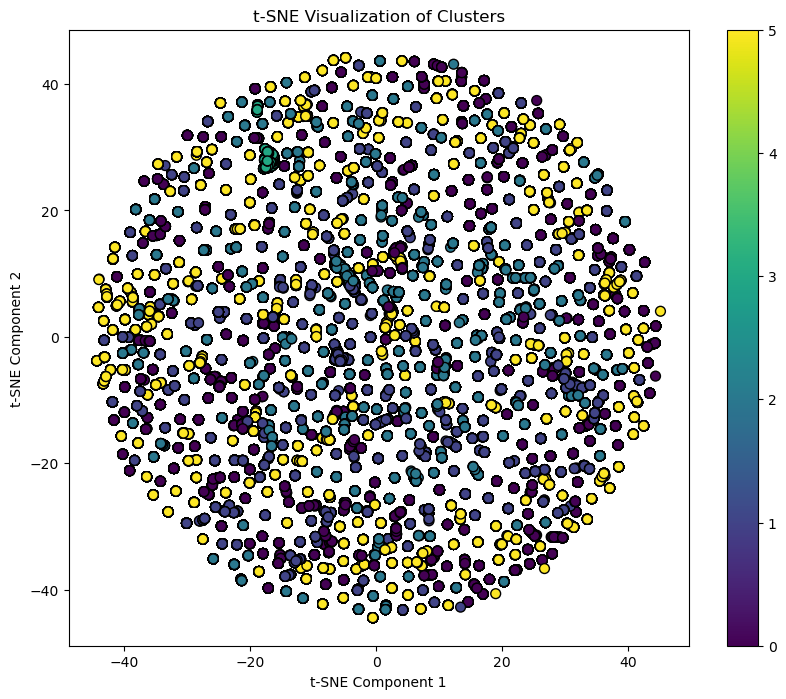

In [29]:
cl_labels = []

kmeans = KMeans(n_clusters=6)
kmeans.fit(X_s)
cl_labels = kmeans.labels_

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_s)

# Create the graph
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cl_labels, cmap='viridis', edgecolors='k', s=50)
plt.title('t-SNE Visualization of Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar()
plt.show()

### Cluster analysis

In [48]:
labels = kmeans.labels_
data['cluster_label'] = labels

In [49]:
cluster_stats = data.groupby('cluster_label').agg({
    'hour':'mean',
    'char_count': 'mean',
    'word_count': 'mean',
    'intent_counts': 'mean',
})

  Using cached wordcloud-1.9.3-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (489 kB)


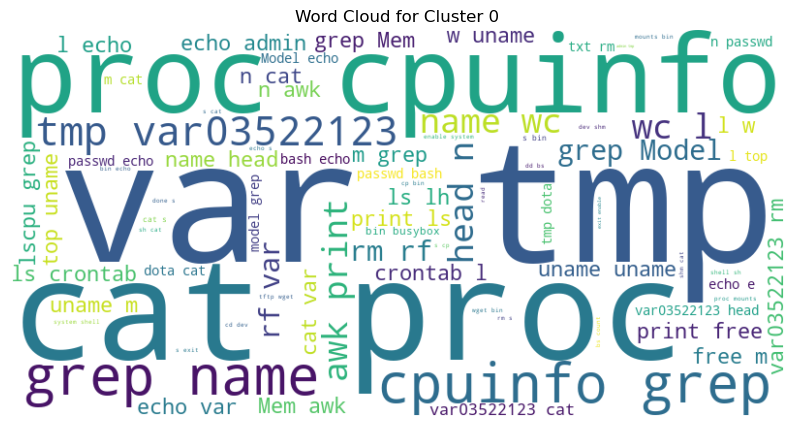

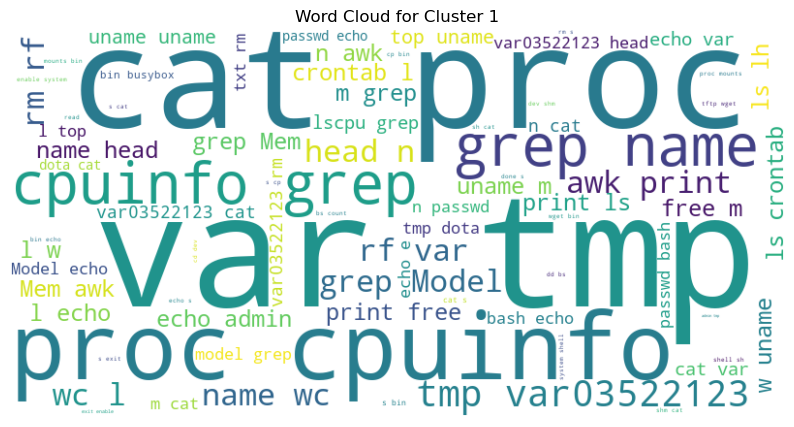

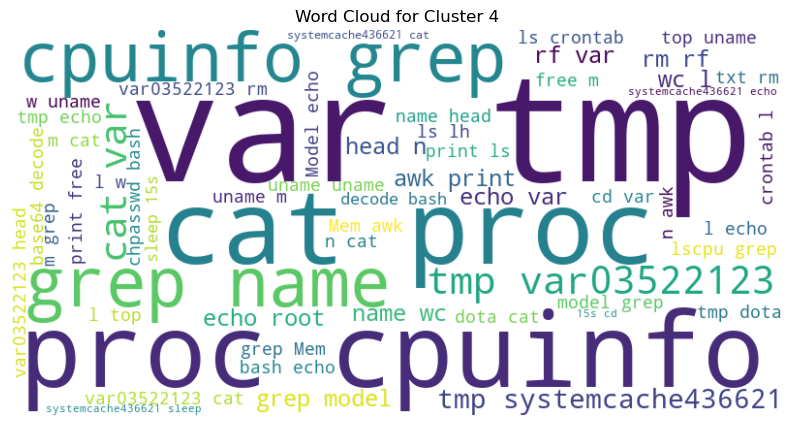

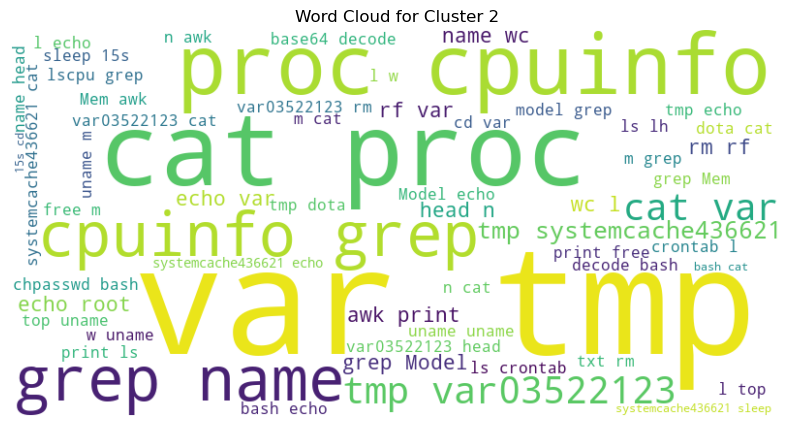

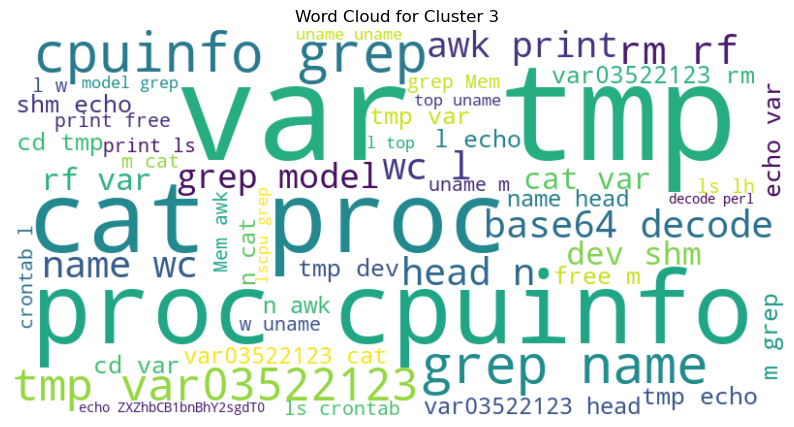

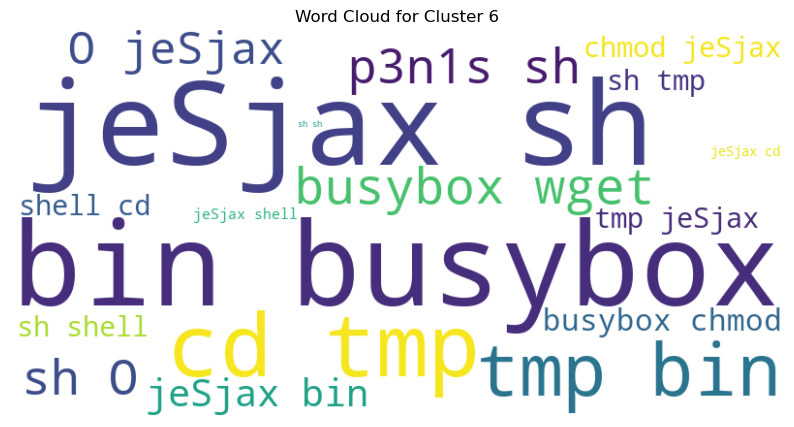

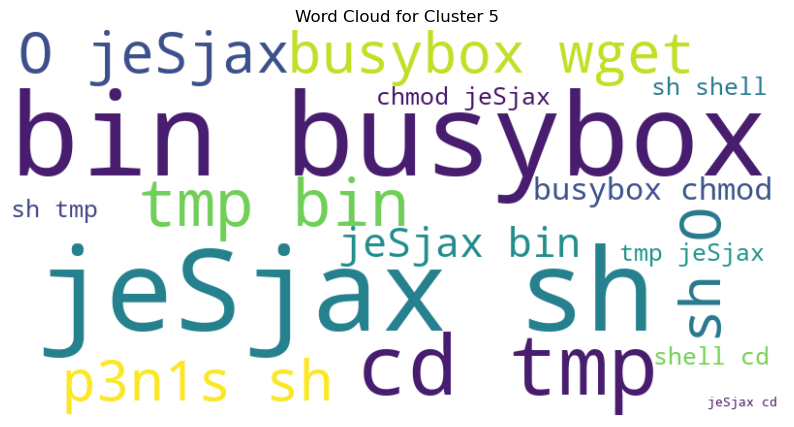

In [50]:
for cluster_label in data['cluster_label'].unique():
    # Filter the dataset
    cluster_data = data[data['cluster_label'] == cluster_label]

    # Convert to string
    words_in_cluster = ' '.join(' '.join(map(str, words)) for words in cluster_data['str_words'])

    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words_in_cluster)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Cluster {cluster_label}')
    plt.show()

### Find clusters of similar attacks

In [25]:
kmeans = KMeans(n_clusters=6)
dataset['cluster'] = kmeans.fit_predict(X_s)

# Define the regex patterns
regex_patterns = {
    'Bin Download+Run': r'(?:\b(shell|wget|chmod)\b\s?)+;',
    'IoT Busybox': r'(?:\b(shell|cat|busybox)\b\s?)+;',
    'Passwd change': r'(?:\b(echo|bchpasswd)\b\s?)+;',
    'DOTA tgz': r'(?:\b(echo|passwd|cat|\/proc\/cpuinfo|dota)\b\s?)+;',
    'DOTA perl': r'\bperl\b',
}

# Select the desired clusters
selected_clusters = [1, 3, 5]

# Find the regex with the max number of occurrences
for cluster_label in selected_clusters:
    cluster_data = dataset[dataset['cluster'] == cluster_label]['full_session']
    all_sessions = " ".join(cluster_data)
    
    regex_counts = {regex_label: 0 for regex_label in regex_patterns}
    
    for regex_label, regex_pattern in regex_patterns.items():
        regex_counts[regex_label] = len(re.findall(regex_pattern, all_sessions))
    
    most_common_regex = max(regex_counts, key=regex_counts.get)
    
    display(Markdown(f"**Cluster {cluster_label}:**"))
    print(f"Most common regex: {most_common_regex} with {regex_counts[most_common_regex]} occurrecies")

**Cluster 1:**

Most common regex: DOTA tgz with 57512 occurrecies


**Cluster 3:**

Most common regex: DOTA tgz with 59193 occurrecies


**Cluster 5:**

Most common regex: Bin Download+Run with 1495 occurrecies


## 3.2 Gaussian Mixture Method algorithm

### Determine the number of clusters

best k:  5  with corresponding silhouette:  0.5056172595992869


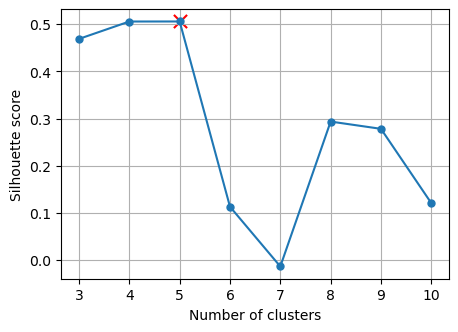

In [28]:
#1. Try k in the [3, 11] range. For each iteration, compute the different scores.

n_cluster_list=[]
shs_list = []
log_l_list=[]
for n_clusters in range(3, 11):
    gmm = GaussianMixture(n_components=n_clusters)
    cl_labels = gmm.fit_predict(X_s)
    silhouette  = silhouette_score(X_s, cl_labels)
    n_cluster_list.append(n_clusters)
    shs_list.append(silhouette)
    log_l_list.append(gmm.score(X_s))
    

#2. Plot the silhouette score for the different values of n_cluster. What is the best value of k, leading to the highest Silhouette.

# Get n_clusters leading to the highest silhouette
best_sh= np.max(shs_list)
best_n=n_cluster_list[np.argmax(shs_list)]
print("best k: ",best_n, " with corresponding silhouette: ", best_sh)

# Plot
plt.figure(figsize=(5, 3.5))
plt.plot(n_cluster_list,shs_list, marker='o', markersize=5)
plt.scatter(best_n, best_sh, color='r', marker='x', s=90)
plt.grid()
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()


### Tune other hyper-parameters

#### Tune the n components

In [107]:
# GMM with n_components = 3

gmm = GaussianMixture(n_components=3, init_params='kmeans')
gmm.fit(X_s)

# print the sample mean vector of each gaussian
print('The centroids of n_components = 3 are:\n', gmm.means_)
print()

# print the sample covariance matrix of each gaussian
print('The covariance matrices of n_components = 3 are:\n', gmm.covariances_)
print()

# print the effective size of each cluster
print('The effective sizes with n_components = 3 are:\n', gmm.weights_)
print()

# print the degree of belonging to each cluster
gmm_probs = gmm.predict_proba(X_s)
with np.printoptions(precision=4, suppress=True): #to print only the first 4 digits
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
print()
      
# print the clustered labels
gmm_labels = gmm.predict(X_s)
print('The clustered labels are:\n', gmm_labels)
print()


The centroids of n_components = 3 are:
 [[-5.93114038e-03 -1.96186911e-01 -1.48164573e-01 -7.92339248e-01]
 [ 8.78758817e-03  2.89401799e-01  2.15131705e-01  1.17264577e+00]
 [-9.24136534e-01  8.86839734e+01  3.89355420e+02 -2.66244386e+00]]

The covariance matrices of n_components = 3 are:
 [[[ 9.97308116e-01 -3.32545502e-04 -1.64024398e-03  3.20005448e-04]
  [-3.32545502e-04  2.83311301e-03  1.27956316e-02  3.39713942e-03]
  [-1.64024398e-03  1.27956316e-02  5.84343350e-02  1.44800499e-02]
  [ 3.20005448e-04  3.39713942e-03  1.44800499e-02  7.40385133e-02]]

 [[ 1.00385859e+00 -5.20279717e-03  2.94623714e-03  9.45236615e-03]
  [-5.20279717e-03  2.25135096e+00  1.71211366e-01  1.67436098e-01]
  [ 2.94623714e-03  1.71211366e-01  7.01407382e-01 -1.27020951e-02]
  [ 9.45236615e-03  1.67436098e-01 -1.27020951e-02  6.60995847e-02]]

 [[ 1.00000000e-06 -3.97585896e-28 -1.70393956e-27  1.15370907e-29]
  [-3.97585896e-28  1.00000000e-06  1.69636649e-25 -1.14858148e-27]
  [-1.70393956e-27  1.6

In [108]:
# GMM with n_components = best k

gmm = GaussianMixture(n_components=5, init_params='kmeans')
gmm.fit(X_s)

print('The centroids of n_components = best k are:\n', gmm.means_)
print()

print('The covariance matrices of n_components = best k are:\n', gmm.covariances_)
print()

print('The effective sizes with n_components = best k are:\n', gmm.weights_)
print()

gmm_probs = gmm.predict_proba(X_s)
with np.printoptions(precision=4, suppress=True): 
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
print()
      
gmm_labels = gmm.predict(X_s)
print('The clustered labels are:\n', gmm_labels)
print()

The centroids of n_components = best k are:
 [[ 4.79760900e-03  1.79382959e-01  2.01659128e-01  1.15694544e+00]
 [-8.64861744e-01 -1.91681681e-01 -1.28551879e-01 -7.52749210e-01]
 [ 8.06922910e-01 -1.96281445e-01 -1.48206597e-01 -7.52749210e-01]
 [-9.24136534e-01  8.86839734e+01  3.89355420e+02 -2.66244386e+00]
 [ 6.34932812e-02  1.83357288e+00 -1.33159783e-02 -7.43754935e-01]]

The covariance matrices of n_components = best k are:
 [[[ 1.00311290e+00 -1.51604095e-03 -1.83593451e-03  4.29953720e-30]
  [-1.51604095e-03  6.40498088e-03  6.04119020e-03  1.18292981e-29]
  [-1.83593451e-03  6.04119020e-03  6.08874804e-03  1.42880676e-29]
  [ 4.23047136e-30  1.18298436e-29  1.42887462e-29  1.00000000e-06]]

 [[ 2.73915983e-01  1.00086058e-03  4.30858906e-03  6.61154594e-28]
  [ 1.00086058e-03  2.28415617e-03  1.01618009e-02  1.47421297e-28]
  [ 4.30858906e-03  1.01618009e-02  4.54599097e-02  9.52260939e-29]
  [ 6.61182115e-28  1.47360902e-28  9.48010379e-29  1.00000000e-06]]

 [[ 3.24168058e

#### Tune the init_params

In [109]:
# GMM with init_params = kmeans

gmm = GaussianMixture(n_components=5, init_params='kmeans')
gmm.fit(X_s)

print('The centroids are:\n', gmm.means_)
print()

print('The covariance matrices are:\n', gmm.covariances_)
print()

print('The effective sizes with n_components = best k are:\n', gmm.weights_)
print()

gmm_probs = gmm.predict_proba(X_s)
with np.printoptions(precision=4, suppress=True):
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
print()
      
gmm_labels = gmm.predict(X_s)
print('The clustered labels are:\n', gmm_labels)
print()

The centroids are:
 [[ 0.00578675 -0.30863199 -0.64714012 -0.75274921]
 [ 0.00545083  0.1901315   0.21055092  1.15694544]
 [-0.01281301 -0.18639184 -0.09697663 -2.66244386]
 [-0.00781211 -0.17387022 -0.04930268 -0.75274921]
 [ 0.0584228   1.75562282  0.12240311  1.3853137 ]]

The covariance matrices are:
 [[[ 9.62622967e-01 -2.72014253e-04 -1.19911166e-03 -7.36531510e-29]
  [-2.72014253e-04  1.41849393e-03  6.88208783e-03  4.02896460e-27]
  [-1.19911166e-03  6.88208783e-03  3.40416544e-02  8.41015070e-27]
  [-7.43839684e-29  4.02849600e-27  8.40763944e-27  1.00000000e-06]]

 [[ 1.00197945e+00 -1.81003861e-03 -2.08774980e-03  5.99454727e-30]
  [-1.81003861e-03  2.94597074e-03  3.40200432e-03  4.56060160e-29]
  [-2.08774980e-03  3.40200432e-03  3.93350674e-03  4.43464659e-29]
  [ 6.19585652e-30  4.55865624e-29  4.43830675e-29  1.00000000e-06]]

 [[ 9.70392261e-01 -3.34473674e-02 -1.53166607e-01 -2.95905919e-32]
  [-3.34473674e-02  3.81969772e+00  1.67385344e+01 -3.50628247e-32]
  [-1.531

In [110]:
# GMM with init_params = random

gmm = GaussianMixture(n_components=5, init_params='random')
gmm.fit(X_s)

print('The centroids are:\n', gmm.means_)
print()

print('The covariance matrices are:\n', gmm.covariances_)
print()

print('The effective sizes with n_components = best k are:\n', gmm.weights_)
print()

gmm_probs = gmm.predict_proba(X_s)
with np.printoptions(precision=4, suppress=True): #to print only the first 4 digits
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
print()
      
gmm_labels = gmm.predict(X_s)
print('The clustered labels are:\n', gmm_labels)
print()

The centroids are:
 [[-0.00781173 -0.17387026 -0.04930268 -0.75274921]
 [-0.06368342  0.48181338  0.76555868  1.24416101]
 [ 0.01398753  0.17625642  0.19451065  1.15694544]
 [ 0.00383046 -0.32150681 -0.71108173 -0.75274921]
 [ 0.00469405  0.72269211 -0.22225528 -0.27453576]]

The covariance matrices are:
 [[[ 1.00406220e+00  5.74740123e-06  2.29628725e-28  3.49359204e-27]
  [ 5.74740123e-06  1.11203405e-05  5.38101044e-27  8.21522166e-26]
  [ 2.31517924e-28  5.38101015e-27  1.00000000e-06  2.33163618e-26]
  [ 3.52695391e-27  8.21522164e-26  2.33163618e-26  1.00000000e-06]]

 [[ 1.00858746e+00  2.11687602e-02  1.64568763e-02  1.23092213e-01]
  [ 2.11687602e-02  1.85285953e+00  8.17638724e+00 -1.04418711e-01]
  [ 1.64568763e-02  8.17638724e+00  3.62218773e+01 -6.50661757e-01]
  [ 1.23092213e-01 -1.04418711e-01 -6.50661757e-01  3.17852684e-01]]

 [[ 1.00240737e+00 -4.42500348e-06  6.35895004e-30  2.55565108e-29]
  [-4.42500348e-06  2.84026839e-06  7.18627609e-29  4.16671635e-28]
  [ 5.917

### t-SNE Visualization

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


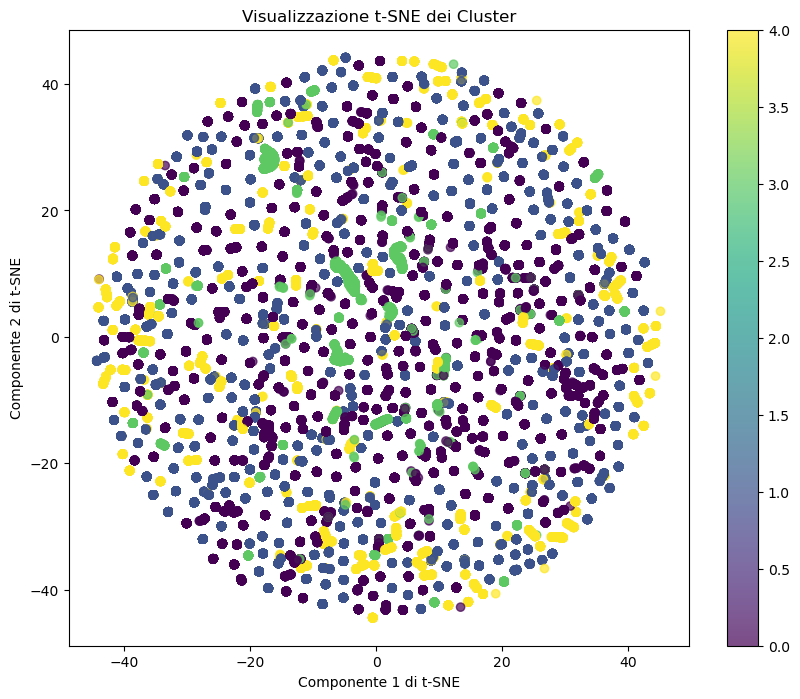

In [28]:
cluster_labels = []

gmm = GaussianMixture(n_components=5, init_params='kmeans')
gmm.fit(X_s)
cluster_labels = gmm.predict(X_s)

# Riduci la dimensionalità con t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_s)

# Visualizza la visualizzazione t-SNE colorata per cluster
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.title('Visualizzazione t-SNE dei Cluster')
plt.xlabel('Componente 1 di t-SNE')
plt.ylabel('Componente 2 di t-SNE')
plt.colorbar()
plt.show()

### Cluster analysis

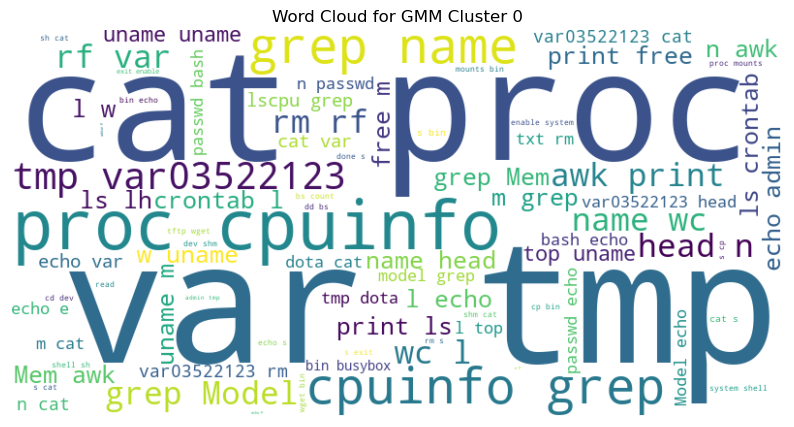

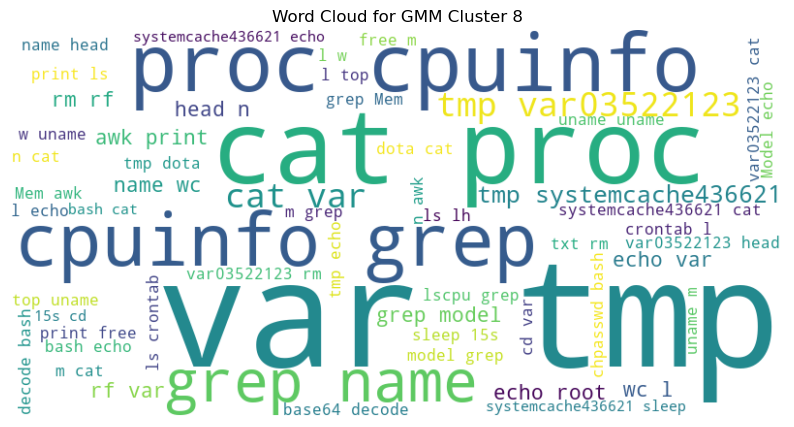

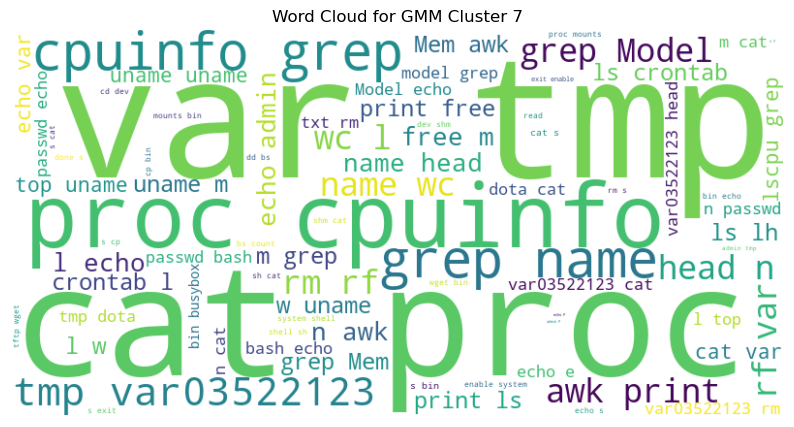

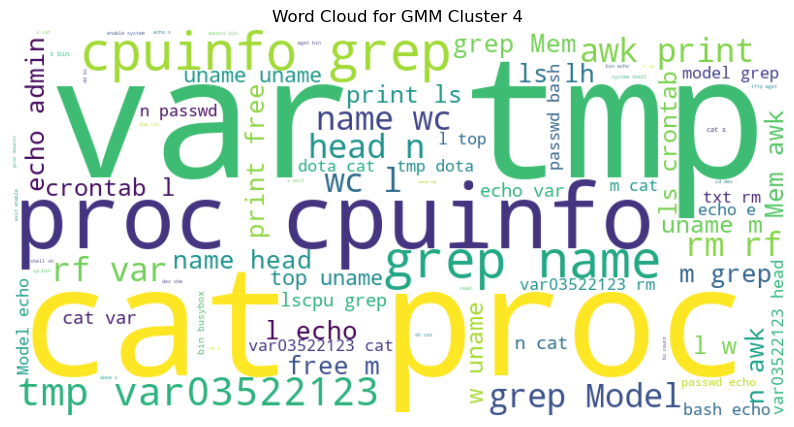

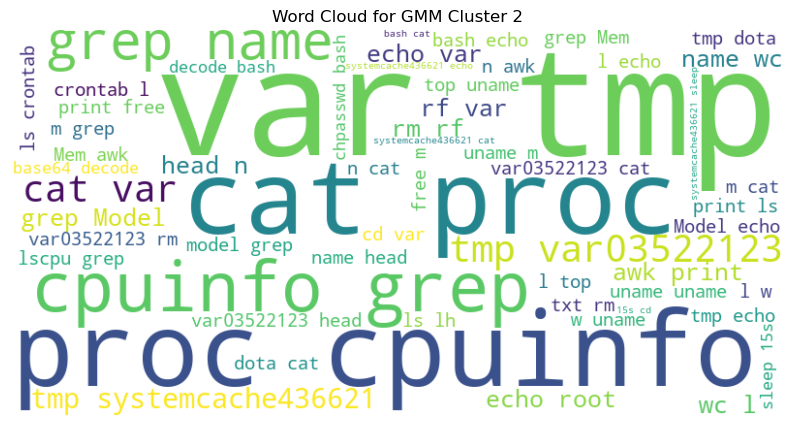

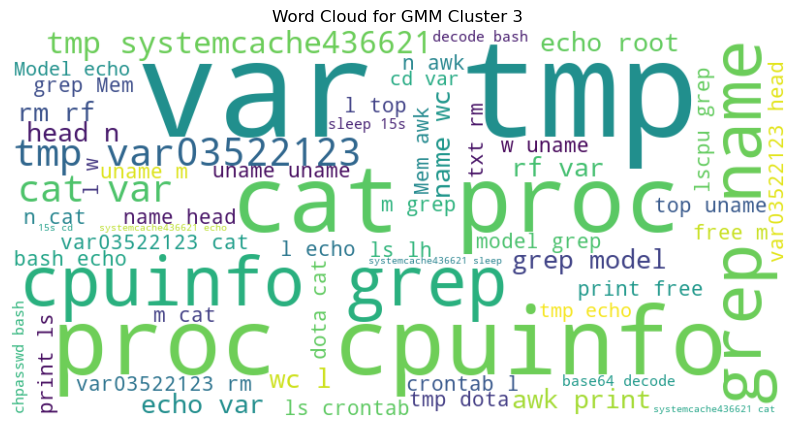

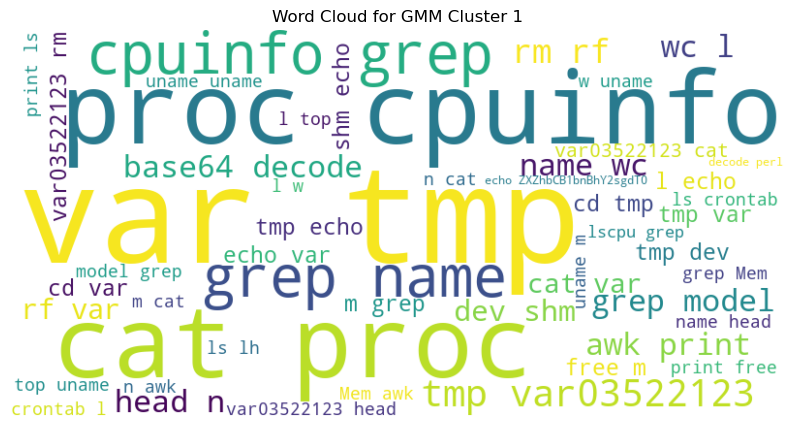

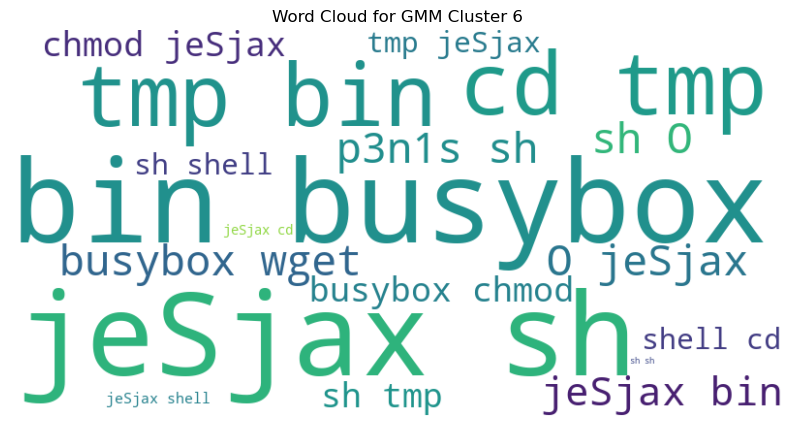

In [44]:
# Words' column
data['words_str'] = data['words'].apply(lambda x: ' '.join(map(str, x)))

# Iterate on each cluster
for cluster_label in data['cluster_label'].unique():
    
    # Filter the dataset
    cluster_data = data[data['cluster_label'] == cluster_label].copy()

    # Check that the number of cluster is at least 2
    if len(cluster_data) < 2:
        continue  # skip

    # GMM
    gmm = GaussianMixture(n_components=1, random_state=42)  # Imposta il numero di componenti
    gmm.fit(cluster_data[['char_count', 'word_count', 'intent_counts']])

    # Predict the lables
    cluster_data.loc[:, 'gmm_cluster'] = gmm.predict(cluster_data[['char_count', 'word_count', 'intent_counts']])

    # Select the most probable cluster
    most_probable_cluster = cluster_data['gmm_cluster'].value_counts().idxmax()

    # Select the words in the most probable cluster
    words_in_cluster = cluster_data[cluster_data['gmm_cluster'] == most_probable_cluster]['words_str'].str.cat(sep=' ')

    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words_in_cluster)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for GMM Cluster {cluster_label}')
    plt.show()


### Find clusters of similar attacks

In [26]:
gmm = GaussianMixture(n_components=6)
dataset['cluster'] = gmm.fit_predict(X_s)

# Define the regex patterns
regex_patterns = {
    'Bin Download+Run': r'(?:\b(shell|wget|chmod)\b\s?)+;',
    'IoT Busybox': r'(?:\b(shell|cat|busybox)\b\s?)+;',
    'Passwd change': r'(?:\b(echo|bchpasswd)\b\s?)+;',
    'DOTA tgz': r'(?:\b(echo|passwd|cat|\/proc\/cpuinfo|dota)\b\s?)+;',
    'DOTA perl': r'\bperl\b',
}

# Select the desired clusters
selected_clusters = [1, 2, 4]

# Find the regex with the max number of occurrences
for cluster_label in selected_clusters:
    cluster_data = dataset[dataset['cluster'] == cluster_label]['full_session']
    all_sessions = " ".join(cluster_data)
    
    regex_counts = {regex_label: 0 for regex_label in regex_patterns}
    
    for regex_label, regex_pattern in regex_patterns.items():
        regex_counts[regex_label] = len(re.findall(regex_pattern, all_sessions))
    
    most_common_regex = max(regex_counts, key=regex_counts.get)
    
    display(Markdown(f"**Cluster {cluster_label}:**"))
    print(f"Most common regex: {most_common_regex} with {regex_counts[most_common_regex]} occurrecies")

**Cluster 1:**

Most common regex: Bin Download+Run with 34956 occurrecies


**Cluster 2:**

Most common regex: DOTA perl with 2 occurrecies


**Cluster 4:**

Most common regex: Bin Download+Run with 1495 occurrecies


##  Section 4 - Language Models exploration
### 1. We use Bert, Bidirectional Encoder Representations from Transformers that is a language model based on the transformer architecture.


Before start is better to enable pytorch to use our gpu instead of the cpu, if possible for your time. Visit https://pytorch.org/get-started/locally/ to configure.

In [20]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():

    # Tell PyTorch to use the GPU.
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")




There are 1 GPU(s) available.
We will use the GPU: NVIDIA GeForce RTX 3060 Ti


We have to create a special label to have the multilabel as int and not as text, then we split test and training/validation set in half due to computing time required for training.

In [21]:
dt = dataset.loc[:, ['full_session']]
dt.columns = ['text']
dt['text'] = dt['text'].apply(lambda x: x.replace(' ; ', ' ').replace('\n', ' '))
ll = dataset['Set_Fingerprint'].explode().unique()
print(ll)
dt['labels'] = dataset['Set_Fingerprint'].apply(lambda x: [1 if intent in x else 0 for intent in ll])


indices = []
# Combine the training inputs into a TensorDataset.
for l in range(len(ll)):
	indices.append([i for i, labels in enumerate(dt['labels'].tolist()) if labels[l] == 1])

for i, idx in enumerate(indices):
	print(f'{ll[i]}: {len(idx)}')

test_dataset = dt.sample(frac=0.5, random_state=15)
val_dataset = dt.drop(test_dataset.index).reset_index(drop=True)

print(f'Number of total samples: {len(dt)}')
print(f'Number of training samples: {len(test_dataset)}')
print(f'Number of test samples: {len(val_dataset)}')
#newdt = dt.sample(n=1000, random_state=15)
sentences = val_dataset.text.values
labels = val_dataset.labels.values.tolist()

from transformers import BertTokenizer

# Load the BERT tokenizer.
print('Loading BERT tokenizer...')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)


['Defense Evasion' 'Discovery' 'Execution' 'Harmless' 'Persistence'
 'Other' 'Impact']
Defense Evasion: 18999
Discovery: 232145
Execution: 92927
Harmless: 2206
Persistence: 211295
Other: 327
Impact: 27
Number of total samples: 233035
Number of training samples: 116518
Number of test samples: 116517
Loading BERT tokenizer...


Quick check for the split to be balanced

In [22]:
indices = []
# Combine the training inputs into a TensorDataset.
for l in range(len(ll)):
	indices.append([i for i, labels in enumerate(test_dataset['labels'].tolist()) if labels[l] == 1])

for i, idx in enumerate(indices):
	print(f'{ll[i]}: {len(idx)}')

Defense Evasion: 9544
Discovery: 116042
Execution: 46404
Harmless: 1126
Persistence: 105595
Other: 171
Impact: 16


In [23]:
indices = []
# Combine the training inputs into a TensorDataset.
for l in range(len(ll)):
	indices.append([i for i, labels in enumerate(val_dataset['labels'].tolist()) if labels[l] == 1])

for i, idx in enumerate(indices):
	print(f'{ll[i]}: {len(idx)}')

Defense Evasion: 9455
Discovery: 116103
Execution: 46523
Harmless: 1080
Persistence: 105700
Other: 156
Impact: 11


For the input BERT needs to encode and tokenize the sentences, transforming word into int and then use Tensor

In [24]:
# Tokenize all of the sentences and map the tokens to thier word IDs.
import time, datetime
input_ids = []
attention_masks = []
total_t0 = time.time()
t0 = time.time()

#Only for stamp
def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))

    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))



# For every sentence...
for number, sent in enumerate(sentences):
    # `encode_plus` will:
    #   (1) Tokenize the sentence.
    #   (2) Prepend the `[CLS]` token to the start.
    #   (3) Append the `[SEP]` token to the end.
    #   (4) Map tokens to their IDs.
    #   (5) Pad or truncate the sentence to `max_length`
    #   (6) Create attention masks for [PAD] tokens.
    if number % 5000 == 0 and not number == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)

            # Report progress.
            print('  Sentences {:>6,}  of  {:>6,}.    Elapsed: {:}.'.format(number, len(sentences), elapsed))
    encoded_dict = tokenizer.encode_plus(
                        sent,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'           # Pad & truncate all sentences.
                        max_length = 90,
                        padding='max_length',
                        truncation=True,
                        return_attention_mask = True,   # Construct attn. masks.
                        return_tensors = 'pt',     # Return pytorch tensors.
                   )


    # Add the encoded sentence to the list.
    input_ids.append(encoded_dict['input_ids'])

    # And its attention mask (simply differentiates padding from non-padding).
    attention_masks.append(encoded_dict['attention_mask'])

# Convert the lists into tensors.
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(labels)

# Print sentence 0, now as a list of IDs.
print('Original: ', sentences[0])
print('Token IDs:', input_ids[0])

  Sentences  5,000  of  116,517.    Elapsed: 0:00:19.
  Sentences 10,000  of  116,517.    Elapsed: 0:00:45.
  Sentences 15,000  of  116,517.    Elapsed: 0:01:14.
  Sentences 20,000  of  116,517.    Elapsed: 0:01:36.
  Sentences 25,000  of  116,517.    Elapsed: 0:01:59.
  Sentences 30,000  of  116,517.    Elapsed: 0:02:24.
  Sentences 35,000  of  116,517.    Elapsed: 0:02:46.
  Sentences 40,000  of  116,517.    Elapsed: 0:03:08.
  Sentences 45,000  of  116,517.    Elapsed: 0:03:29.
  Sentences 50,000  of  116,517.    Elapsed: 0:03:48.
  Sentences 55,000  of  116,517.    Elapsed: 0:04:09.
  Sentences 60,000  of  116,517.    Elapsed: 0:04:28.
  Sentences 65,000  of  116,517.    Elapsed: 0:04:46.
  Sentences 70,000  of  116,517.    Elapsed: 0:05:07.
  Sentences 75,000  of  116,517.    Elapsed: 0:05:33.
  Sentences 80,000  of  116,517.    Elapsed: 0:05:47.
  Sentences 85,000  of  116,517.    Elapsed: 0:06:00.
  Sentences 90,000  of  116,517.    Elapsed: 0:06:12.
  Sentences 95,000  of  116,

It is time to split our data into Training and Validation

In [25]:
from torch.utils.data import TensorDataset, random_split

# Combine the training inputs into a TensorDataset.
dataset = TensorDataset(input_ids, attention_masks, labels)

# Create a 70-30 train-validation split.

# Calculate the number of samples to include in each set.
train_size = int(0.7 * len(dataset))
val_size = len(dataset) - train_size

# Divide the dataset by randomly selecting samples.
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


print('{:>5,} training samples'.format(train_size))
print('{:>5,} validation samples'.format(val_size))

81,561 training samples
34,956 validation samples


Create the dataLoader with, eventually, the sampler

In [26]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler

# The DataLoader needs to know our batch size for training, so we specify it
# here. For fine-tuning BERT on a specific task, the authors recommend a batch
# size of 16 or 32.
batch_size = 32

# Create the DataLoaders for our training and validation sets.
# We'll take training samples in random order.
train_dataloader = DataLoader(
            train_dataset,  # The training samples.
            #Uncomment to use random sampler => Faster but less accurate
            #sampler = RandomSampler(train_dataset), # Select batches randomly
            batch_size = batch_size, # Trains with this batch size.
            num_workers=0
        )

# For validation the order doesn't matter, so we'll just read them sequentially.
validation_dataloader = DataLoader(
            val_dataset, # The validation samples.
            #Uncomment to use random sampler => Faster but less accurate
            #sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
            batch_size = batch_size, # Evaluate with this batch size.
            num_workers=0
        )
print(len(train_dataloader))
print(len(validation_dataloader))

2549
1093


Now we create the model to train from pretrained with some starting weights and then we load it into the device. Since weights of "bert-base-uncased" were not initialized we need to train it on a down-stream task to be able to use it for predictions and inference.

In [27]:
from transformers import BertForSequenceClassification

# Load BertForSequenceClassification, the pretrained BERT model with a single
# linear classification layer on top.
model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
    num_labels = 7, # The number of output labels.
    problem_type="multi_label_classification", # enables multi label classification using BCEWithLogitsLoss
    output_attentions = False, # Whether the model returns attentions weights.
    output_hidden_states = False, # Whether the model returns all hidden-states.
)

# Tell pytorch to run this model on the GPU or CPU.
model.to(device)
#model.cuda()


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

We decide the optimizer, scheduler and number of epochs

In [28]:
import random
from transformers import get_linear_schedule_with_warmup

# Torch optimizer
optimizer = torch.optim.AdamW(model.parameters(),
                  lr = 5e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                  eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                )

# Number of training epochs. The BERT authors recommend between 2 and 4.
# We chose to run for 4, but we'll see later that this may be over-fitting the
# training data.
epochs = 4

# Total number of training steps is [number of batches] x [number of epochs].
# (Note that this is not the same as the number of training samples).
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer,
                                          num_warmup_steps = 0, # Default value in run_glue.py
                                          num_training_steps = total_steps)

In [31]:
import time
import datetime
import numpy as np
import shutil
import torch.nn as nn

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))

    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))
def save_ckp(state, is_best, checkpoint_path, best_model_path,epoch_i):
    """
    state: checkpoint we want to save
    is_best: is this the best checkpoint; min validation loss
    checkpoint_path: path to save checkpoint
    best_model_path: path to save best model
    """
    f_path = str(checkpoint_path)+str(epoch_i)+'.pt'
    # save checkpoint data to the path given, checkpoint_path
    torch.save(state, f_path)
    # if it is a best model, min validation loss
    if is_best:
        best_fpath = str(best_model_path)+'.pt'
        # copy that checkpoint file to best path given, best_model_path
        shutil.copyfile(f_path, best_fpath)
#loss function
def loss_fn(outputs, targets):
    return nn.BCEWithLogitsLoss()(outputs, targets)
#obtaain class weigths
def get_class_weigths(df):
	class_weigths = list()
	labels = ll
	total_count = df.shape[0]# doesnt matter which column we count
 
	for i, label in enumerate(labels):
		# count instances of current label in the dataset
		label_count = df['labels'].apply(lambda x: x[i] == 1).sum()
		#print(label_count)
		rev_freq = 1 - (label_count / total_count)
 
		class_weigths.append(rev_freq)
	return class_weigths

This is the loop for training and validation, every epochs the state of the model is saved and if the validation loss is the lowest is saved into the "bestmodel" path to use it later

In [30]:
from sklearn.metrics import accuracy_score

# Set the seed value all over the place to make this reproducible.
seed_val = 42
label_ids=[]
resultLogits=[]
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

valid_loss_min = np.Inf # track change in validation loss

# We'll store a number of quantities such as training and validation loss,
# validation accuracy, and timings.
training_stats = []

# Measure the total training time for the whole run.
total_t0 = time.time()

# For each epoch...
for epoch_i in range(0, epochs):

    # ========================================
    #               Training
    # ========================================

    # Perform one full pass over the training set.

    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    print('Training...')

    # Measure how long the training epoch takes.
    t0 = time.time()

    # Reset the total loss for this epoch.
    total_train_loss = 0

    # Put the model into training mode. Don't be mislead--the call to
    # `train` just changes the *mode*, it doesn't *perform* the training.
    # `dropout` and `batchnorm` layers behave differently during training
    # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
    model.train()

    # For each batch of training data...
    for step, batch in enumerate(train_dataloader):

        # Progress update every 100 batches.
        if step % 100 == 0 and not step == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)

            # Report progress.
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

        # Unpack this training batch from our dataloader.
        #
        # As we unpack the batch, we'll also copy each tensor to the GPU using the
        # `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids
        #   [1]: attention masks
        #   [2]: labels
        b_input_ids = batch[0].to(device, dtype = torch.long)
        b_input_mask = batch[1].to(device, dtype = torch.long)
        b_labels = batch[2].to(device, dtype = torch.float)
       


        # Always clear any previously calculated gradients before performing a
        # backward pass. PyTorch doesn't do this automatically because
        # accumulating the gradients is "convenient while training RNNs".
        # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
        model.zero_grad()

        # Perform a forward pass (evaluate the model on this training batch).
        # The documentation for this `model` function is here:
        # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
        # It returns different numbers of parameters depending on what arguments
        # arge given and what flags are set. For our useage here, it returns
        # the loss (because we provided labels) and the "logits"--the model
        # outputs prior to activation.
        output = model(b_input_ids,
                            token_type_ids=None,
                            attention_mask=b_input_mask,
                            labels=b_labels.float())
        logits= torch.sigmoid(output.logits)
        #we are using BCEWithLogitsLoss so we need to apply sigmoid to the output
        loss = output.loss

        optimizer.zero_grad()

        # Perform a backward pass to calculate the gradients.
        loss.backward()

        # Clip the norm of the gradients to 1.0.
        # This is to help prevent the "exploding gradients" problem.
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        # Update parameters and take a step using the computed gradient.
        # The optimizer dictates the "update rule"--how the parameters are
        # modified based on their gradients, the learning rate, etc.
        optimizer.step()

        # Update the learning rate.
        scheduler.step()

        # Accumulate the training loss over all of the batches so that we can
        # calculate the average loss at the end. `loss` is a Tensor containing a
        # single value; the `.item()` function just returns the Python value
        # from the tensor.
        total_train_loss += loss.item()

    # Calculate the average loss over all of the batches.
    avg_train_loss = total_train_loss / len(train_dataloader)

    # Measure how long this epoch took.
    training_time = format_time(time.time() - t0)

    print("")
    print("  Average training loss: {0:.10f}".format(avg_train_loss))
    print("  Training epoch took: {:}".format(training_time))

    # ========================================
    #               Validation
    # ========================================
    # After the completion of each training epoch, measure our performance on
    # our validation set.

    print("")
    print("Running Validation...")

    t0 = time.time()

    # Put the model in evaluation mode--the dropout layers behave differently
    # during evaluation.
    model.eval()

    # Tracking variables
    total_eval_accuracy = 0
    total_eval_loss = 0
    nb_eval_steps = 0

    # Evaluate data for one epoch
    for batch,data  in enumerate(validation_dataloader):

        # Unpack this training batch from our dataloader.
        #
        # As we unpack the batch, we'll also copy each tensor to the GPU using
        # the `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids
        #   [1]: attention masks
        #   [2]: labels
        b_input_ids = data[0].to(device, dtype = torch.long)
        b_input_mask = data[1].to(device, dtype = torch.long)
        b_labels = data[2].to(device, dtype = torch.float)

        # Tell pytorch not to bother with constructing the compute graph during
        # the forward pass, since this is only needed for backprop (training).
        with torch.no_grad():

            logits = model(b_input_ids,
                           token_type_ids=None,
                           attention_mask=b_input_mask).logits
            logits= torch.sigmoid(logits)
            loss = model(b_input_ids,
                            token_type_ids=None,
                            attention_mask=b_input_mask,
                            labels=b_labels.float()).loss

        # Accumulate the validation loss.
        total_eval_loss += loss.item()


        # Move logits and labels to CPU
        # Real labels
        label_ids.extend(b_labels.detach().cpu().numpy().tolist())
        # Predicted labels
        resultLogits.extend(logits.detach().cpu().numpy().tolist())

    acc_resultLogits = (np.array(resultLogits) > 0.5).astype(float)

    #Report the final accuracy for this validation run.

    accuracy = accuracy_score( label_ids , acc_resultLogits)
    print(f"Accuracy Score = {accuracy}")

    # Calculate the average loss over all of the batches.
    avg_val_loss = total_eval_loss / len(validation_dataloader)

    # Measure how long the validation run took.
    validation_time = format_time(time.time() - t0)

    print("  Validation Loss: {0:.10f}".format(avg_val_loss))
    print("  Validation took: {:}".format(validation_time))

    # Record all statistics from this epoch.
    training_stats.append(
        {
            'epoch': epoch_i + 1,
            'Training Loss': avg_train_loss,
            'Valid. Loss': avg_val_loss,
            'Valid. Accur.': accuracy,
            'Training Time': training_time,
            'Validation Time': validation_time,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict()
        }
    )
    # save checkpoint after each epoch
    save_ckp(training_stats, False, "model/model", "best_model", epoch_i+1)
    if avg_val_loss < valid_loss_min:
        print('Validation loss decreased ({:.10f} --> {:.10f}).  Saving model ...'.format(valid_loss_min,avg_val_loss))
        # save checkpoint as best model
        save_ckp(training_stats, True,"model/model", "best_model",epoch_i+1)
        valid_loss_min = avg_val_loss

print("")
print("Training complete!")

print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))


======== Epoch 1 / 4 ========
Training...
  Batch   100  of  2,549.    Elapsed: 0:00:26.
  Batch   200  of  2,549.    Elapsed: 0:00:50.
  Batch   300  of  2,549.    Elapsed: 0:01:15.
  Batch   400  of  2,549.    Elapsed: 0:01:40.
  Batch   500  of  2,549.    Elapsed: 0:02:03.
  Batch   600  of  2,549.    Elapsed: 0:02:27.
  Batch   700  of  2,549.    Elapsed: 0:02:51.
  Batch   800  of  2,549.    Elapsed: 0:03:15.
  Batch   900  of  2,549.    Elapsed: 0:03:38.
  Batch 1,000  of  2,549.    Elapsed: 0:04:02.
  Batch 1,100  of  2,549.    Elapsed: 0:04:25.
  Batch 1,200  of  2,549.    Elapsed: 0:04:48.
  Batch 1,300  of  2,549.    Elapsed: 0:05:12.
  Batch 1,400  of  2,549.    Elapsed: 0:05:35.
  Batch 1,500  of  2,549.    Elapsed: 0:05:58.
  Batch 1,600  of  2,549.    Elapsed: 0:06:22.
  Batch 1,700  of  2,549.    Elapsed: 0:06:45.
  Batch 1,800  of  2,549.    Elapsed: 0:07:08.
  Batch 1,900  of  2,549.    Elapsed: 0:07:32.
  Batch 2,000  of  2,549.    Elapsed: 0:07:55.
  Batch 2,100  of

In [31]:
from sklearn.metrics import multilabel_confusion_matrix as mcm, classification_report

print(classification_report(label_ids, acc_resultLogits,zero_division=0,target_names=ll))

                 precision    recall  f1-score   support

Defense Evasion       0.99      0.96      0.98     11504
      Discovery       1.00      1.00      1.00    139428
      Execution       0.99      0.99      0.99     56080
       Harmless       0.56      0.14      0.22      1188
    Persistence       1.00      1.00      1.00    126776
          Other       1.00      0.99      1.00       216
         Impact       0.00      0.00      0.00         4

      micro avg       1.00      0.99      1.00    335196
      macro avg       0.79      0.73      0.74    335196
   weighted avg       1.00      0.99      0.99    335196
    samples avg       1.00      0.99      1.00    335196



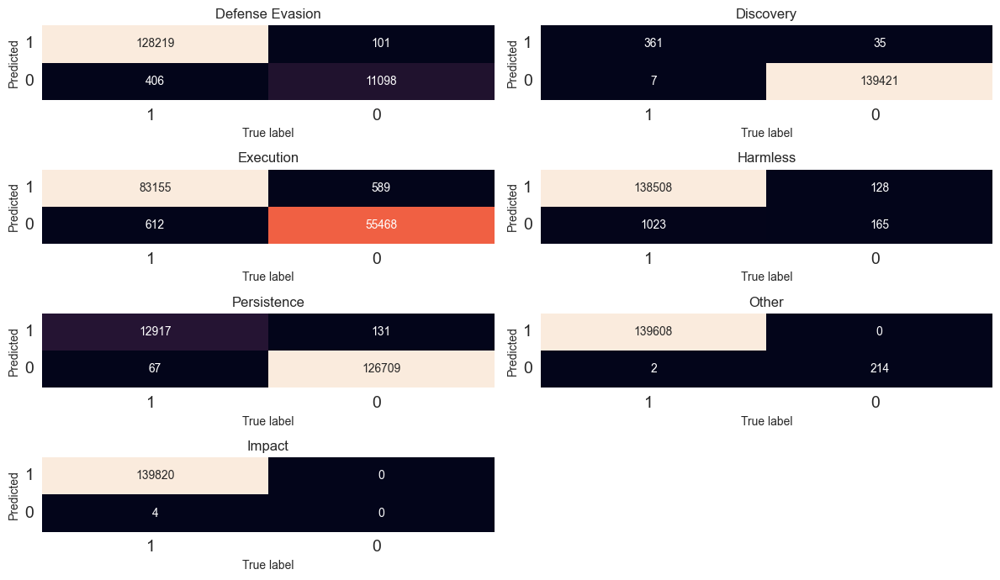

In [32]:
#Print matrix confusion for each class
cm_labels = ll
cm = mcm(label_ids, acc_resultLogits)

def print_confusion_matrix(confusion_matrix, axes, class_label, class_names, fontsize=14):

    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )

    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cbar=False, ax=axes)
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    axes.set_xlabel('True label')
    axes.set_ylabel('Predicted')
    axes.set_title(class_label)

sns.set_style("whitegrid")
fig, ax = plt.subplots(4, 2, figsize=(12, 7))
for axes, cfs_matrix, label in zip(ax.flatten(), cm, cm_labels):
  print_confusion_matrix(cfs_matrix, axes, label, ["1", "0"])
fig.delaxes(ax[3,1]) # remove empty subplot
fig.tight_layout()
plt.show()


Let’s view the summary of the training process.

In [33]:
# Create a DataFrame from our training statistics.
df_stats = pd.DataFrame(data=training_stats)
df_stats = df_stats.set_index('epoch')
df_stats.columns = ['Training Loss', 'Valid. Loss', 'Valid. Accur.', 'Training Time', 'Validation Time', 'state_dict', 'optimizer']
df = df_stats.drop(['state_dict', 'optimizer'], axis=1)
df

,Training Loss,Valid. Loss,Valid. Accur.,Training Time,Validation Time
epoch,,,,,
1,0.024127,0.016984,0.978745,0:10:05,0:02:45
2,0.015426,0.014546,0.979202,0:10:30,0:02:45
3,0.012595,0.013745,0.979479,0:10:30,0:02:51
4,0.010238,0.014215,0.979267,0:10:57,0:02:52


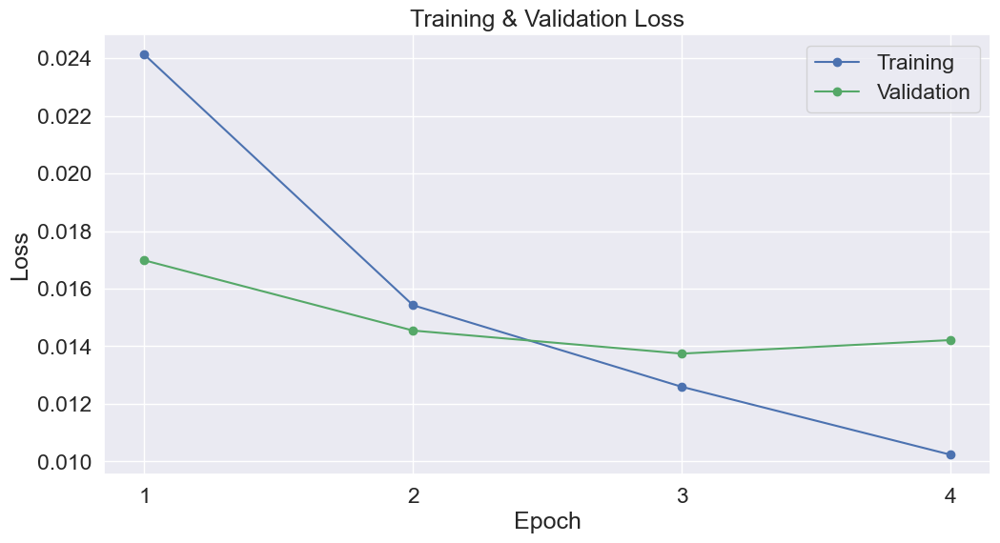

In [34]:
# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(df_stats['Training Loss'], 'b-o', label="Training")
plt.plot(df_stats['Valid. Loss'], 'g-o', label="Validation")

# Label the plot.
plt.title("Training & Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.xticks([1, 2, 3, 4])

plt.show()

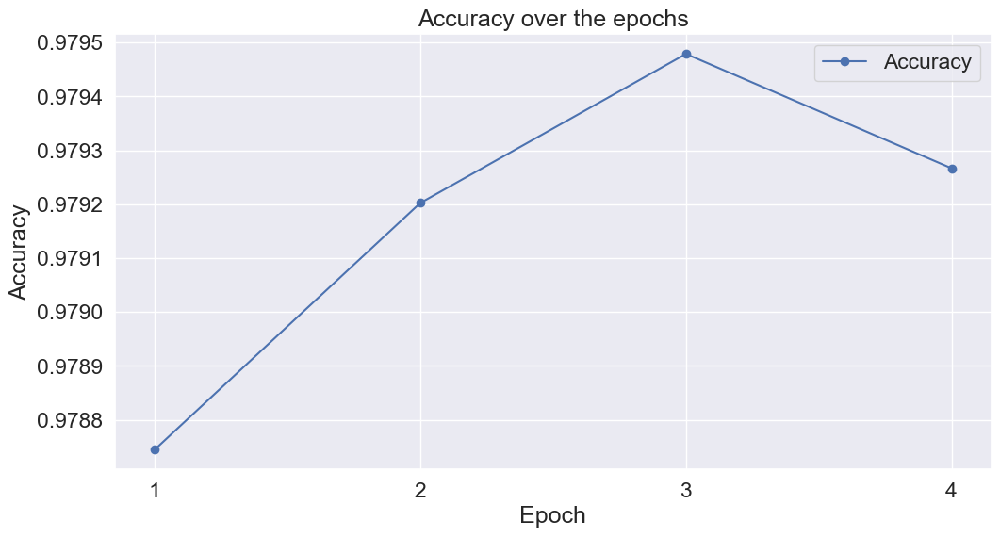

In [35]:
# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(df_stats['Valid. Accur.'], 'b-o', label="Accuracy")

# Label the plot.
plt.title("Accuracy over the epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.xticks([1, 2, 3, 4])

plt.show()

It is now time for the test set, we have to take our best saved model


In [36]:
import torch
from transformers import BertForSequenceClassification
#free space
del model
torch.cuda.empty_cache()

# Load BertForSequenceClassification, the pretrained BERT model with a single
# linear classification layer on top.
model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
    num_labels = 7, # The number of output labels.
    problem_type="multi_label_classification", # The problem type
    output_attentions = False, # Whether the model returns attentions weights.
    output_hidden_states = False, # Whether the model returns all hidden-states.
)
#load the best model we have saved
saved_model = torch.load('best_model.pt')
best_model = saved_model[len(saved_model)-1]
model.load_state_dict(best_model['state_dict'])
model.to(device)
#model.cuda()


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

In [37]:
print(len(saved_model))
print(len(best_model))


3
8


In [43]:

# Create sentence and label lists
sentences = test_dataset.text.values
labels = test_dataset.labels.values.tolist()

# Tokenize all of the sentences and map the tokens to thier word IDs.
input_ids_test = []
attention_masks_test = []
total_t0 = time.time()
t0 = time.time()

# For every sentence...
for number, sent in enumerate(sentences):

    if number % 5000 == 0 and not number == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)
            # Report progress.
            print('  Sentences {:>6,}  of  {:>6,}.    Elapsed: {:}.'.format(number, len(sentences), elapsed))
    # `encode_plus` will:
    #   (1) Tokenize the sentence.
    #   (2) Prepend the `[CLS]` token to the start.
    #   (3) Append the `[SEP]` token to the end.
    #   (4) Map tokens to their IDs.
    #   (5) Pad or truncate the sentence to `max_length`
    #   (6) Create attention masks for [PAD] tokens.
    encoded_dict = tokenizer.encode_plus(
                        sent,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'           # Pad & truncate all sentences.
                        max_length = 90, #more length means more token on a single sentence and more memory usage and slowness => 512 is the max
                        padding='max_length',
                        truncation=True,
                        return_attention_mask = True,   # Construct attn. masks.
                        return_tensors = 'pt',     # Return pytorch tensors.

                   )
    # Add the encoded sentence to the list.
    input_ids_test.append(encoded_dict['input_ids'])

    # And its attention mask (simply differentiates padding from non-padding).
    attention_masks_test.append(encoded_dict['attention_mask'])

# Convert the lists into tensors.
input_ids_test = torch.cat(input_ids_test, dim=0)
attention_masks_test = torch.cat(attention_masks_test, dim=0)
labels = torch.tensor(labels)

# Set the batch size.
batch_size = 32

# Create the DataLoader.
prediction_data = TensorDataset(input_ids_test, attention_masks_test, labels)
prediction_dataloader = DataLoader(prediction_data, batch_size=batch_size, num_workers=2,shuffle=True)

  Sentences  5,000  of  116,518.    Elapsed: 0:00:20.
  Sentences 10,000  of  116,518.    Elapsed: 0:00:40.
  Sentences 15,000  of  116,518.    Elapsed: 0:01:00.
  Sentences 20,000  of  116,518.    Elapsed: 0:01:20.
  Sentences 25,000  of  116,518.    Elapsed: 0:01:40.
  Sentences 30,000  of  116,518.    Elapsed: 0:02:00.
  Sentences 35,000  of  116,518.    Elapsed: 0:02:20.
  Sentences 40,000  of  116,518.    Elapsed: 0:02:39.
  Sentences 45,000  of  116,518.    Elapsed: 0:02:57.
  Sentences 50,000  of  116,518.    Elapsed: 0:03:17.
  Sentences 55,000  of  116,518.    Elapsed: 0:03:37.
  Sentences 60,000  of  116,518.    Elapsed: 0:03:56.
  Sentences 65,000  of  116,518.    Elapsed: 0:04:15.
  Sentences 70,000  of  116,518.    Elapsed: 0:04:34.
  Sentences 75,000  of  116,518.    Elapsed: 0:04:52.
  Sentences 80,000  of  116,518.    Elapsed: 0:05:12.
  Sentences 85,000  of  116,518.    Elapsed: 0:05:30.
  Sentences 90,000  of  116,518.    Elapsed: 0:05:48.
  Sentences 95,000  of  116,

Evaluation for the test set

In [39]:
print('Predicting labels for {:,} test sentences...'.format(len(input_ids)))

# Put model in evaluation mode
model.eval()

# Tracking variables
predictions , true_labels = [], []
total_t0 = time.time()
t0 = time.time()
# Predict
for step,batch in enumerate(prediction_dataloader):
  # Add batch to GPU
  if step % 100 == 0 and not step == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)

            # Report progress.
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(prediction_dataloader), elapsed))
  batch = tuple(t.to(device) for t in batch)

  # Unpack the inputs from our dataloader
  b_input_ids = batch[0].to(device, dtype = torch.long)
  b_input_mask = batch[1].to(device, dtype = torch.long)
  b_labels = batch[2].to(device, dtype = torch.float)

  # Telling the model not to compute or store gradients, saving memory and
  # speeding up prediction
  with torch.no_grad():
      
    logits = model(b_input_ids,
                           token_type_ids=None,
                           attention_mask=b_input_mask).logits
    loss = model(b_input_ids,
                             token_type_ids=None,
                             attention_mask=b_input_mask,
                             labels=b_labels.float()).loss

  
  logits  = torch.sigmoid(logits)
  # Move logits and labels to CPU
  true_labels.extend(b_labels.detach().cpu().numpy().tolist())
  predictions.extend(logits.detach().cpu().numpy().tolist())

print('    DONE.')

Predicting labels for 116,517 test sentences...
  Batch   100  of  3,642.    Elapsed: 0:00:21.
  Batch   200  of  3,642.    Elapsed: 0:00:37.
  Batch   300  of  3,642.    Elapsed: 0:00:52.
  Batch   400  of  3,642.    Elapsed: 0:01:08.
  Batch   500  of  3,642.    Elapsed: 0:01:24.
  Batch   600  of  3,642.    Elapsed: 0:01:40.
  Batch   700  of  3,642.    Elapsed: 0:01:56.
  Batch   800  of  3,642.    Elapsed: 0:02:12.
  Batch   900  of  3,642.    Elapsed: 0:02:28.
  Batch 1,000  of  3,642.    Elapsed: 0:02:44.
  Batch 1,100  of  3,642.    Elapsed: 0:03:00.
  Batch 1,200  of  3,642.    Elapsed: 0:03:16.
  Batch 1,300  of  3,642.    Elapsed: 0:03:31.
  Batch 1,400  of  3,642.    Elapsed: 0:03:47.
  Batch 1,500  of  3,642.    Elapsed: 0:04:03.
  Batch 1,600  of  3,642.    Elapsed: 0:04:19.
  Batch 1,700  of  3,642.    Elapsed: 0:04:35.
  Batch 1,800  of  3,642.    Elapsed: 0:04:51.
  Batch 1,900  of  3,642.    Elapsed: 0:05:07.
  Batch 2,000  of  3,642.    Elapsed: 0:05:23.
  Batch 2,10

Report for the test set

In [40]:
print("Numero totale frasi inserite: ",len(prediction_dataloader)*32)
print("Numero totale prediction fatte : ",len(predictions))
print("Numero totale label da controllare : ",len(true_labels))

# Evaluate each test batch using Matthew's correlation coefficient
print('Calculating Accuracy score')

#modifica predictions portando tutti i valori tra 0 e 1
predictions = ((np.array(predictions) > 0.5).astype(float)).tolist()

# For each input batch...
accuracy = accuracy_score(predictions, true_labels)
print(f"Accuracy Score = {accuracy}")
print(classification_report(true_labels, predictions,zero_division=0,target_names=ll))



Numero totale frasi inserite:  116544
Numero totale prediction fatte :  116518
Numero totale label da controllare :  116518
Calculating Accuracy score
Accuracy Score = 0.9804665373590347
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      9544
      Discovery       1.00      1.00      1.00    116042
      Execution       0.99      0.99      0.99     46404
       Harmless       0.78      0.19      0.30      1126
    Persistence       1.00      1.00      1.00    105595
          Other       1.00      0.95      0.98       171
         Impact       0.00      0.00      0.00        16

      micro avg       1.00      0.99      1.00    278898
      macro avg       0.82      0.73      0.75    278898
   weighted avg       1.00      0.99      0.99    278898
    samples avg       1.00      0.99      1.00    278898



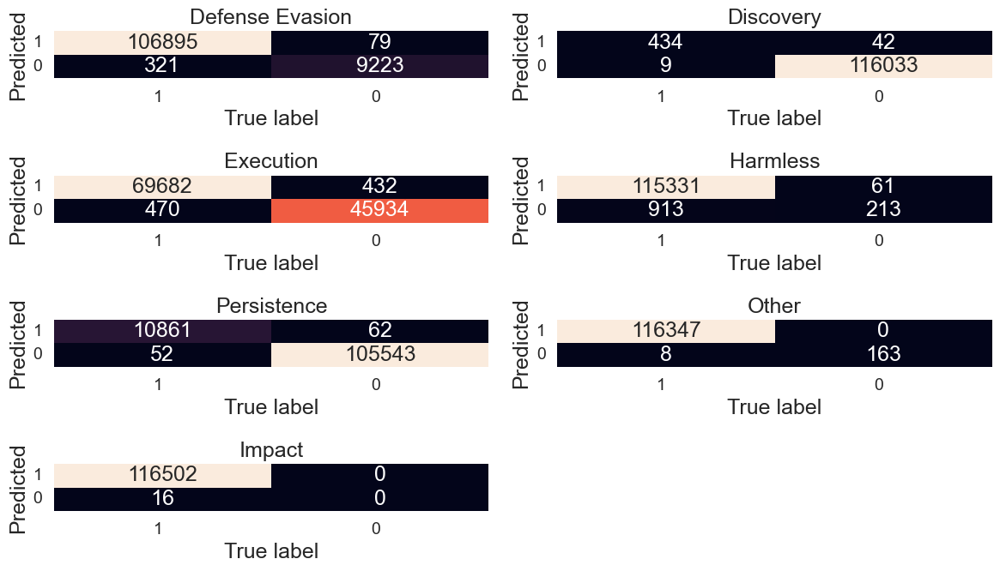

In [41]:
cm_labels = ll
cm = mcm(true_labels, predictions)

sns.set_style("whitegrid")
fig, ax = plt.subplots(4, 2, figsize=(12, 7))
for axes, cfs_matrix, label in zip(ax.flatten(), cm, cm_labels):
  print_confusion_matrix(cfs_matrix, axes, label, ["1", "0"])
fig.delaxes(ax[3,1])
fig.tight_layout()
plt.show()

2. We are now adding a Dense Layer on top of the trained model

In [47]:
import gc
del model
torch.cuda.empty_cache()
gc.collect()

40

We load previous model and add one dense layer and one output layer, taking the same function loss and data


In [48]:
import torch.nn as nn
from transformers import BertForSequenceClassification

class CustomBERTModel(nn.Module):
    def __init__(self):
      super(CustomBERTModel, self).__init__()
      #self.bert = BertModel.from_pretrained("bert-base-uncased",
       #                                         return_dict=False)
      self.bert = BertForSequenceClassification.from_pretrained( 
        "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
        num_labels = 7, # The number of output labels.
        problem_type="multi_label_classification", # The problem type
        output_attentions = False, # Whether the model returns attentions weights.
        output_hidden_states = True, # Whether the model returns all hidden-states.
      )
      saved_model = torch.load('best_model.pt')
      best_model = saved_model[len(saved_model)-1]
      self.bert.load_state_dict(best_model['state_dict'])
      ### New layers:
      self.l1 = torch.nn.Dropout(0.3)
      self.l2 = nn.Linear(768, 384)#dense layer
      self.l3 = nn.Linear(384, 7)## 7 is the number of classes in this example

      self.tanh = nn.Tanh()

    def forward(self, ids, mask, token_type_ids):
      output_1= self.bert(ids, attention_mask = mask, token_type_ids = token_type_ids)
      output_2 = self.l1(output_1.hidden_states[-1][:,0,:])# we take the last hidden state 
      output = self.tanh(self.l2(output_2))
      output = self.l3(output)
      return output

def loss_fn(outputs, targets, weight):
      weight = torch.tensor(weight).to(device)
      return nn.BCEWithLogitsLoss(weight=weight)(outputs, targets)
      


To save time  we can reuse the train_dataloader and the test_dataloader

In [49]:
model = CustomBERTModel()
#model.to(device)
model.cuda()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


CustomBERTModel(
  (bert): BertForSequenceClassification(
    (bert): BertModel(
      (embeddings): BertEmbeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): BertEncoder(
        (layer): ModuleList(
          (0-11): 12 x BertLayer(
            (attention): BertAttention(
              (self): BertSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): BertSelfOutput(
                (dense): Linear(in_features=768, out_features=768,

In [50]:
from transformers import get_linear_schedule_with_warmup

# Note: AdamW is a class from the huggingface library (as opposed to pytorch)
# I believe the 'W' stands for 'Weight Decay fix"
optimizer = torch.optim.AdamW(model.parameters(),
                  lr = 5e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                  eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                )

# Number of training epochs. The BERT authors recommend between 2 and 4.
# We chose to run for 4, but we'll see later that this may be over-fitting the
# training data.
epochs = 4

# Total number of training steps is [number of batches] x [number of epochs].
# (Note that this is not the same as the number of training samples).
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer,
                                            num_warmup_steps = 0, # Default value in run_glue.py
                                            num_training_steps = total_steps)

3. We fine-tune the last layer on the supervised training set for N epochs

In [51]:
from sklearn.metrics import accuracy_score
import random
# Set the seed value all over the place to make this reproducible.
seed_val = 42
label_ids2=[]
resultLogits2=[]
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

class_weigths = get_class_weigths(dt)

valid_loss_min = np.Inf # track change in validation loss

# We'll store a number of quantities such as training and validation loss,
# validation accuracy, timings and model.
training_stats2 = []

# Measure the total training time for the whole run.
total_t0 = time.time()

# For each epoch...
for epoch_i in range(0, epochs):

    # ========================================
    #               Training
    # ========================================

    # Perform one full pass over the training set.

    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    print('Training...')

    # Measure how long the training epoch takes.
    t0 = time.time()

    # Reset the total loss for this epoch.
    total_train_loss = 0

    # Put the model into training mode. Don't be mislead--the call to
    # `train` just changes the *mode*, it doesn't *perform* the training.
    # `dropout` and `batchnorm` layers behave differently during training
    # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
    model.train()

    # For each batch of training data...
    for step, batch in enumerate(train_dataloader):

        # Progress update every 100 batches.
        if step % 100 == 0 and not step == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)

            # Report progress.
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))
            #print(loss.item())
            #print(logits)

        # Unpack this training batch from our dataloader.
        #
        # As we unpack the batch, we'll also copy each tensor to the GPU using the
        # `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids
        #   [1]: attention masks
        #   [2]: labels
        b_input_ids = batch[0].to(device, dtype = torch.long)
        b_input_mask = batch[1].to(device, dtype = torch.long)
        b_labels = batch[2].to(device, dtype = torch.float)

        # Always clear any previously calculated gradients before performing a
        # backward pass. PyTorch doesn't do this automatically because
        # accumulating the gradients is "convenient while training RNNs".
        # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
        #model.zero_grad()
        optimizer.zero_grad()
        # Perform a forward pass (evaluate the model on this training batch).
        # The documentation for this `model` function is here:
        # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
        # It returns different numbers of parameters depending on what arguments
        # arge given and what flags are set. For our useage here, it returns
        # the loss (because we provided labels) and the "logits"--the model
        # outputs prior to activation.
        # Accumulate the training loss over all of the batches so that we can
        # calculate the average loss at the end. `loss` is a Tensor containing a
        # single value; the `.item()` function just returns the Python value

        output = model(b_input_ids,
                                mask=b_input_mask,
                                token_type_ids=None)
        optimizer.zero_grad()
        loss = loss_fn(output, b_labels.float(), class_weigths)
        optimizer.zero_grad()
        # Perform a backward pass to calculate the gradients.

        loss.backward()
        # Clip the norm of the gradients to 1.0.
        # This is to help prevent the "exploding gradients" problem.
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        # Update parameters and take a step using the computed gradient.
        # The optimizer dictates the "update rule"--how the parameters are
        # modified based on their gradients, the learning rate, etc.
        optimizer.step()

        # Update the learning rate.
        scheduler.step()
        #sum the loss value
        total_train_loss += loss.item()
        

    # Calculate the average loss over all of the batches.
    avg_train_loss = total_train_loss / len(train_dataloader)

    # Measure how long this epoch took.
    training_time = format_time(time.time() - t0)

    print("")
    print("  Average training loss: {0:.10f}".format(avg_train_loss))
    print("  Training epoch took: {:}".format(training_time))

    # ========================================
    #               Validation
    # ========================================

    # After the completion of each training epoch, measure our performance on
    # our validation set.

    print("")
    print("Running Validation...")

    t0 = time.time()

    # Put the model in evaluation mode--the dropout layers behave differently
    # during evaluation.
    model.eval()

    # Tracking variables
    total_eval_accuracy = 0
    total_eval_loss = 0
    nb_eval_steps = 0

    # Evaluate data for one epoch
    for batch,data  in enumerate(validation_dataloader):

        # Unpack this training batch from our dataloader.
        #
        # As we unpack the batch, we'll also copy each tensor to the GPU using
        # the `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids
        #   [1]: attention masks
        #   [2]: labels
        b_input_ids = data[0].to(device, dtype = torch.long)
        b_input_mask = data[1].to(device, dtype = torch.long)
        b_labels = data[2].to(device, dtype = torch.float)

        # Tell pytorch not to bother with constructing the compute graph during
        # the forward pass, since this is only needed for backprop (training).
        with torch.no_grad():
            # Forward pass, calculate logit predictions.
            # token_type_ids is the same as the "segment ids", which
            # differentiates sentence 1 and 2 in 2-sentence tasks.
            # The documentation for this `model` function is here:
            # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
            # Get the "logits" output by the model.
            output = model(b_input_ids,
                             token_type_ids=None,
                             mask=b_input_mask)
            loss = loss_fn(output, b_labels, class_weigths)

        # Accumulate the validation loss.
        total_eval_loss += loss.item()
        

        # Move logits and labels to CPU
        # Real labels
        label_ids2.extend(b_labels.detach().cpu().numpy().tolist())
        output = torch.sigmoid(output)
        # Predicted labels
        resultLogits2.extend(output.detach().cpu().numpy().tolist())


    acc_resultLogits2 = (np.array(resultLogits2) > 0.5).astype(float)

    #Report the final accuracy for this validation run.
    accuracy = accuracy_score( label_ids2 , acc_resultLogits2)
    print(f"Accuracy Score = {accuracy}")

    # Calculate the average loss over all of the batches.
    avg_val_loss = total_eval_loss / len(validation_dataloader)

    # Measure how long the validation run took.
    validation_time = format_time(time.time() - t0)

    print("  Validation Loss: {0:.10f}".format(avg_val_loss))
    print("  Validation took: {:}".format(validation_time))

    # Record all statistics from this epoch.
    training_stats2.append(
        {
            'epoch': epoch_i + 1,
            'Training Loss': avg_train_loss,
            'Valid. Loss': avg_val_loss,
            'Valid. Accur.': accuracy,
            'Training Time': training_time,
            'Validation Time': validation_time,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict()
        }
    )
    # save checkpoint after each epoch
    save_ckp(training_stats2, False, "upmodel/model", "best_upmodel", epoch_i+1)
    if avg_val_loss < valid_loss_min:
        print('Validation loss decreased ({:.10f} --> {:.10f}).  Saving model ...'.format(valid_loss_min,avg_val_loss))
        # save checkpoint as best model
        save_ckp(training_stats2, True,"upmodel/model", "best_upmodel",epoch_i+1)
        valid_loss_min = avg_val_loss
print("")
print("Training complete!")

print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))


======== Epoch 1 / 4 ========
Training...
  Batch   100  of  2,549.    Elapsed: 0:00:25.
  Batch   200  of  2,549.    Elapsed: 0:00:48.
  Batch   300  of  2,549.    Elapsed: 0:01:12.
  Batch   400  of  2,549.    Elapsed: 0:01:35.
  Batch   500  of  2,549.    Elapsed: 0:01:59.
  Batch   600  of  2,549.    Elapsed: 0:02:22.
  Batch   700  of  2,549.    Elapsed: 0:02:45.
  Batch   800  of  2,549.    Elapsed: 0:03:09.
  Batch   900  of  2,549.    Elapsed: 0:03:32.
  Batch 1,000  of  2,549.    Elapsed: 0:03:56.
  Batch 1,100  of  2,549.    Elapsed: 0:04:19.
  Batch 1,200  of  2,549.    Elapsed: 0:04:43.
  Batch 1,300  of  2,549.    Elapsed: 0:05:06.
  Batch 1,400  of  2,549.    Elapsed: 0:05:30.
  Batch 1,500  of  2,549.    Elapsed: 0:05:53.
  Batch 1,600  of  2,549.    Elapsed: 0:06:17.
  Batch 1,700  of  2,549.    Elapsed: 0:06:40.
  Batch 1,800  of  2,549.    Elapsed: 0:07:03.
  Batch 1,900  of  2,549.    Elapsed: 0:07:27.
  Batch 2,000  of  2,549.    Elapsed: 0:07:50.
  Batch 2,100  of

In [52]:
from sklearn.metrics import multilabel_confusion_matrix as mcm, classification_report
print(classification_report(label_ids2, acc_resultLogits2,zero_division=0, target_names=ll))


                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98     11100
      Discovery       1.00      1.00      1.00    139272
      Execution       0.99      0.99      0.99     55628
       Harmless       0.57      0.27      0.37      1344
    Persistence       1.00      1.00      1.00    127044
          Other       1.00      1.00      1.00       140
         Impact       0.00      0.00      0.00        24

      micro avg       0.99      0.99      0.99    334552
      macro avg       0.79      0.75      0.76    334552
   weighted avg       0.99      0.99      0.99    334552
    samples avg       1.00      0.99      0.99    334552



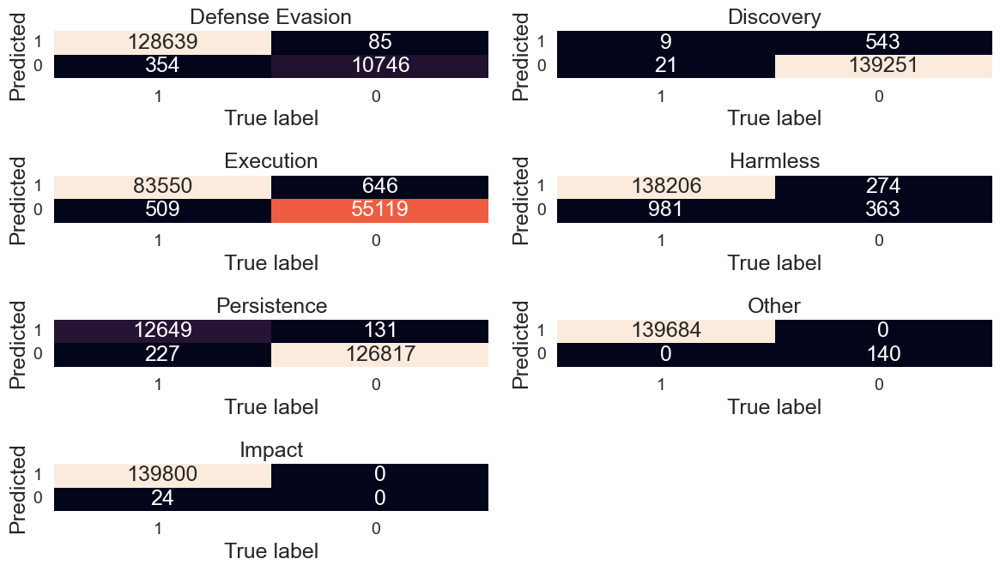

In [53]:
cm_labels = ll
cm = mcm(label_ids2, acc_resultLogits2)
def print_confusion_matrix(confusion_matrix, axes, class_label, class_names, fontsize=14):

    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )

    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cbar=False, ax=axes)
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    axes.set_xlabel('True label')
    axes.set_ylabel('Predicted')
    axes.set_title(class_label)
sns.set_style("whitegrid")
fig, ax = plt.subplots(4, 2, figsize=(12, 7))
for axes, cfs_matrix, label in zip(ax.flatten(), cm, cm_labels):
  print_confusion_matrix(cfs_matrix, axes, label, ["1", "0"])
fig.delaxes(ax[3,1]) # remove empty subplot
fig.tight_layout()
plt.show()

In [54]:
df_stats = pd.DataFrame(data=training_stats2)
df_stats = df_stats.set_index('epoch')
df_stats.columns = ['Training Loss', 'Valid. Loss', 'Valid. Accur.', 'Training Time', 'Validation Time', 'state_dict', 'optimizer']
df = df_stats.drop(['state_dict', 'optimizer'], axis=1)
df

,Training Loss,Valid. Loss,Valid. Accur.,Training Time,Validation Time
epoch,,,,,
1,0.015134,0.010225,0.974682,0:09:59,0:01:20
2,0.008709,0.009651,0.975169,0:09:57,0:01:21
3,0.007005,0.010075,0.975112,0:10:04,0:01:21
4,0.005454,0.011090,0.975026,0:10:10,0:01:24


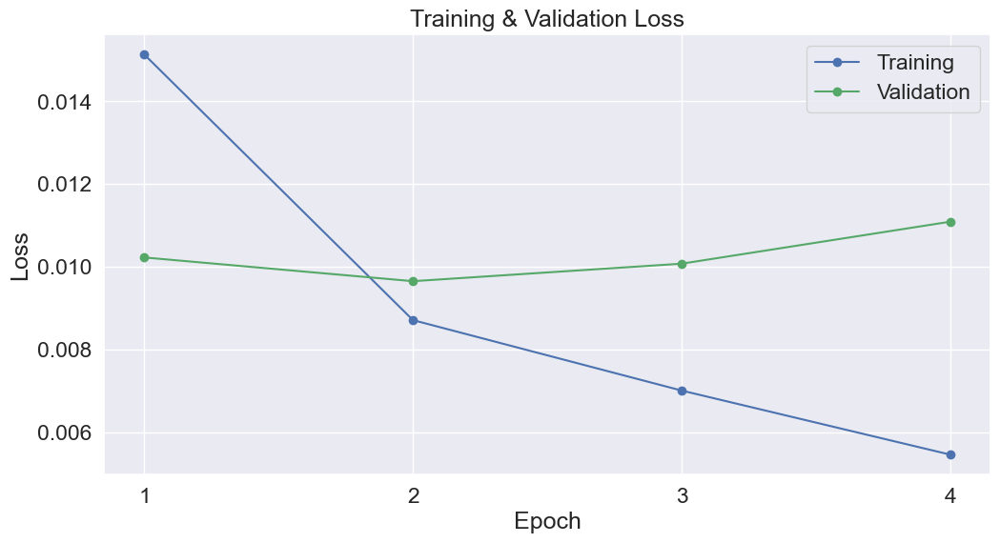

In [55]:
# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(df_stats['Training Loss'], 'b-o', label="Training")
plt.plot(df_stats['Valid. Loss'], 'g-o', label="Validation")

# Label the plot.
plt.title("Training & Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.xticks([1, 2, 3, 4])

plt.show()

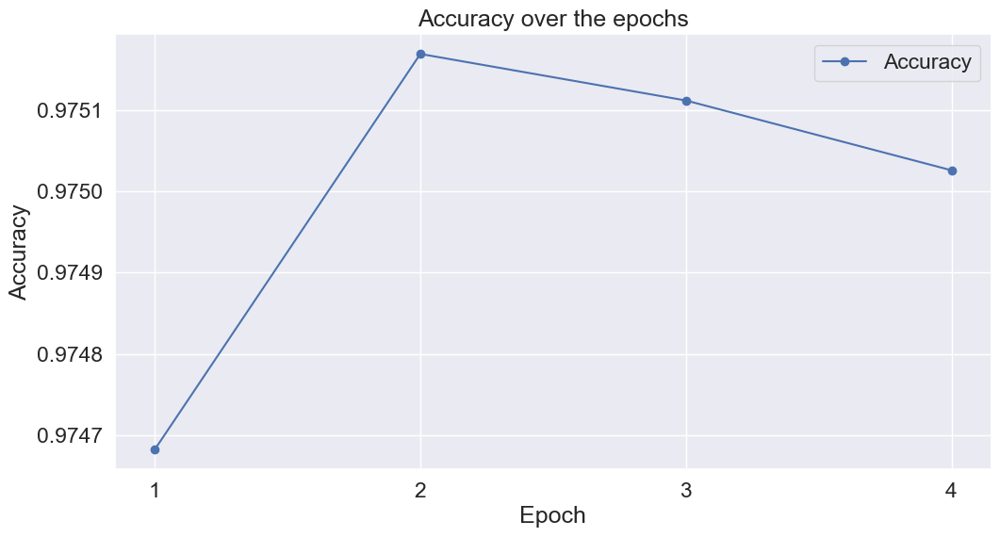

In [62]:
# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(df_stats['Valid. Accur.'], 'b-o', label="Accuracy")

# Label the plot.
plt.title("Accuracy over the epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.xticks([1, 2, 3, 4])

plt.show()

We take the best upgraded model to evaluate on the test set

In [56]:
import torch.nn as nn
from transformers import BertForSequenceClassification

class CustomBERTModel(nn.Module):
    def __init__(self):
      super(CustomBERTModel, self).__init__()
      #self.bert = BertModel.from_pretrained("bert-base-uncased",
       #                                         return_dict=False)
      self.bert = BertForSequenceClassification.from_pretrained( 
        "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
        num_labels = 7, # The number of output labels.
        problem_type="multi_label_classification", # The problem type
        output_attentions = False, # Whether the model returns attentions weights.
        output_hidden_states = True, # Whether the model returns all hidden-states.
      )
      ### New layers:
      self.l1 = torch.nn.Dropout(0.3)
      self.l2 = nn.Linear(768, 384)#dense layer
      self.l3 = nn.Linear(384, 7)## 7 is the number of classes in this example
      self.tanh = nn.Tanh()
      
      saved_model = torch.load('best_upmodel.pt')
      best_model = saved_model[len(saved_model)-1]
      self.load_state_dict(best_model['state_dict'])

    def forward(self, ids, mask, token_type_ids):
      output_1= self.bert(ids, attention_mask = mask, token_type_ids = token_type_ids)
      output_2 = self.l1(output_1.hidden_states[-1][:,0,:])# we take the last hidden state 
      output = self.tanh(self.l2(output_2))
      output = self.l3(output)
      return output
# Obtain the class weights
def get_class_weigths(df):
	class_weigths = list()
	labels = ll
	total_count = df.shape[0]# doesnt matter which column we count
 
	for i, label in enumerate(labels):
		# count instances of current label in the dataset
		label_count = df['labels'].apply(lambda x: x[i] == 1).sum()
		#print(label_count)
		rev_freq = 1 - (label_count / total_count)
 
		class_weigths.append(rev_freq)
	return class_weigths

def loss_fn(outputs, targets, weigth):
      weight = torch.tensor(weigth).to(device)
      return nn.BCEWithLogitsLoss(weight=weight)(outputs, targets)
      #return nn.MSELoss()(outputs, targets)



In [57]:
import gc
del model
torch.cuda.empty_cache()
gc.collect()

24304

In [58]:
model = CustomBERTModel()
model.to(device)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


CustomBERTModel(
  (bert): BertForSequenceClassification(
    (bert): BertModel(
      (embeddings): BertEmbeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): BertEncoder(
        (layer): ModuleList(
          (0-11): 12 x BertLayer(
            (attention): BertAttention(
              (self): BertSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): BertSelfOutput(
                (dense): Linear(in_features=768, out_features=768,

In [59]:
print('Predicting labels for {:,} test sentences...'.format(len(input_ids)))

# Put model in evaluation mode
model.eval()

# Tracking variables
predictions , true_labels = [], []
total_t0 = time.time()
t0 = time.time()
# Predict
for step,batch in enumerate(prediction_dataloader):
  # Add batch to GPU
  if step % 100 == 0 and not step == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)

            # Report progress.
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(prediction_dataloader), elapsed))
  batch = tuple(t.to(device) for t in batch)

  # Unpack the inputs from our dataloader
  b_input_ids = batch[0].to(device, dtype = torch.long)
  b_input_mask = batch[1].to(device, dtype = torch.long)
  b_labels = batch[2].to(device, dtype = torch.float)

  # Telling the model not to compute or store gradients, saving memory and
  # speeding up prediction
  with torch.no_grad():
      # Forward pass, calculate logit predictions
    output = model(b_input_ids,
                             token_type_ids=None,
                             mask=b_input_mask)
    loss = loss_fn(output, b_labels, class_weigths)
  logits  = torch.sigmoid(output)
  # Move logits and labels to CPU
  true_labels.extend(b_labels.detach().cpu().numpy().tolist())
  predictions.extend(logits.detach().cpu().numpy().tolist())

print('    DONE.')

Predicting labels for 116,517 test sentences...
  Batch   100  of  3,642.    Elapsed: 0:00:11.
  Batch   200  of  3,642.    Elapsed: 0:00:19.
  Batch   300  of  3,642.    Elapsed: 0:00:27.
  Batch   400  of  3,642.    Elapsed: 0:00:35.
  Batch   500  of  3,642.    Elapsed: 0:00:42.
  Batch   600  of  3,642.    Elapsed: 0:00:50.
  Batch   700  of  3,642.    Elapsed: 0:00:58.
  Batch   800  of  3,642.    Elapsed: 0:01:06.
  Batch   900  of  3,642.    Elapsed: 0:01:14.
  Batch 1,000  of  3,642.    Elapsed: 0:01:21.
  Batch 1,100  of  3,642.    Elapsed: 0:01:29.
  Batch 1,200  of  3,642.    Elapsed: 0:01:37.
  Batch 1,300  of  3,642.    Elapsed: 0:01:45.
  Batch 1,400  of  3,642.    Elapsed: 0:01:53.
  Batch 1,500  of  3,642.    Elapsed: 0:02:01.
  Batch 1,600  of  3,642.    Elapsed: 0:02:08.
  Batch 1,700  of  3,642.    Elapsed: 0:02:16.
  Batch 1,800  of  3,642.    Elapsed: 0:02:24.
  Batch 1,900  of  3,642.    Elapsed: 0:02:32.
  Batch 2,000  of  3,642.    Elapsed: 0:02:40.
  Batch 2,10

In [60]:
print("Numero totale frasi inserite: ",len(prediction_dataloader)*32)
print("Numero totale prediction fatte : ",len(predictions))
print("Numero totale label da controllare : ",len(true_labels))

# Evaluate each test batch using Matthew's correlation coefficient
print('Calculating Accuracy score')

#modifica predictions portando tutti i valori tra 0 e 1
predictions = ((np.array(predictions) > 0.5).astype(float)).tolist()

# For each input batch...
accuracy = accuracy_score(predictions, true_labels)
print(f"Accuracy Score = {accuracy}")
print(classification_report(true_labels, predictions,zero_division=0,target_names=ll))


Numero totale frasi inserite:  116544
Numero totale prediction fatte :  116518
Numero totale label da controllare :  116518
Calculating Accuracy score
Accuracy Score = 0.9749995708817522
                 precision    recall  f1-score   support

Defense Evasion       0.99      0.97      0.98      9544
      Discovery       1.00      1.00      1.00    116042
      Execution       0.99      0.99      0.99     46404
       Harmless       0.47      0.25      0.33      1126
    Persistence       1.00      1.00      1.00    105595
          Other       1.00      0.95      0.98       171
         Impact       0.00      0.00      0.00        16

      micro avg       1.00      0.99      0.99    278898
      macro avg       0.78      0.74      0.75    278898
   weighted avg       0.99      0.99      0.99    278898
    samples avg       1.00      0.99      0.99    278898



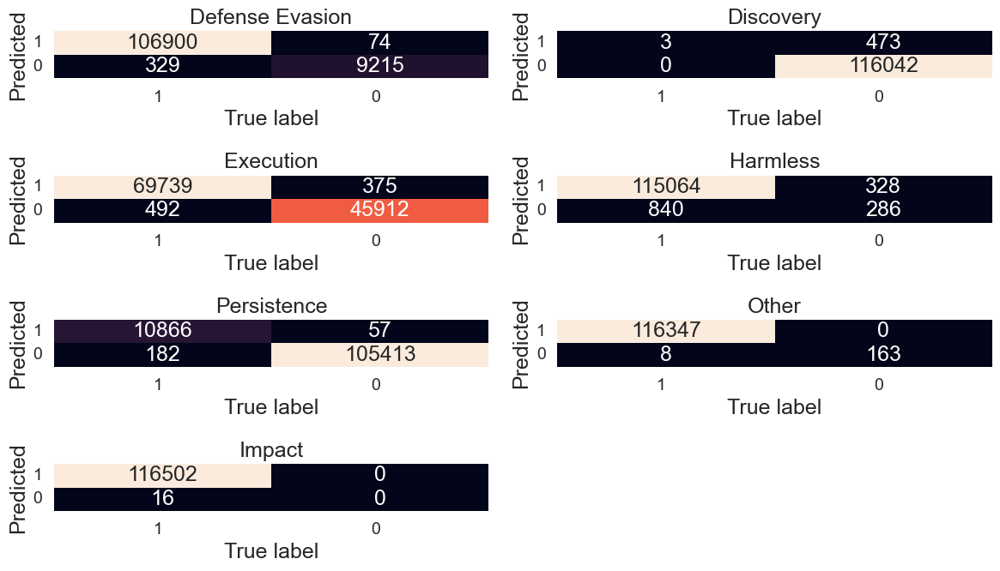

In [61]:
cm_labels = ll
cm = mcm(true_labels, predictions)


sns.set_style("whitegrid")
fig, ax = plt.subplots(4, 2, figsize=(12, 7))
for axes, cfs_matrix, label in zip(ax.flatten(), cm, cm_labels):
  print_confusion_matrix(cfs_matrix, axes, label, ["1", "0"])
fig.delaxes(ax[3,1])
fig.tight_layout()
plt.show()